In [1]:
import os
import sys
import numpy as np
#os.chdir('C:/Code/Github/GLM_python-main')
project_root = 'C:/Code/Github/GLM-analysis/'
if project_root not in sys.path:
    sys.path.append(project_root)

In [2]:
# Import path setup
from utils.path_utils import setup_paths
base_dir = setup_paths()

# Helper functions
from helper_functions.data_trial_plotter import TrialPlotter
from helper_functions.data_trial_divider import TrialDivider

# Core modules
from handlers.DataHandlerEncoding import DataHandlerEncoding as datafun
from utils.Plotter import Plotter as plotterfun
from utils.GLMPredictorProcessor import GLMPredictorProcessor as predictorpro  # or whatever name you choose

from analysis.DecoderAnalyzer import DecoderAnalyzer as analysisdec
from analysis.AnalysisManagerEncoding import AnalysisManagerEncoding as analysisfun


from analysis.DecoderAnalyzer import DecoderAnalyzer as analysisdec
from handlers.DataHandlerDecoding import DataHandlerDecoding as datafundec       
from config.DatasetConfig import DatasetConfig

In [3]:
#main dir to save to
save_results = os.path.join(f'W:\Connie/results\Bassi2025\glm_coupling')#'V:/Connie/results/glm/all_2024')
os.makedirs(save_results, exist_ok=True)

Load Processed Encoding and Decoding Results

In [4]:
#LOAD PICKED FILES TO SAVE TIME (ENCODING) #~1 hr
#initialize encoding handler class
data_handler = datafun(data=None)  # Pass any initial data if needed

save_results = f'W:\Connie/results\Bassi2025\glm_coupling'
results_pre_enc = data_handler.load_pkls(save_results, "pre") #8min
# results_iti = data_handler.load_pkls(save_results, "iti") #3min
results_pass_enc = data_handler.load_pkls(save_results, "pass") #2 #5min
# results_pre = data_handler.load_pkls(save_results, "pre_data1-3") #20sec (1 dataset) (pre_data1-3 for 3 datasets - 1min) for testing


#LOAD (DECODING)
decoded_variables = {'sound_category','shuffled/sound_category','choice', 'shuffled/choice','outcome','shuffled/outcome'}
#initialize decoding handler class
data_handler_dec = datafundec(decoded_variables=decoded_variables)  # Pass any initial data if needed
data_handler_dec_pass = datafundec(decoded_variables= {'sound_category','shuffled/sound_category'})
config = DatasetConfig()

info_dir = 'V:/Connie/results/opto_2024/context/mod'
all_datasets, mouse_dates_keys = config.load_from_info(info_dir, data_handler_dec)
datasets, filtered_keys = config.get_datasets_with_variables(decoded_variables,require_all = False, include_datasets = range(25)) #require_all=True loads minimum variables present in all datasets  range(25)

model_type = 'GLM_3nmf_pre'
_,results_pre_all_sb, _, celltype_info = data_handler_dec.process_multiple_datasets(datasets, model_type,single_balanced=True) 
model_type = 'GLM_3nmf_passive'
_,results_pass_all_sb, _, celltype_info = data_handler_dec_pass.process_multiple_datasets(datasets, model_type,single_balanced=True) 

Loaded file: results_pre.pkl
Loaded file: results_passive.pkl

Unique base variables: {'sound_category', 'outcome', 'choice'}

Including dataset HA11-1R_2023-05-05:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HA11-1R_2023-04-13:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HA2-1L_2023-04-12:
Available variables: {'sound_category', 'choice'}

Including dataset HA2-1L_2023-05-05:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HA1-00_2023-06-29:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HA1-00_2023-08-28:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HE4-1L1R_2023-08-21:
Available variables: {'sound_category', 'outcome', 'choice'}

Including dataset HE4-1L1R_2023-08-24:
Available variables: {'sound_category', 'choice'}

Including dataset HA10-1L_2023-04-10:
Available variables: set()

Including dataset HA10-1L_2023-

In [5]:
#Initialize plotting class

# Define colors dictionary
colors_dict = {
    'pyr': (0.37, 0.75, 0.49), 
    'som': (0.17, 0.35, 0.8), 
    'pv': (0.82, 0.04, 0.04)
}

plotter = plotterfun(data = None,celltypecolors=colors_dict, save_results= save_results)


Load and plot coupling predictors aligned to task events

In [61]:
# LOAD PREDICTORS (INCLUDING COUPLING PREDICTORS) AND ALIGN THEM!
combined_B_weights, feature_names, other_weights, coupling_weights, coupling_indices,celltype_array, neuron_groups, start_indices = data_handler.aggregate_model_data_from_results(results_pre_enc,0)
predictorfun = predictorpro(neuron_groups=neuron_groups)

alignment ={}
alignment['type'] = 'pre' #'stimulus' #pre, stimulus
#40sec per dataset
all_vars, aligned_behav, aligned_coupling = predictorfun.load_and_align_predictors_datasets(datasets = datasets, model_type = 'pre',alignment =alignment) #passive
# Get concatenated predictors (trials x vars x frames)

#do passive alignment also
alignment ={}
alignment['type'] = 'stimulus' #pre, stimulus
#40sec per dataset
all_vars_pass, aligned_behav_pass, aligned_coupling_pass = predictorfun.load_and_align_predictors_datasets(datasets = datasets, model_type = 'passive',alignment =alignment) #passive

HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30
Processing dataset: HA11-1R_2023-05-05


MemoryError: Unable to allocate 1.09 GiB for an array with shape (42210, 3465) and data type float64

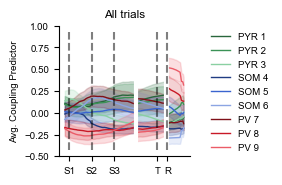

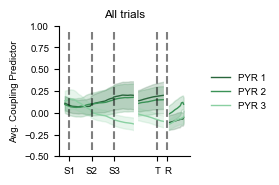

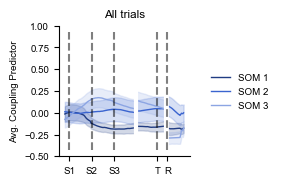

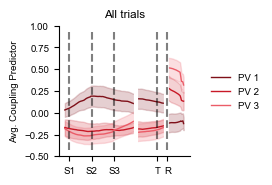

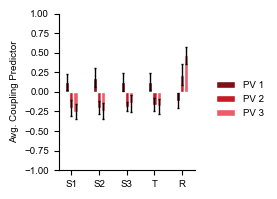

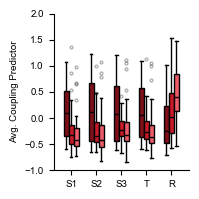

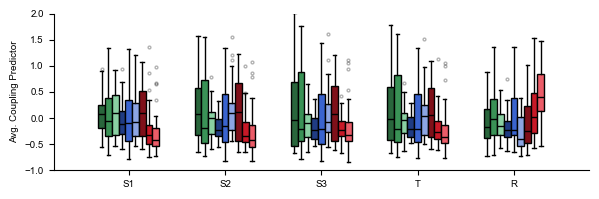

In [ ]:
#PLOT COUPLING PREDICTORS ALIGNED TO TASK EVENTS (SEPARATED BY CELL TYPE)
colors_list=["#29663C", '#3A9256', '#8AD0A2','#203C83', '#3A64CF', '#8CA5E3', '#7F1019', '#C81927', '#EB5C68']
factors_to_plot = [0,1,2]
factor_labels_list = ['PYR 1','PYR 2','PYR 3','SOM 1','SOM 2','SOM 3','PV 1','PV 2','PV 3']
string_name = 'pyr'
model_to_plot = 'pre'
if model_to_plot == 'pre':
    # compare matrices and match factors
    avg_results_datasets,avg_results_datasets_interval = predictorfun.match_and_aggregate_factors(aligned_predictors_dict = aligned_coupling,
                                        condition_array_dict = all_vars,
                                        fields_to_separate = None,
                                        event_frames=plotter.event_frames)
else:
    # compare matrices and match factors
    avg_results_datasets,avg_results_datasets_interval = predictorfun.match_and_aggregate_factors(aligned_predictors_dict = aligned_coupling_pass,
                                        condition_array_dict = all_vars_pass,
                                        fields_to_separate = None,
                                        event_frames=plotter.event_frames)


plotter.plot_avg_predictors_by_condition(
    avg_results=avg_results_datasets,
    dataset_key='all_datasets',
    title_prefix='',
    colors=["#29663C", '#3A9256', '#8AD0A2','#203C83', '#3A64CF', '#8CA5E3', '#7F1019', '#C81927', '#EB5C68'],
    ylims=(-.5, 1),
    celltype = ['pyr','som','pv'],
    figsize = (2,2),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_traces.pdf'
)


plotter.plot_avg_predictors_by_condition(
    avg_results=avg_results_datasets,
    dataset_key='all_datasets',
    title_prefix='',
    colors=["#29663C", '#3A9256', '#8AD0A2'],
    ylims=(-.5, 0.75),
    celltype = ['pyr'],
    figsize = (2,2),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_pyr_traces.pdf'
)

plotter.plot_avg_predictors_by_condition(
    avg_results=avg_results_datasets,
    dataset_key='all_datasets',
    title_prefix='',
    colors=['#203C83', '#3A64CF', '#8CA5E3'],
    ylims=(-.5, 0.75),
    celltype = ['som'],
    figsize = (2,2),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_som_traces.pdf'
)

plotter.plot_avg_predictors_by_condition(
    avg_results=avg_results_datasets,
    dataset_key='all_datasets',
    title_prefix='',
    colors=[ '#7F1019', '#C81927', '#EB5C68'],
    ylims=(-.5, 0.75),
    celltype = ['pv'],
    figsize = (2,2),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_pv_traces.pdf'
)

#BAR PLOT AVERAGE VALUES ACROSS TIME INTERVALS
plotter.bar_plot_avg_predictor_intervals(
    avg_results=avg_results_datasets_interval,
    dataset_key='all_datasets',
    factors = factors_to_plot,
    factor_labels=[factor_labels_list[i] for i in factors_to_plot],
    colors=[colors_list[i] for i in factors_to_plot],
    bar_width=0.15, #.3 or .15
    ylims=(-1,1),
    figsize = (2,2),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_{string_name}_barplot.pdf'  
)

# plotter.bar_box_plot_avg_predictor_intervals(
#     avg_results=avg_results_datasets,
#     # dataset_key='all_datasets',
#     factors = factors_to_plot,
#     factor_labels=[factor_labels_list[i] for i in factors_to_plot],
#     colors=[colors_list[i] for i in factors_to_plot],
#     bar_width=0.2, #.3 or .15
#     ylims=(-1,2),
#     figsize = (2,2),
#     plot_type='box',
#     save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_{string_name}_boxplot.pdf'  
# )

factors_to_plot = range(0,9)
plotter.bar_box_plot_avg_predictor_intervals(
    avg_results=avg_results_datasets,
    # dataset_key='all_datasets',
    factors = factors_to_plot,
    factor_labels=[factor_labels_list[i] for i in factors_to_plot],
    colors=[colors_list[i] for i in factors_to_plot],
    bar_width=0.07, #.3 or .15
    ylims=(-1,2),
    figsize = (2*3,2),
    plot_type='box',
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\coupling_predictors/{model_to_plot}_avg_predictors_all_boxplot.pdf'  
)

Compute Coupling Index and Decoding Peaks!

model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
Recalculating coupling index using neurons present across all comparisons and models...
Cell Type: pyr, Number of common non-NaN neurons across all comparisons and models: 1281
Cell Type: som, Number of common non-NaN neurons across all comparisons and models: 175
Cell Type: pv, Number of common non-NaN neurons across all comparisons and models: 349

PYR Cell Type: No Coupling vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Coupling vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Coupling vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


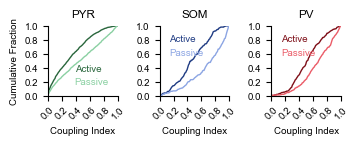


PYR Cell Type: No Pyr vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pyr vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pyr vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


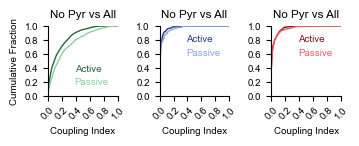


PYR Cell Type: No Som vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Som vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Som vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


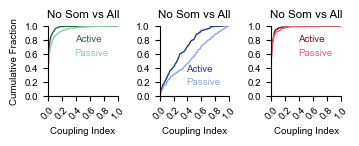


PYR Cell Type: No Pv vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pv vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pv vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


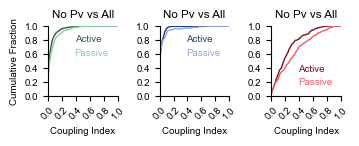

In [7]:
#Coupling Index

results_list = [results_pre_enc,results_pass_enc]
model_types = [ 'Active', 'Passive'] #['Active Task', 'Active ITI', 'Passive']

comparisons = [('No Coupling','All'),
        ('No Pyr','All'),
        ('No Som','All'),
        ('No Pv','All')]
color_map_dict = {('pyr', 'Active'): '#29663C', ('pyr', 'Active ITI'): '#3A9256', ('pyr', 'Passive'): '#8AD0A2',
                   ('som', 'Active'): '#203C83', ('som', 'Active ITI'): '#3A64CF', ('som', 'Passive'): '#8CA5E3', 
                   ('pv', 'Active'): '#7F1019', ('pv', 'Active ITI'): '#C81927', ('pv', 'Passive'): '#EB5C68'}
plotter_context = plotterfun(data = None,celltypecolors=plotter.celltypecolors, save_results= save_results, color_map_dict =  color_map_dict)
analysis_manager = analysisfun(data = None, plotter=plotter_context)
coupling_index_by_celltype,_ = analysis_manager.plot_coupling_index_across_celltypes_cdf(results_list, 
         model_types, comparisons=comparisons,recalculate_modulation= True, figsize = (3*1.2,1.2*1.5), threshold = 0.05) #figsize = (3*1.3,1.3*1.5)


#Decoding Peaks
analysis_dec = analysisdec(celltype_info)
celltype_label_map = {
    0: "Pyr",   # adjust if your convention is different
    1: "SOM",
    2: "PV"
}


peak_info_struc, peak_info_all_celltypes = analysis_dec.compute_peak_info_by_celltype(results_pre_all_sb,
                                  celltype_assignments = {
                                                        ds: results_pre_all_sb[ds]['celltype_array']
                                                        for ds in results_pre_all_sb
                                                        },
                                  features = ['sound_category','choice','outcome'],
                                  metric = 'sc_instantaneous_information_mean',
                                  frame_windows = {
                                                        'sound_category': (14, 100),  # adjust as needed
                                                        'choice': (14, 169),          # adjust as needed
                                                        'outcome': (14, 169)          # adjust as needed
                                                    },
                                  celltype_label_map=celltype_label_map)


peak_info_struc_pass, peak_info_all_celltypes_pass = analysis_dec.compute_peak_info_by_celltype(results_pass_all_sb,
                                  celltype_assignments = {
                                                        ds: results_pass_all_sb[ds]['celltype_array']
                                                        for ds in results_pass_all_sb
                                                        },
                                  features = ['sound_category'],
                                  metric = 'sc_instantaneous_information_mean',
                                  frame_windows = {
                                                        'sound_category': (14, 100)
                                                    },
                                  celltype_label_map=celltype_label_map)

peak_struc = {}
peak_struc['Active'] = peak_info_struc
peak_struc['Passive'] = peak_info_struc_pass

PV: r=-0.030, p=0.6241, n=269
PYR: r=-0.041, p=0.3104, n=615
SOM: r=0.111, p=0.1746, n=150
Pearson r: 0.13, p-value: 0.000


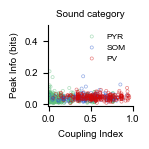

In [31]:
import numpy as np
import os
import pickle
import scipy
import random
import pandas as pd

import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
import itertools

#IMPORT PLOTTING FUNCTIONS!
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from scipy.stats import wilcoxon
from scipy.stats import pearsonr
from scipy.stats import sem
import matplotlib.patches as patches
import matplotlib.cm as cm
import matplotlib.colors as mc
from matplotlib_venn import venn2
from matplotlib.patches import Patch

#import stats class
from utils.general_stats import GeneralStats
from scipy.stats import chi2_contingency
from utils.GLMDataUtils import GLMDataUtils

from matplotlib.colors import to_hex
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker

def plot_coupling_index_vs_decoding_info_v2(
        coupling_index_by_celltype,
        peak_info_struc,
        decoded_feature='sound_category',
        state='Active',
        threshold=None,
        celltype_colors={'pyr': (0.37, 0.75, 0.49), 'som': (0.17, 0.35, 0.8), 'pv': (0.82, 0.04, 0.04)},
        figsize=(3, 3),
        marker_size=20,
        peak_to_get = 'peak_values',
        alpha = 1,
        save_path = None,
        ylim=(-.01, .5),
        xlim=(-0.01, 1.01)
    ):
        """
        Plots coupling index vs peak decoding info for each neuron (all datasets pooled).
        Optionally threshold coupling index.
        """
        mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)
        all_rows = []

        for dataset in peak_info_struc:
            for cell_type in peak_info_struc[dataset]:

                # Get decoding info
                info = peak_info_struc[dataset][cell_type].get(decoded_feature, None)
                if info is None:
                    print(f"Missing decoding info for {dataset}, {cell_type}, {decoded_feature}")
                    continue

                peak_vals = info[peak_to_get]
                if peak_to_get == 'peak_frames':
                    peak_vals = peak_vals/169 #normalize by number of frames
                neuron_indices = info['neuron_indices'].flatten()

                # Get coupling index
                try:
                    coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type.lower()][state]
                except KeyError:
                    print(f"Missing coupling index for {dataset}, {cell_type}, {state}")
                    continue

                for i, neuron_idx in enumerate(neuron_indices):
                    if neuron_idx >= len(coupling_vals):
                        continue
                    if coupling_vals[neuron_idx] < 0 or  np.isnan(coupling_vals[neuron_idx]):
                        continue

                    row = {
                        'dataset': dataset,
                        'cell_type': cell_type.lower(),
                        'neuron_idx': neuron_idx,
                        'coupling_index': coupling_vals[neuron_idx],
                        'peak_info': peak_vals[i],
                    }

                    if threshold is not None or row['coupling_index'] > threshold:
                        all_rows.append(row)

        df = pd.DataFrame(all_rows)

        # Plot
        plt.figure(figsize=figsize)
        for cell_type, color in celltype_colors.items():
            sub = df[df['cell_type'] == cell_type]
            plt.scatter(
                sub['coupling_index'],
                sub['peak_info'],
                label=cell_type.upper(),
                facecolors='none',
                edgecolors=color,
                s=marker_size,
                linewidth=.5,
                alpha=alpha
            )
        
        for cell_type in df['cell_type'].unique():
            sub = df[df['cell_type'] == cell_type]
            r, p = pearsonr(sub['coupling_index'], sub['peak_info'])
            print(f"{cell_type.upper()}: r={r:.3f}, p={p:.4f}, n={len(sub)}")

        # Correlation
        r, p = pearsonr(df['coupling_index'], df['peak_info'])
        print(f"Pearson r: {r:.2f}, p-value: {p:.3f}")
        plt.title(f'{decoded_feature.capitalize()}', fontsize=7) 
        if decoded_feature == 'sound_category':
            plt.title('Sound category', fontsize=7)
        # plt.title(f'{decoded_feature}\nr = {r:.2f}, p = {p:.3f}', fontsize=8)

        plt.xlabel('Coupling Index', fontsize=7)
        plt.ylabel('Peak Info (bits)', fontsize=7)
        ax = plt.gca()
        ax.set_ylim(ylim)
        ax.set_xlim(-.01, 1.01)
        # ax.set_yticklabels(ax.get_yticks(), fontsize=7)
        # ax.set_xticklabels(ax.get_xticks(), fontsize=7)
        ax.set_xticks([0, 0.5, 1])
        ax.tick_params(axis='both', labelsize=7)
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
        plt.legend(frameon=False, fontsize=6)
        sns.despine(right=True, top=True)
        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        plt.show()

        return df

feature = 'sound_category'
top_pyr = True
state = 'Active'
df_ci = plot_coupling_index_vs_decoding_info_v2(
    coupling_index_by_celltype,
    peak_struc[state],
    decoded_feature=feature,
    state=state,
    threshold= 0,
    figsize=(1.5,1.5),
    marker_size=5,
    alpha = .5,
    ylim=(-.01, .5),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{state}.pdf'
)

C:\Code/Github/GLM-analysis\utils\Plotter.py:4650: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=7)
C:\Code/Github/GLM-analysis\utils\Plotter.py:4651: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontsize=7)


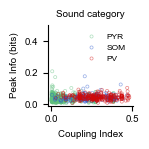

permutation test|| pval: 0.46415358464153583, celltype pyr
PYR: r = -0.04, p = 0.310
permutation test|| pval: 0.272972702729727, celltype som
SOM: r = 0.11, p = 0.175
permutation test|| pval: 0.16718328167183283, celltype pv
PV: r = -0.03, p = 0.624
Saving stats to W:\Connie/results\Bassi2025\glm_coupling\supplement


C:\Code/Github/GLM-analysis\utils\Plotter.py:4826: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=7)


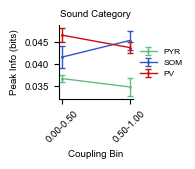

In [ ]:
#Make plots comparing coupling index and peak decoding information

feature = 'sound_category'
top_pyr = True
state = 'Active'
df_ci = plotter.plot_coupling_index_vs_decoding_info(
    coupling_index_by_celltype,
    peak_struc[state],
    decoded_feature=feature,
    state=state,
    threshold= 0,
    figsize=(1.5,1.5),
    marker_size=5,
    alpha = .5,
    ylim=(-.01, .5),
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{state}.pdf'
)

# df_test = plotter.plot_decoding_by_coupling_bin(
#     coupling_index_by_celltype,
#     peak_struc[state],
#     decoded_feature=feature,
#     state=state,
#     celltype_colors=plotter.celltypecolors,
#     figsize=(1.5,1.5),#(2.8, 2.8),
#     marker_size=5,
#     peak_to_get='peak_values',
#     alpha=1,
#     bins= [0, 0.25, 0.5, 0.75, 1],#[0,.5,1],#[0, 0.25, 0.5, 0.75, 1],  # right-inclusive last bin
#     threshold = None,
#     top_neurons = top_pyr ,
#     save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{top_pyr}_2bins_{state}.pdf'
# )
top_pyr = False
df_test = plotter.plot_decoding_by_coupling_bin(
    coupling_index_by_celltype,
    peak_struc[state],
    decoded_feature=feature,
    state=state,
    celltype_colors=plotter.celltypecolors,
    figsize=(2.0,2.0),#(2.5, 2.5),
    marker_size=5,
    peak_to_get='peak_values',
    alpha=1,
    bins= [0,.5,1],#[0,.5,1],#[0, 0.25, 0.5, 0.75, 1],  # right-inclusive last bin
    threshold = None,
    top_neurons = top_pyr ,
    save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{top_pyr}_2bins_{state}.pdf'
)

# top_pyr = True
# df_test = plotter.plot_decoding_by_coupling_bin(
#     coupling_index_by_celltype,
#     peak_struc[state],
#     decoded_feature=feature,
#     state=state,
#     celltype_colors=plotter.celltypecolors,
#     figsize=(2.2,2.2),#(2.5, 2.5),
#     marker_size=5,
#     peak_to_get='peak_values',
#     alpha=1,
#     bins= [0,.5,1],#[0,.5,1],#[0, 0.25, 0.5, 0.75, 1],  # right-inclusive last bin
#     threshold = None,
#     top_neurons = top_pyr ,
#     save_path =f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{top_pyr}_2bins_{state}.pdf'
# )

In [ ]:
results_pre_enc['HA1-00_2023-06-27']['celltype_array']
# coupling_index_by_celltype[('No Coupling','All')]['pyr']
peak_info_struc['HA1-00_2023-06-27']['Pyr']

{'Active': [nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  0.05256734467431351,
  nan,
  nan,
  nan,
  nan,
  nan,
  0.4603275253378343,
  nan,
  nan,
  nan,
  nan,
  nan,
  0.10748552639910687,
  nan,
  nan,
  0.009456113381401088,
  0.6639118279831977,
  0.005442558688146801,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  0.01054579475371752,
  nan,
  0.03942957745128821,
  nan,
  0.17185175233593522,
  nan,
  nan,
  nan,
  nan,
  nan,
  0.6556171102170189,
  0.31993119731246744,
  0.022387247352572148,
  nan,
  0.13589803724476948,
  0.8219596667362844,
  -0.07460991395626035,
  0.2459940333333942,
  nan,
  0.06268402669678357,
  nan,
  nan,
  nan,
  0.0408418362496447,
  nan,
  nan,
  nan,
  nan,
  0.7660607551804509,
  0.07497003902010514,
  0.289887334713573,
  0.1039890480401031,
  nan,
  0.015008078769947034,
  nan,
  nan,
  0.031529958474483775,
  -0.09261196039407599,
  -0.002030857491224034,
  0.04407898775492282,
  nan,
  nan,
  nan,
  nan,
  0.6586080051851312,
  0.0

C:\Users\runyan1\AppData\Local\Temp\ipykernel_25676\3563333759.py:94: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['CI_z'] = df.groupby('dataset')['CI'].transform(lambda x: (x - x.mean())/x.std())
C:\Users\runyan1\AppData\Local\Temp\ipykernel_25676\3563333759.py:95: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['mean_dev_z'] = df.groupby('dataset')['mean_dev'].transform(lambda x: (x - x.mean())/x.std())


<Axes: xlabel='CI', ylabel='decode_bits'>

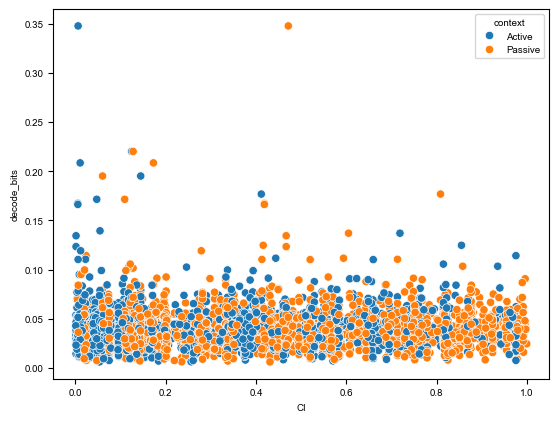

In [43]:
import pandas as pd
import numpy as np

def build_coupling_decoding_dataframe(
        results,
        coupling_index_by_celltype,
        peak_info_struc,
        decoded_feature='sound_category',
        peak_to_get='peak_values'
    ):

    rows = []

    for dataset_key, dataset in results.items():

        # --- Mean deviance explained (NO COUPLING model) ---
        mean_dev_behav = np.array(dataset['mean_dev_behav'])
        celltype_array = dataset['celltype_array']

        cell_types = {0: 'pyr', 1: 'som', 2: 'pv'}

        for state in ['Active', 'Passive']:

            for cell_type in ['pyr','som','pv']:

                # --- Decoding ---
                try:
                    if cell_type == 'pyr':
                        info = peak_info_struc[dataset_key]['Pyr'][decoded_feature]
                    else:
                        info = peak_info_struc[dataset_key][cell_type.upper()][decoded_feature]
                except KeyError:
                    continue

                peak_vals = info[peak_to_get]
                neuron_indices = info['neuron_indices'].flatten()

                # --- Coupling Index ---
                try:
                    coupling_vals = coupling_index_by_celltype[('No Coupling','All')][cell_type][state]
                except KeyError:
                    continue

                for i, neuron_idx in enumerate(neuron_indices):

                    if neuron_idx >= len(coupling_vals):
                        continue

                    ci = coupling_vals[neuron_idx]
                    if np.isnan(ci) or ci < 0:
                        continue

                    row = {
                        'dataset': dataset_key,
                        'cell_type': cell_type,
                        'context': state,
                        'neuron_idx': neuron_idx,
                        'decode_bits': peak_vals[i],
                        'CI': ci,
                        'mean_dev': mean_dev_behav[neuron_idx]
                    }

                    rows.append(row)
    df = pd.DataFrame(rows)

    # Clean
    df = df.dropna()
    df['cell_type'] = df['cell_type'].astype('category')
    df['context'] = df['context'].astype('category')
    df['dataset'] = df['dataset'].astype('category')

    return df

import statsmodels.formula.api as smf

def run_mixed_model(df):

    model = smf.mixedlm(
        "decode_bits ~ CI + mean_dev + cell_type + context",
        df,
        groups=df["dataset"]
    )

    result = model.fit(reml=False)
    print(result.summary())

    return result
df = build_coupling_decoding_dataframe(
        results_pre_enc,
        coupling_index_by_celltype,
        peak_info_struc,
        decoded_feature='sound_category',
        peak_to_get='peak_values')
df['CI_z'] = df.groupby('dataset')['CI'].transform(lambda x: (x - x.mean())/x.std())
df['mean_dev_z'] = df.groupby('dataset')['mean_dev'].transform(lambda x: (x - x.mean())/x.std())

import seaborn as sns
sns.scatterplot(data=df, x='CI', y='decode_bits', hue='context')

In [56]:
datasets

[('HA11-1R', '2023-05-05', 'V:'),
 ('HA11-1R', '2023-04-13', 'V:'),
 ('HA2-1L', '2023-04-12', 'V:'),
 ('HA2-1L', '2023-05-05', 'V:'),
 ('HA1-00', '2023-06-29', 'V:'),
 ('HA1-00', '2023-08-28', 'W:'),
 ('HE4-1L1R', '2023-08-21', 'W:'),
 ('HE4-1L1R', '2023-08-24', 'W:'),
 ('HA10-1L', '2023-04-10', 'V:'),
 ('HA10-1L', '2023-04-17', 'V:'),
 ('HA10-1L', '2023-04-12', 'V:'),
 ('HA11-1R', '2023-04-07', 'V:'),
 ('HA11-1R', '2023-05-01', 'V:'),
 ('HA11-1R', '2023-05-02', 'V:'),
 ('HA2-1L', '2023-04-28', 'V:'),
 ('HA2-1L', '2023-05-01', 'V:'),
 ('HA1-00', '2023-06-27', 'V:'),
 ('HA1-00', '2023-07-07', 'W:'),
 ('HA1-00', '2023-08-25', 'W:'),
 ('HE4-1L1R', '2023-08-14', 'W:'),
 ('HE4-1L1R', '2023-08-28', 'W:'),
 ('HE4-1L1R', '2023-09-04', 'W:'),
 ('HE4-1L1R', '2023-09-11', 'W:'),
 ('HA10-1L', '2023-03-31', 'V:')]

In [60]:
#LOAD ALIGNED DATA! TO MAKE PLOTS
# Import local utilities
from utils.dataset_processor import DatasetProcessor
from utils.cell_visualizer import CellVisualizer
from utils.general_stats import GeneralStats
from helper_functions.data_pipeline import DataPipeline
pipeline = DataPipeline()
current_decoder_type = 'sound_category'
save_results = 'W:\Connie/results\Bassi2025\glm_coupling/'

data_loaders, celltype_info = pipeline.load_data(datasets=[('HA2-1L', '2023-05-05', 'V:')], load_celltypes=True)

peaks_by_celltype = peak_info_struc 
# Sort peaks by information
sorted_peaks,sorted_peaks_more_info = analysis_dec.sort_peaks_by_information(peaks_by_celltype)
# Initialize processor with alignment parameters
processor = DatasetProcessor(alignment={
    'type': 'pre',
    'data_type': 'deconv'
})

fields_to_separate = ['condition','left_turn'] # ['left_turn'] #is_stim_trial, correct, condition
# 
# Create trial divider for condition splitting
trial_divider = TrialDivider()

# Process and align all datasets
aligned_data = processor.process_datasets(
    data_loaders=data_loaders,
    celltype_info=celltype_info,
    save_path='aligned_data.pkl'
)

# For each dataset, create condition splits
for (animalID, date), data in aligned_data.items():
    print(f"\nProcessing {animalID} {date}")
    
    # Create condition splits
    
    all_conditions, condition_array = trial_divider.divide_trials_from_df(
        trial_info_df=data['trial_info'],
        good_trials=data['good_trials'],
        fields_to_separate=fields_to_separate
    )
    
    # Store conditions in aligned_data for later use
    aligned_data[(animalID, date)]['all_conditions'] = all_conditions
    print(f"Found {len(all_conditions)} conditions")

# Verify alignment worked
for (animalID, date), data in aligned_data.items():
    print(f"\nDataset: {animalID} {date}")
    print(f"Aligned imaging shape: {data['aligned_imaging'].shape}")
    print(f"Number of good trials: {len(data['good_trials'])}")
    print(f"Number of conditions: {len(data['all_conditions'])}")

    # Initialize visualization tools
trial_plotter = TrialPlotter()
trial_divider = TrialDivider()
cell_viz = CellVisualizer()

# Create output directories if they don't exist
import os
base_figure_dir = f'{save_results}/figures/{current_decoder_type}'
# os.makedirs(f'{base_figure_dir}/heatmaps', exist_ok=True)
os.makedirs(f'{base_figure_dir}/example_cells', exist_ok=True)
print(f"Base figure directory: {base_figure_dir}")

# PLOT EXAMPLE CELLS (NOT SORTED BY SIGNIFICANCE) - Plot first 3 cells of each type

example_dataset = ['HA11-1R_2023-05-05']
significant_neurons_data = sorted_peaks 
# Plot for each dataset
for dataset in significant_neurons_data:
    # Extract animal ID and date from dataset name
    animalID, date = dataset.split('_')
    
    # Get the aligned data for this dataset
    data = aligned_data[(animalID, date)]
    
    # Create output directory for this dataset
    dataset_dir = os.path.join('figures', 'informative_cells', dataset)
    os.makedirs(dataset_dir, exist_ok=True)
    
    # Plot heatmaps for different cell types
    for cell_type in ['pyr']: #, 'pv', 'som'
        if cell_type in significant_neurons_data[dataset]:
            # Get significant cells for this cell type
            sig_cells = significant_neurons_data[dataset][cell_type]
            
            # Plot example cells for each condition
            for n,cell_id in enumerate(sig_cells[:15]):  # Plot first 3 cells of each type (:3)
                # for trials, comb, label in all_conditions:
                # Create valid filename by replacing problematic characters
                # safe_label = label.replace('/', '_').replace(' ', '_')
                print(f"Plotting {cell_type} cell {cell_id} for {animalID} {date}")
                
                cell_viz.plot_informative_cell(
                    aligned_imaging=data['aligned_imaging'],
                    cell_id=cell_id,
                    all_conditions=data['all_conditions'], #condition_indices=trials,
                    title_base=f'{animalID} {date} {cell_type} Cell {cell_id} ', #- {label}
                    peak_info = sorted_peaks_more_info[dataset][cell_type]['peak_values'][n], #peaks_by_celltype[dataset][cell_type]['sc']['sc_instantaneous_information_mean']['peak_values'][cell_id],
                    save_path=f'{base_figure_dir}/example_cells/{animalID}_{date}_{cell_type}_cell_{cell_id}' #_{safe_label}
                )
print("Plotting complete!")

Loading data for: Animal: HA2-1L, Date: 2023-05-05, Server: V:


ValueError: too many values to unpack (expected 2)

In [84]:
decoded_feature = 'choice'
print("Total potential neurons across datasets:",
      sum(len(info['neuron_indices'].flatten())
          for dataset in peak_info_struc
          for cell_type in peak_info_struc[dataset]
          for info in [peak_info_struc[dataset][cell_type].get(decoded_feature)]
          if info is not None))
df = df_test
print("Rows in dataframe:", len(df))
print("Valid peak_info:", df['peak_info'].notna().sum())
print("Unique neurons:", df[['dataset','cell_type','neuron_idx']].dropna().shape[0])

import numpy as np

nan_report = {}

for key1 in coupling_index_by_celltype:
    for cell_type in coupling_index_by_celltype[key1]:
        for state in coupling_index_by_celltype[key1][cell_type]:

            arr = np.asarray(coupling_index_by_celltype[key1][cell_type][state])

            num_total = len(arr)
            num_nan = np.isnan(arr).sum()

            if num_nan > 0:
                nan_report[(key1, cell_type, state)] = (num_nan, num_total)

print("---- NaN Summary ----")
for k, v in nan_report.items():
    print(f"{k}: {v[0]} NaNs out of {v[1]}")


Total potential neurons across datasets: 7263
Rows in dataframe: 1034
Valid peak_info: 1034
Unique neurons: 1034
---- NaN Summary ----
(('No Coupling', 'All'), 'pyr', 'Active'): 3837 NaNs out of 6760
(('No Coupling', 'All'), 'pyr', 'Passive'): 3837 NaNs out of 6760
(('No Coupling', 'All'), 'som', 'Active'): 128 NaNs out of 361
(('No Coupling', 'All'), 'som', 'Passive'): 128 NaNs out of 361
(('No Coupling', 'All'), 'pv', 'Active'): 286 NaNs out of 764
(('No Coupling', 'All'), 'pv', 'Passive'): 286 NaNs out of 764
(('No Pyr', 'All'), 'pyr', 'Active'): 3837 NaNs out of 6760
(('No Pyr', 'All'), 'pyr', 'Passive'): 3837 NaNs out of 6760
(('No Pyr', 'All'), 'som', 'Active'): 128 NaNs out of 361
(('No Pyr', 'All'), 'som', 'Passive'): 128 NaNs out of 361
(('No Pyr', 'All'), 'pv', 'Active'): 286 NaNs out of 764
(('No Pyr', 'All'), 'pv', 'Passive'): 286 NaNs out of 764
(('No Som', 'All'), 'pyr', 'Active'): 3837 NaNs out of 6760
(('No Som', 'All'), 'pyr', 'Passive'): 3837 NaNs out of 6760
(('No So

Processing HA11-1R_2023-05-05
Processing HA11-1R_2023-04-13
Processing HA2-1L_2023-04-12
Processing HA2-1L_2023-05-05
Processing HA1-00_2023-06-29
Processing HA1-00_2023-08-28
Processing HE4-1L1R_2023-08-21
Processing HE4-1L1R_2023-08-24
Processing HA10-1L_2023-04-10
Processing HA10-1L_2023-04-17
Processing HA10-1L_2023-04-12
Processing HA11-1R_2023-04-07
Processing HA11-1R_2023-05-01
Processing HA11-1R_2023-05-02
Processing HA2-1L_2023-04-28
Processing HA2-1L_2023-05-01
Processing HA1-00_2023-06-27
Processing HA1-00_2023-07-07
Processing HA1-00_2023-08-25
Processing HE4-1L1R_2023-08-14
Processing HE4-1L1R_2023-08-28
Processing HE4-1L1R_2023-09-04
Processing HE4-1L1R_2023-09-11
Processing HA10-1L_2023-03-31
Processing HE1-00_2023-05-30
Filtering neurons with coupling index > 0.06 in Active context...


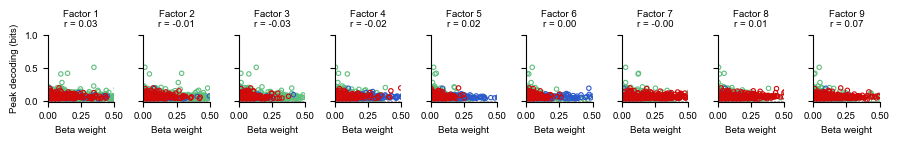

In [151]:
import pandas as pd
def extract_coupling_betas_and_decode(
    results_pre_enc,
    avg_results_datasets,
    peak_info_struc,
    decoded_feature='sound_category',
    coupling_n_predictors=9,
    to_extract = 'peak_values'
):
    """
    Extract 9 coupling beta weights for each neuron and match to decoding peak info.
    
    Returns:
        df: pd.DataFrame with columns:
            ['dataset', 'cell_type', 'cell_idx', 'match_idx', 'beta_pyr1' ... 'beta_pv3', 'peak_info']
    """

    all_rows = []

    for dataset in results_pre_enc:
        print(f'Processing {dataset}')

        model_output_all = results_pre_enc[dataset]['model_output_all']
        match_indices = avg_results_datasets[dataset]['match_indices']
        
        # Average B_weights across folds
        B = np.stack([model_output_all[f]['B_weights'] for f in model_output_all])
        B_mean = np.mean(B, axis=0)  # shape: (predictors, neurons)
        
        n_predictors_total, n_neurons = B_mean.shape
        coupling_start = n_predictors_total - coupling_n_predictors  # last 9
        coupling_betas = B_mean[coupling_start:, :]  # shape (9, n_neurons)

        # Go through cell types that have decoding data
        if dataset not in peak_info_struc:
            continue

        for cell_type in peak_info_struc[dataset]:
            info = peak_info_struc[dataset][cell_type].get(decoded_feature, None)
            if info is None:
                continue

            peak_vals = info[to_extract]
            if to_extract == 'peak_frames':
                peak_vals = peak_vals/169 #normalize by number of frames?
            neuron_indices = info['neuron_indices'].flatten()

            for idx_in_list, neuron_idx in enumerate(neuron_indices):
                if neuron_idx >= n_neurons:
                    continue  # skip out-of-bounds neurons

                beta_vec = coupling_betas[:, neuron_idx]  # shape (9,)
                peak_val = peak_vals[idx_in_list]

                row = {
                    'dataset': dataset,
                    'cell_type': cell_type,
                    'cell_idx': neuron_idx,
                    'match_idx': match_indices[neuron_idx] if neuron_idx < len(match_indices) else None,
                    'peak_info': peak_val,
                }

                # Add individual coupling betas
                for j in range(9):
                    row[f'beta_{j+1}'] = beta_vec[j]

                all_rows.append(row)

    return pd.DataFrame(all_rows)



import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib as mpl
def compare_coupling_betas_and_decoding(df,coupling_index_by_celltype=None,coupling_context='Active',coupling_threshold=0.06, save_path=None, figsize=(9, 3), marker_size=10):
    """
    Generate scatter plots comparing coupling beta weights (matched factors) to decoding peak info.

    Args:
        df (pd.DataFrame): Output of extract_coupling_betas_and_decode.
        save_path (str): Optional path to save the figure.
        figsize (tuple): Size of the whole figure.
        marker_size (int): Size of each scatter point.
    """
    mpl.rcParams['pdf.fonttype'] = 42
    plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})

    # Optional filtering based on coupling strength
    if coupling_index_by_celltype is not None:
        print(f"Filtering neurons with coupling index > {coupling_threshold} in {coupling_context} context...")

        keep_mask = np.zeros(len(df), dtype=bool)

        for cell_type in df['cell_type'].unique():
            if cell_type.lower() not in coupling_index_by_celltype[('No Coupling', 'All')]:
                continue

            ci_values = coupling_index_by_celltype[('No Coupling', 'All')][cell_type.lower()][coupling_context]
            valid_indices = np.where(np.array(ci_values) > coupling_threshold)[0]

            # Match against df rows
            is_cell_type = df['cell_type'] == cell_type
            is_coupled = df['cell_idx'].isin(valid_indices)
            keep_mask |= (is_cell_type & is_coupled)

        df = df[keep_mask]
        # print(f"{len(df)} neurons retained after filtering.")

    fig, axes = plt.subplots(1, 9, figsize=figsize, sharey=True)

    for i in range(9):
        ax = axes[i]
        beta_col = f'beta_{i+1}'
        for cell_type, color in plotter.celltypecolors.items():
            subset = df[df['cell_type'] == cell_type.upper()]
            if cell_type == 'pyr':
                subset = df[df['cell_type'] == 'Pyr']
            ax.scatter(
                abs(subset[beta_col]),
                subset['peak_info'],
                edgecolors=color,
                facecolors='none',
                label=cell_type,
                s=marker_size,
                linewidth=0.8
            )
        r = np.corrcoef(df[beta_col], df['peak_info'])[0, 1]
        ax.set_title(f'Factor {i+1}\nr = {r:.2f}', fontsize = 7)
        ax.axhline(0, color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(0, color='gray', linestyle='--', linewidth=0.5)
        ax.set_xlabel('Beta weight')
        ax.set_xlim(0, .5)
        ax.set_ylim(-.01, 1)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_box_aspect(1)
        if i == 0:
            ax.set_ylabel('Peak decoding (bits)')
        else:
            ax.set_ylabel('')

        plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300)
    
    return fig

df = extract_coupling_betas_and_decode(
    results_pre_enc,
    avg_results_datasets,
    peak_info_struc,
    decoded_feature= 'outcome')

fig = compare_coupling_betas_and_decoding(df,coupling_index_by_celltype=coupling_index_by_celltype,coupling_context='Active', save_path=None, figsize=(9, 3), marker_size=10)
#coupling_index_by_celltype[('No Coupling','All')][ct]['Active ITI']) > threshold

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib as mpl


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import numpy as np
from scipy.stats import ks_2samp
from utils.general_stats import GeneralStats
stats = GeneralStats()  # instantiate it

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.colors import to_hex
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker

def plot_coupling_index_vs_decoding_info(
    coupling_index_by_celltype,
    peak_info_struc,
    decoded_feature='sound_category',
    state='Active',
    threshold=None,
    celltype_colors={'pyr': (0.37, 0.75, 0.49), 'som': (0.17, 0.35, 0.8), 'pv': (0.82, 0.04, 0.04)},
    figsize=(3, 3),
    marker_size=20,
    peak_to_get = 'peak_values',
    alpha = 1,
    save_path = None
):
    """
    Plots coupling index vs peak decoding info for each neuron (all datasets pooled).
    Optionally threshold coupling index.
    """
    mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)
    all_rows = []

    for dataset in peak_info_struc:
        for cell_type in peak_info_struc[dataset]:

            # Get decoding info
            info = peak_info_struc[dataset][cell_type].get(decoded_feature, None)
            if info is None:
                continue

            peak_vals = info[peak_to_get]
            if peak_to_get == 'peak_frames':
                peak_vals = peak_vals/169 #normalize by number of frames
            neuron_indices = info['neuron_indices'].flatten()

            # Get coupling index
            try:
                coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type.lower()][state]
            except KeyError:
                print(f"Missing coupling index for {dataset}, {cell_type}, {state}")
                continue

            for i, neuron_idx in enumerate(neuron_indices):
                if neuron_idx >= len(coupling_vals):
                    continue
                if coupling_vals[neuron_idx] < 0 or np.isnan(coupling_vals[neuron_idx]):
                    continue

                row = {
                    'dataset': dataset,
                    'cell_type': cell_type.lower(),
                    'neuron_idx': neuron_idx,
                    'coupling_index': coupling_vals[neuron_idx],
                    'peak_info': peak_vals[i],
                }

                if threshold is not None or row['coupling_index'] > threshold:
                    print(dataset)
                    all_rows.append(row)

    df = pd.DataFrame(all_rows)

    # Plot
    plt.figure(figsize=figsize)
    for cell_type, color in celltype_colors.items():
        sub = df[df['cell_type'] == cell_type]
        plt.scatter(
            sub['coupling_index'],
            sub['peak_info'],
            label=cell_type.upper(),
            facecolors='none',
            edgecolors=color,
            s=marker_size,
            linewidth=.5,
            alpha=alpha
        )

    # Correlation
    r, p = pearsonr(df['coupling_index'], df['peak_info'])
    plt.title(f'{decoded_feature.capitalize()}', fontsize=7) 
    if decoded_feature == 'sound_category':
        plt.title('Sound category', fontsize=7)
    # plt.title(f'{decoded_feature}\nr = {r:.2f}, p = {p:.3f}', fontsize=8)

    plt.xlabel('Coupling Index', fontsize=7)
    plt.ylabel('Peak Info (bits)', fontsize=7)
    ax = plt.gca()
    ax.set_ylim(-.01, .5)
    ax.set_yticklabels(ax.get_yticks(), fontsize=7)
    ax.set_xticklabels(ax.get_xticks(), fontsize=7)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
    plt.legend(frameon=False, fontsize=6)
    sns.despine(right=True, top=True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

    return df

from scipy.stats import sem
import matplotlib.ticker as mticker

def plot_decoding_by_coupling_bin(
    coupling_index_by_celltype,
    peak_info_struc,
    decoded_feature='sound_category',
    state='Active',
    celltype_colors={'pyr': (0.37, 0.75, 0.49), 'som': (0.17, 0.35, 0.8), 'pv': (0.82, 0.04, 0.04)},
    figsize=(3, 3),
    marker_size=20,
    peak_to_get='peak_values',
    alpha=1,
    bins=[0, 0.25, 0.5, 0.75, 1.01],  # right-inclusive last bin
    threshold=None,
    top_neurons=False,
    save_path = None
):
    """
    Bins coupling index and plots mean ± SEM of peak decoding info per bin, per cell type.
    """
    all_rows = []
    mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)

    top_pyr_color = (0.10, 0.36, 0.16) 

    if top_neurons is True:
        celltype_colors = {
            'pyr': (0.37, 0.75, 0.49),
            'som': (0.17, 0.35, 0.8),
            'pv': (0.82, 0.04, 0.04),
            'top_pyr': top_pyr_color
        }

    for dataset in peak_info_struc:
        for cell_type in peak_info_struc[dataset]:

            info = peak_info_struc[dataset][cell_type].get(decoded_feature, None)
            if info is None:
                continue

            peak_vals = info[peak_to_get]
            if peak_to_get == 'peak_frames':
                peak_vals = peak_vals / 169  # normalize by frames
            neuron_indices = info['neuron_indices'].flatten()

            # First, filter to top 10 PYR neurons if requested
            if top_neurons is True and cell_type.lower() == 'pyr':
                # Sort indices of top neurons by decoding strength
                sorted_indices = np.argsort(peak_vals)[::-1]
                top_indices = sorted_indices[:10]  # Top 10 neurons

            try:
                coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type.lower()][state]
            except KeyError:
                print(f"Missing coupling index for {dataset}, {cell_type}, {state}")
                continue

            for i, neuron_idx in enumerate(neuron_indices):
                if neuron_idx >= len(coupling_vals):
                    continue
                if coupling_vals[neuron_idx] < 0 or  np.isnan(coupling_vals[neuron_idx]):
                    continue
                row = {
                    'dataset': dataset,
                    'cell_type': cell_type.lower(),
                    'neuron_idx': neuron_idx,
                    'coupling_index': coupling_vals[neuron_idx],
                    'peak_info': peak_vals[i],
                }
                if threshold is not None:
                    # Use threshold filtering
                    if row['coupling_index'] > threshold:
                        all_rows.append(row)
                elif top_neurons is True and cell_type.lower() == 'pyr':
                    # print(f"Top 10 PYR neurons for {dataset}: {neuron_indices[top_indices]}")
                    if i in top_indices:
                        row = {
                            'dataset': dataset,
                            'cell_type': 'top_pyr',
                            'neuron_idx': neuron_idx,
                            'coupling_index': coupling_vals[neuron_idx],
                            'peak_info': peak_vals[i],
                        }
                    all_rows.append(row)
                else:
                    all_rows.append(row)

    df = pd.DataFrame(all_rows)
    df['coupling_bin'] = pd.cut(df['coupling_index'], bins=bins, include_lowest=True, right = False)

    plt.figure(figsize=figsize)

    bin_centers = [(bins[i] + bins[i+1]) / 2 for i in range(len(bins) - 1)]
    
    for cell_type, color in celltype_colors.items():
        sub = df[df['cell_type'] == cell_type]
        means = []
        errors = []
        bin_data_all = {}

        for b in df['coupling_bin'].cat.categories:
            bin_data = sub[sub['coupling_bin'] == b]['peak_info']
            means.append(bin_data.mean())
            errors.append(sem(bin_data) if len(bin_data) > 1 else 0)
            # if len(bin_data.dropna()) > 0:
            #     clean = bin_data.dropna()
            #     means.append(clean.mean())

            #     if len(clean) > 1:
            #         errors.append(sem(clean))
            #     else:
            #         errors.append(np.nan)   # cannot compute SEM with one value
            # else:
            #     means.append(np.nan)
            #     errors.append(np.nan)

            bin_data_all[b] = bin_data

        #perform stat test
        # ---- Permutation test ----
        bins = list(bin_data_all.keys())

        if len(bins) == 2:
            data1 = bin_data_all[bins[0]]
            data2 = bin_data_all[bins[1]]

            # only run if both bins have data
            if len(data1) > 0 and len(data2) > 0:
                pval, stat = stats.perform_permutation_test(
                    data1, data2,
                    paired=False,
                    n_permutations=10000
                )
                print(f'permutation test|| pval: {pval}, celltype {cell_type}')
            else:
                pval, stat = np.nan, np.nan
        else:
            pval, stat = np.nan, np.nan

        plt.errorbar(
            bin_centers, means, yerr=errors,
            label=cell_type.upper(),
            color=color,
            marker='o',
            markersize=marker_size / 5,
            capsize=2,
            lw=1
        )
        
        # select the two columns for the cell type
        x = df[df['cell_type'] == cell_type]['coupling_index']
        y = df[df['cell_type'] == cell_type]['peak_info']

        # remove NaNs
        mask = ~np.isnan(x) & ~np.isnan(y)
        r, p = pearsonr(x[mask], y[mask])
        print(f'{cell_type.upper()}: r = {r:.2f}, p = {p:.3f}')

    plt.xlabel('Coupling Bin', fontsize=7)
    plt.ylabel('Peak Info (bits)', fontsize=7)
    plt.title(decoded_feature.capitalize(), fontsize=7)
    if decoded_feature == 'sound_category':
        plt.title('Sound Category', fontsize=7)
    ax = plt.gca()
    ax.set_xticks(bin_centers)
    ax.set_xticklabels([f'{b.left:.2f}-{b.right:.2f}' for b in df['coupling_bin'].cat.categories], fontsize=7, rotation=45)
    ax.set_yticklabels(ax.get_yticks(), fontsize=7)
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.3f'))
    if len(bins) != 3:
        ax.set_box_aspect(1)
    else:
        ax.set_xlim(-.1,1.1)

    plt.legend(
        loc='center left',           # Anchor point of legend
        bbox_to_anchor=(1.05, 0.5),  # Position relative to axes
        borderaxespad=0.0,           # Padding between axes and legend
        frameon=False,                 # Draw a frame around legend
        fontsize=6
    )
    sns.despine()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

    return df


def plot_cumulative_fraction_top_decoders_vs_coupling(
    df,
    decoded_feature='sound_category',
    celltype_colors={'pyr': (0.37, 0.75, 0.49), 'som': (0.17, 0.35, 0.8), 'pv': (0.82, 0.04, 0.04)},
    bin_edges=[0, 0.25, 0.5, 0.75, 1.01],
    top_percentile=10,
    figsize=(3, 3),
):
    """
    Plot cumulative fraction of top decoders that fall into each coupling bin.
    """
    df = df.copy()

    # Define bins
    bin_labels = [f'{bin_edges[i]:.2f}-{bin_edges[i+1]:.2f}' for i in range(len(bin_edges)-1)]
    df['coupling_bin'] = pd.cut(df['coupling_index'], bins=bin_edges, labels=bin_labels, include_lowest=True)

    plt.figure(figsize=figsize)

    for cell_type, color in celltype_colors.items():
        sub = df[df['cell_type'] == cell_type]
        if sub.empty:
            continue

        # Get top decoders
        n_top = max(1, int(len(sub) * top_percentile / 100))
        top_sub = sub.sort_values('peak_info', ascending=False).head(n_top)

        # Count how many of top decoders fall into each bin
        bin_counts = top_sub['coupling_bin'].value_counts().reindex(bin_labels, fill_value=0)

        # Cumulative fraction
        cum_frac = np.cumsum(bin_counts.values) / n_top
        plt.plot(bin_labels, cum_frac, label=cell_type.upper(), color=color, marker='o')

    plt.ylabel('CDF of Top Decoders', fontsize=7)
    plt.xlabel('Coupling Bin', fontsize=7)
    plt.xticks(rotation=45, fontsize=7)
    plt.yticks(fontsize=7)
    plt.ylim(0, 1.05)
    plt.title(f'{decoded_feature.replace("_", " ").capitalize()}', fontsize=7)
    plt.legend(frameon=False, fontsize=6)
    sns.despine()
    plt.tight_layout()
    plt.show()


# feature = 'sound_category'
# top_pyr = True
# state = 'Passive'
# df_ci = plot_coupling_index_vs_decoding_info(
#     coupling_index_by_celltype,
#     peak_struc[state],
#     decoded_feature=feature,
#     state=state,
#     threshold= 0,
#     figsize=(2, 2),
#     marker_size=5,
#     alpha = .5,
#     save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{state}.pdf'
# )

# df_test = plot_decoding_by_coupling_bin(
#     coupling_index_by_celltype,
#     peak_struc[state],
#     decoded_feature=feature,
#     state=state,
#     celltype_colors=plotter.celltypecolors,
#     figsize=(2.8,2.8),#(2.8, 2.8),
#     marker_size=10,
#     peak_to_get='peak_values',
#     alpha=1,
#     bins= [0, 0.25, 0.5, 0.75, 1], #[0,.5,1],#[0, 0.25, 0.5, 0.75, 1],  # right-inclusive last bin
#     threshold = None,
#     top_neurons = top_pyr ,
#     save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{top_pyr}_4bins_{state}.pdf'
# )
# top_pyr = False
# df_test = plot_decoding_by_coupling_bin(
#     coupling_index_by_celltype,
#     peak_struc[state],
#     decoded_feature=feature,
#     state=state,
#     celltype_colors=plotter.celltypecolors,
#     figsize=(2.5,2.5),#(2.5, 2.5),
#     marker_size=10,
#     peak_to_get='peak_values',
#     alpha=1,
#     bins= [0, 0.25, 0.5, 0.75, 1], #[0,.5,1],#[0, 0.25, 0.5, 0.75, 1],  # right-inclusive last bin
#     threshold = None,
#     top_neurons = top_pyr ,
#     save_path = f'W:\Connie/results\Bassi2025\glm_coupling\supplement/scatter_binned_decoding_coupling_{feature}_top_{top_pyr}_4bins_{state}.pdf'
# )

# plot_cumulative_fraction_top_decoders_vs_coupling(
#     df_test,
#     decoded_feature='choice',
#     celltype_colors=plotter.celltypecolors, 
#     bin_edges=[0, 0.25, 0.5, 0.75, 1.01],
#     top_percentile=10,
#     figsize=(2, 2)
# )

C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\3523978630.py:88: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=7)
C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\3523978630.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticks(), fontsize=7)


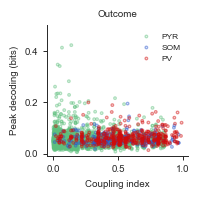

C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\2691503993.py:178: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=7)


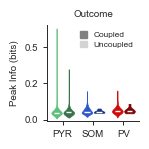

PV: Coupled mean = 0.065  size = 442, Uncoupled mean = 0.063 size = 8, p = 0.8611
PYR: Coupled mean = 0.054  size = 1847, Uncoupled mean = 0.056 size = 629, p = 0.3844
SOM: Coupled mean = 0.060  size = 218, Uncoupled mean = 0.056 size = 5, p = 0.7597


C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\2691503993.py:637: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = plot_df.groupby(['dataset', 'cell_type'])
C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\2691503993.py:680: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\2691503993.py:680: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': 'black'}` instead.

  ax = sns.barplot(
C:\Users\runyan1\AppData\Local\Temp\ipykernel_26440\2691503993.py:680: FutureWarning: 

The `errwidth` parameter is deprecated. And will be r

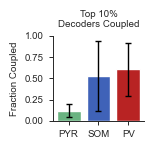

,Cell_Type,Fraction_Coupled,SEM,N Datasets
0,PYR,0.122038,0.072626,19
1,SOM,0.526316,0.412747,19
2,PV,0.605263,0.310445,19


In [ ]:
from utils.general_stats import GeneralStats
stats = GeneralStats()  # instantiate it


def plot_decoding_by_coupling_status_tight(
    df,
    coupling_index_by_celltype,
    condition='Active',
    coupling_threshold=0.06,
    show_points=True,
    figsize=(6, 4),
    width = 1,
    decoded_feature = 'outcome',
    save_path = None
):
    # plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})
    mpl.rcParams.update({
        'font.family': 'Arial',
        'font.size': 7,
        'axes.linewidth': 0.7,
        'xtick.major.width': 0.7,
        'ytick.major.width': 0.7,
        'xtick.major.size': 3,
        'ytick.major.size': 3,
        })
    mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)
    # sns.set(style='white')
    sns.set_style('ticks')

    # Helper to darken colors
    def darken(color, factor=0.6):
        return tuple([c * factor for c in color])

    base_colors = plotter.celltypecolors

    # Build plotting dataframe (same as before)
    plot_data = []

    for cell_type in df['cell_type'].unique():
        df_ct = df[df['cell_type'] == cell_type]

        try:
            coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type][condition]
        except Exception:
            print(f"Skipping {cell_type}: missing coupling values.")
            continue

        for _, row in df_ct.iterrows():
            cell_idx = row['neuron_idx']

            try:
                coupling_index = coupling_vals[cell_idx]
            except Exception:
                continue

            if coupling_index < 0 or np.isnan(coupling_index):
                continue

            decoding_value = row['peak_info']
            if np.isnan(decoding_value):
                continue

            coupling_status = 'Coupled' if coupling_index > coupling_threshold else 'Uncoupled'

            plot_data.append({
                'cell_type': cell_type.lower(),
                'coupling_status': coupling_status,
                'coupling_index': coupling_index,
                'decoding_value': decoding_value,
                'dataset': row['dataset'],
                'neuron_idx': cell_idx
            })

    plot_df = pd.DataFrame(plot_data)
    # ---- Force explicit ordering ----
    cell_order = ['pyr', 'som', 'pv']
    status_order = ['Coupled', 'Uncoupled']

    plot_df['cell_type'] = pd.Categorical(
        plot_df['cell_type'],
        categories=cell_order,
        ordered=True
    )

    plot_df['coupling_status'] = pd.Categorical(
        plot_df['coupling_status'],
        categories=status_order,
        ordered=True
    )

    # ---- Deterministic orders ----
    cell_order = ['pyr', 'som', 'pv']
    status_order = ['Coupled', 'Uncoupled']

    fig, ax = plt.subplots(figsize=figsize)

    def darken(color, factor=0.6):
        return tuple([c * factor for c in color])

    base_x = np.arange(len(cell_order))

    # Offsets so Coupled is left, Uncoupled is right
    offsets = {
        'Coupled': -0.20,
        'Uncoupled': 0.20
    }

    legend_handles = []

    for i, ct in enumerate(cell_order):
        for status in status_order:

            subset = plot_df[
                (plot_df['cell_type'] == ct) &
                (plot_df['coupling_status'] == status)
            ]

            if subset.empty:
                continue

            x = base_x[i] + offsets[status]

            color = base_colors[ct] if status == 'Coupled' else darken(base_colors[ct], 0.6)

            parts = ax.violinplot(
                subset['decoding_value'],
                positions=[x],
                widths=width,
                showmeans=False,
                showmedians=True,
                showextrema=False
            )

            for pc in parts['bodies']:
                pc.set_facecolor(color)
                pc.set_edgecolor(color)
                pc.set_linewidth(0.5)
                pc.set_alpha(1)

            # Make medians white (robust to matplotlib versions)
            med = parts['cmedians']

            if hasattr(med, 'set_color'):      # single LineCollection
                med.set_color('white')
                med.set_linewidth(1.0)
            else:                              # iterable case
                for line in med:
                    line.set_color('white')
                    line.set_linewidth(1.0)

            if show_points:
                ax.scatter(
                    np.repeat(x, len(subset)),
                    subset['decoding_value'],
                    color='black',
                    s=4,
                    alpha=0.4
                )

            legend_handles.append(
                mpatches.Patch(color=color, label=f"{ct.upper()} {status}")
            )

    ax.set_xticks(base_x)
    ax.set_xticklabels([ct.upper() for ct in cell_order], fontsize=7)
    ax.set_yticklabels(ax.get_yticks(), fontsize=7)

    # Round y-axis ticks nicely, e.g., 2 decimals
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))
    ax.set_ylabel('Peak Info (bits)', fontsize=7)
    ax.set_xlabel('', fontsize=7)
    ax.set_title(f'{decoded_feature.capitalize()}', fontsize=7) 
    if decoded_feature == 'sound_category':
        ax.set_title('Sound category', fontsize=7)

    ax.set_ylim(-0.01, 0.65)

    # Build simple clean legend
    simple_legend = [
        mpatches.Patch(color='gray', label='Coupled'),
        mpatches.Patch(color='lightgray', label='Uncoupled')
    ]

    ax.legend(handles=simple_legend, frameon=False, fontsize=6,handlelength=0.8,handleheight=0.8,borderpad=0.2,labelspacing=0.3)

    # Turn off top/right spines
    sns.despine(top=True, right=True)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

    # Optional t-tests
    for ct in plot_df['cell_type'].unique():
        dct = plot_df[plot_df['cell_type'] == ct]
        dec_coupled = dct[dct['coupling_status'] == 'Coupled']['decoding_value'].dropna()
        dec_uncoupled = dct[dct['coupling_status'] == 'Uncoupled']['decoding_value'].dropna()

        if len(dec_coupled) > 1 and len(dec_uncoupled) > 1:
            # tstat, pval = ttest_ind(dec_coupled, dec_uncoupled, equal_var=False)
            pval, stat = stats.perform_permutation_test(dec_coupled, dec_uncoupled, paired=False, n_permutations=10000)
            print(f"{ct.upper()}: Coupled mean = {dec_coupled.mean():.3f}  size = {len(dec_coupled)}, Uncoupled mean = {dec_uncoupled.mean():.3f} size = {len(dec_uncoupled)}, p = {pval:.4f}")
            # ks_stat, ks_p = ks_2samp(dec_coupled, dec_uncoupled)
            # print(f"{ct.upper()}: KS stat = {ks_stat:.3f}, p = {ks_p:.4f}")       
        else:
            print(f"{ct.upper()}: Not enough valid data for t-test.")

    return plot_df



def plot_decoding_by_coupling_status_tight_og(
    df,
    coupling_index_by_celltype,
    condition='Active',
    coupling_threshold=0.06,
    show_points=True,
    figsize=(8, 5),
    width=0.25,
):
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_hex

    plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})
    sns.set(style='white')
    fig, ax = plt.subplots(figsize=figsize)

    # Define base and dark colors
    base_colors = plotter.celltypecolors
    def darken(color, factor=0.6):
        return tuple([c * factor for c in color])

    # Prepare data
    plot_data = []
    for cell_type in df['cell_type'].unique():
        df_ct = df[df['cell_type'] == cell_type]
        try:
            coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type][condition]
        except Exception as e:
            print(f"Skipping {cell_type}: missing coupling values.")
            continue

        for _, row in df_ct.iterrows():
            cell_idx = row['neuron_idx']
            try:
                coupling_index = coupling_vals[cell_idx]
            except Exception:
                continue
            if coupling_index < 0 or np.isnan(coupling_index):
                continue

            decoding_value = row['peak_info']
            if np.isnan(decoding_value):
                continue

            coupling_status = 'Coupled' if coupling_index > coupling_threshold else 'Uncoupled'

            plot_data.append({
                'cell_type': cell_type.lower(),
                'status': coupling_status,
                'decoding_value': decoding_value
            })

    plot_df = pd.DataFrame(plot_data)
    if plot_df.empty:
        raise ValueError("No valid data to plot.")

    # Define custom x-positions
    cell_types = ['pyr', 'som', 'pv']
    base_x = [0, 1.5, 3.0]
    spacing = 0.15  # small offset between coupled/uncoupled
    x_positions = {}
    for i, ct in enumerate(cell_types):
        x_positions[f'{ct}-Coupled'] = base_x[i] - spacing
        x_positions[f'{ct}-Uncoupled'] = base_x[i] + spacing

    # Plot violins manually
    legend_handles = []

    for ct in cell_types:
        for status in ['Coupled', 'Uncoupled']:
            key = f'{ct}-{status}'
            subset = plot_df[(plot_df['cell_type'] == ct) & (plot_df['status'] == status)]
            x = x_positions[key]

            if len(subset) == 0:
                continue

            face_color = base_colors[ct] if status == 'Coupled' else darken(base_colors[ct], 0.6)
            label = f"{ct.upper()} {status}"

            vp = ax.violinplot(
                subset['decoding_value'],
                positions=[x],
                widths=width,
                showmeans=False,
                showmedians=True,
                showextrema=False
            )

            # Set face and edge colors
            for pc in vp['bodies']:
                pc.set_facecolor(to_hex(face_color))
                pc.set_edgecolor(to_hex(face_color))
                pc.set_alpha(1)
                pc.set_linewidth(1)

            # Set median manually
            parts = ax.violinplot(
                subset['decoding_value'],
                positions=[x],
                widths=width,
                showmeans=False,
                showmedians=True,
                showextrema=False
            )
            for line in parts['cmedians']:
                line.set_color('white')
                line.set_linewidth(1.0)

            # Scatter points
            if show_points:
                ax.scatter(
                    [x] * len(subset),
                    subset['decoding_value'],
                    color='k',
                    alpha=0.4,
                    s=6,
                    edgecolor='none'
                )

            # Add to legend only once
            legend_handles.append(
                mpatches.Patch(facecolor=to_hex(face_color), edgecolor=to_hex(face_color), label=label)
            )

    # Format axes
    ax.set_xticks(base_x)
    ax.set_xticklabels([ct.upper() for ct in cell_types])
    ax.set_ylabel('Peak Info (bits)')
    ax.set_xlabel('Cell Type')
    ax.set_ylim(-0.01, 0.6)

    # Custom legend
    ax.legend(
        handles=legend_handles,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        borderaxespad=0.0,
        frameon=False,
        fontsize=6
    )

    sns.despine()
    plt.tight_layout()
    plt.show()

    return plot_df

def plot_decoding_by_coupling_status(
    df,
    coupling_index_by_celltype,
    condition='Active',
    decoding_target='sound_category',
    coupling_threshold=0.06,
    plot_type='violin',  # or 'box'
    show_points=True,
    figsize=(10, 5),
    width=0.5
):
    """
    Plots decoding info split by coupling status per cell type, side-by-side.
    """

    plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})
    mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)

    base_colors = plotter.celltypecolors
    celltype_upper = {'pyr': 'PYR', 'som': 'SOM', 'pv': 'PV'}

    # Convert RGB tuples to hex and define darker versions for uncoupled
    from matplotlib.colors import to_hex
    def darken(color, factor=0.6):
        return tuple([c * factor for c in color])

    palette = {}
    for ct, base_color in base_colors.items():
        ct_upper = ct.upper()
        palette[f'{ct_upper}-Coupled'] = to_hex(base_color)
        palette[f'{ct_upper}-Uncoupled'] = to_hex(darken(base_color, 0.6))  # Darker uncoupled

    # Manual x-positions
    cell_types = ['pyr', 'som', 'pv']
    x_positions = {f'{ct}-Coupled': i - 0.15 for i, ct in enumerate(cell_types)}
    x_positions.update({f'{ct}-Uncoupled': i + 0.15 for i, ct in enumerate(cell_types)})

    plot_data = []

    for cell_type in df['cell_type'].unique():
        df_ct = df[df['cell_type'] == cell_type]
        try:
            coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type][condition]
        except Exception as e:
            print(f"Skipping {cell_type}: missing coupling values.")
            continue

        for _, row in df_ct.iterrows():
            cell_idx = row['neuron_idx']
            try:
                coupling_index = coupling_vals[cell_idx]
            except (IndexError, KeyError, TypeError):
                continue

            if coupling_index < 0 or np.isnan(coupling_index):
                continue

            decoding_value = row['peak_info']
            if np.isnan(decoding_value):
                continue  # skip if no decoding

            coupling_status = 'Coupled' if coupling_index > coupling_threshold else 'Uncoupled'

            plot_data.append({
                'cell_type': cell_type.upper(),
                'coupling_status': coupling_status,
                'decoding_value': decoding_value,
                'dataset': row['dataset'],
                'neuron_idx': cell_idx
            })

    plot_df = pd.DataFrame(plot_data)
    # 1. Add new column to DataFrame
    plot_df['hue_group'] = plot_df['cell_type'].str.upper() + '-' + plot_df['coupling_status']

    if plot_df.empty:
        raise ValueError("No valid data for plotting.")

    sns.set(style='white')
    plt.figure(figsize=figsize)

    if plot_type == 'violin':
        ax = sns.violinplot(
            data=plot_df,
            x='cell_type',
            y='decoding_value',
            hue='hue_group',#'coupling_status',
            palette=palette,
            split=False,
            inner='box',
            cut=0,
            linewidth=1,
            width=width
        )

        # Overlay individual data points
        if show_points:
            sns.stripplot(
                data=plot_df,
                x='cell_type',
                y='decoding_value',
                hue='hue_group',
                dodge=True,
                marker='o',
                alpha=0.5,
                palette=palette,
                linewidth=0.3,
                edgecolor='gray'
            )
    # After plotting the violinplot:
        violin_parts = [c for c in ax.collections if isinstance(c, mpl.collections.PolyCollection)]
        for violin, hue_val in zip(violin_parts, plot_df['hue_group'].unique()):
            violin.set_edgecolor(palette[hue_val])

    else:
        ax = sns.boxplot(
            data=plot_df,
            x='cell_type',
            y='decoding_value',
            hue='hue_group',#'coupling_status',
            palette=palette,
            linewidth=1,
            width=width
        )

    # plt.title(f"Decoding ({decoding_target}) by Coupling Status ({condition})")
    plt.ylabel('Peak Info (bits)')
    plt.xlabel('Cell Type')
    # plt.legend( loc='outside', fontsize=6)
    # Place legend outside the plot (right side)
    plt.legend(
        loc='center left',           # Anchor point of legend
        bbox_to_anchor=(1.05, 0.5),  # Position relative to axes
        borderaxespad=0.0,           # Padding between axes and legend
        frameon=False,                 # Draw a frame around legend
        fontsize=6
    )

    plt.tight_layout()
    ax.set_ylim(-.01, .6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.show()

    # Optional t-tests
    for ct in plot_df['cell_type'].unique():
        dct = plot_df[plot_df['cell_type'] == ct]
        dec_coupled = dct[dct['coupling_status'] == 'Coupled']['decoding_value'].dropna()
        dec_uncoupled = dct[dct['coupling_status'] == 'Uncoupled']['decoding_value'].dropna()

        if len(dec_coupled) > 1 and len(dec_uncoupled) > 1:
            # tstat, pval = ttest_ind(dec_coupled, dec_uncoupled, equal_var=False)
            pval, stat = stats.perform_permutation_test(dec_coupled, dec_uncoupled, paired=False, n_permutations=10000)
            print(f"{ct.upper()}: Coupled mean = {dec_coupled.mean():.3f}  size = {len(dec_coupled)}, Uncoupled mean = {dec_uncoupled.mean():.3f} size = {len(dec_uncoupled)}, p = {pval:.4f}")
            # ks_stat, ks_p = ks_2samp(dec_coupled, dec_uncoupled)
            # print(f"{ct.upper()}: KS stat = {ks_stat:.3f}, p = {ks_p:.4f}")       
        else:
            print(f"{ct.upper()}: Not enough valid data for t-test.")

    return plot_df

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from scipy.stats import sem

def plot_fraction_above_threshold(df, decoding_target='sound_category', condition='Active',
                                  threshold=0.06, figsize=(10, 6),ylims=(0,1)):
    # Subset by decoding_target and condition if needed
    df_sub = df

    # Group by dataset
    grouped = df_sub.groupby(['dataset', 'cell_type', 'coupling_status'])

    # Container for per-dataset fractions
    fraction_dict = defaultdict(list)

    for (dataset, cell_type, coupling_status), group in grouped:
        if len(group) == 0:
            continue
        n_total = len(group)
        n_above = (group['decoding_value'] > threshold).sum()
        fraction = n_above / n_total

        fraction_dict[(cell_type, coupling_status)].append(fraction)

    # Build a summary DataFrame
    summary_data = []
    for (cell_type, coupling_status), values in fraction_dict.items():
        values = np.array(values)
        mean_val = values.mean()
        error = sem(values) if len(values) > 1 else 0  # SEM across datasets
        summary_data.append({
            'Cell Type': cell_type,
            'Coupling Status': coupling_status,
            'Fraction Above Threshold': mean_val,
            'SEM': error
        })

    summary_df = pd.DataFrame(summary_data)

    # Plot
    plt.figure(figsize=figsize)
    sns.set(style="whitegrid")

    ax = sns.barplot(
        data=summary_df,
        x="Cell Type",
        y="Fraction Above Threshold",
        hue="Coupling Status",
        palette='muted',
        capsize=0.1,
        errcolor='black',
        errwidth=1
    )

    # Add error bars manually (if needed)
    for i, row in summary_df.iterrows():
        ax.errorbar(
            x=i % len(summary_df['Cell Type'].unique()),
            y=row['Fraction Above Threshold'],
            yerr=row['SEM'],
            fmt='none',
            color='black',
            capsize=5
        )

    ax.set_title(f"Fraction of Neurons with Decoding > {threshold} ({decoding_target}, {condition})")
    ax.set_ylabel("Fraction Above Threshold")
    ax.set_xlabel("Cell Type")
    ax.set_ylim(ylims)
    plt.legend(title="Coupling Status")
    plt.tight_layout()
    plt.show()

def plot_fraction_coupled_among_top_decoders_from_df(
    plot_df,
    coupling_threshold=0.1,
    top_percentile=90,
    decoding_target='sound_category',
    condition='Active',
    ylims=(0, 1),
    figsize=(8, 5),
    show_points=True,
    celltypecolors=None,
    coupling_percentile = None
):
    """
    For each dataset × cell type, compute the top X% decoding neurons,
    and plot the fraction of those that are strongly coupled.
    """
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    import pandas as pd
    from scipy.stats import sem
    from matplotlib.colors import to_hex
    from collections import defaultdict

    plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})

    # Group by dataset and cell type
    grouped = plot_df.groupby(['dataset', 'cell_type'])

    # Container for per-dataset fractions
    fraction_dict = defaultdict(list)

    for (dataset, cell_type), group in grouped:
        if len(group) < 5:
            continue

        # Compute decoding cutoff
        cutoff = np.percentile(group['decoding_value'], top_percentile)
        top_decoders = group[group['decoding_value'] >= cutoff]

        if len(top_decoders) == 0:
            continue
        if coupling_percentile:
            coupling_cutoff = np.percentile(top_decoders['coupling_index'], coupling_percentile)
            # print(f"{dataset} {cell_type}: Coupling cutoff at {coupling_percentile} percentile is {coupling_cutoff:.3f}")
            n_coupled = ( top_decoders['coupling_index'] > coupling_cutoff).sum()
        else:
            n_coupled = (top_decoders['coupling_index'] > coupling_threshold).sum()
        fraction = n_coupled / len(top_decoders)

        fraction_dict[cell_type.upper()].append(fraction)

    # Build summary DataFrame
    summary_data = []
    for cell_type, values in fraction_dict.items():
        values = np.array(values)
        summary_data.append({
            'Cell_Type': cell_type,
            'Fraction_Coupled': values.mean(),
            'SEM': np.std(values) if len(values) > 1 else 0, #sem(values) if len(values) > 1 else 0,
            'N Datasets': len(values)
        })

    summary_df = pd.DataFrame(summary_data)


    # Plot
    plt.figure(figsize=figsize)
    bar_colors = [to_hex(celltypecolors[ct.lower()]) if celltypecolors else None for ct in summary_df['Cell_Type']]

    ax = sns.barplot(
        data=summary_df,
        x="Cell_Type",
        y="Fraction_Coupled",
        palette=bar_colors,
        capsize=0.1,
        errcolor='black',
        errwidth=1
    )

    if show_points:
        for i, ct in enumerate(summary_df['Cell_Type']):
            y_vals = fraction_dict[ct]
            plt.scatter(
                [i] * len(y_vals),
                y_vals,
                color='black',
                alpha=0.5,
                s=10,
                zorder=10
            )
    else:
        # Add error bars manually
        for i, row in summary_df.iterrows():
            ax.errorbar(
                x=i,
                y=row['Fraction_Coupled'],
                yerr=row['SEM'],
                fmt='none',
                ecolor='black',
                elinewidth=1,
                capsize=2,
                zorder=3
            )

    ax.set_title(f"Top {100 - top_percentile}%\nDecoders Coupled", fontsize=7)
    ax.set_ylabel("Fraction Coupled", fontsize=7)
    ax.set_xlabel("")
    ax.set_ylim(ylims)
    ax.tick_params(axis='both', labelsize=7)
    plt.tight_layout()
    # Turn off top/right spines
    sns.despine(top=True, right=True)
    plt.show()

    return summary_df



currently_plotting = 'outcome'
coupling_threshold = 0.05
df_ci = plot_coupling_index_vs_decoding_info(
    coupling_index_by_celltype,
    peak_info_struc,
    decoded_feature=currently_plotting,
    state='Active',
    threshold= 0,
    figsize=(2,2),
    marker_size=3,
    alpha = 0.5
)
# plot_df = plot_decoding_by_coupling_status(
#     df=df_ci,
#     coupling_index_by_celltype=coupling_index_by_celltype,
#     condition='Active',
#     decoding_target=currently_plotting,
#     coupling_threshold=0.05,
#     plot_type='violin',  # or 'box'
#     show_points=False,
#     figsize=(4,2),
#     width=1
# )

plot_df = plot_decoding_by_coupling_status_tight(
    df=df_ci,
    coupling_index_by_celltype=coupling_index_by_celltype,
    condition='Active',
    coupling_threshold=coupling_threshold,
    show_points=False,
    figsize=(1.5,1.5),
    width=0.35,
    decoded_feature=currently_plotting,
    save_path = None #f'W:\Connie/results\Bassi2025\glm_coupling\supplement\decoding_by_coupling_status_{currently_plotting}_active_thr{coupling_threshold}.pdf'
)


# plot_fraction_above_threshold(plot_df, decoding_target=currently_plotting, condition='Active',ylims = (0,.6))

plot_fraction_coupled_among_top_decoders_from_df(
    plot_df = plot_df,
    coupling_threshold=0.5, #coupling_threshold,
    top_percentile=90,
    decoding_target=currently_plotting,
    condition='Active',
    ylims=(0, 1),
    figsize=(1.5, 1.5),
    show_points=False,
    celltypecolors=plotter.celltypecolors,
    coupling_percentile = None #,75,
)




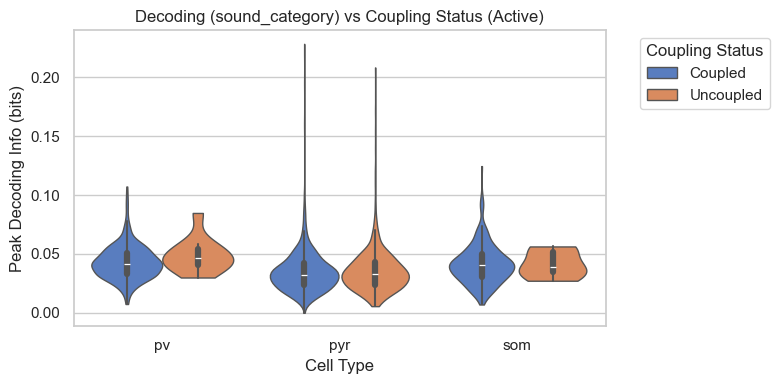

PV: Coupled mean = 0.043, Uncoupled mean = 0.049, p = 0.2031
PYR: Coupled mean = 0.035, Uncoupled mean = 0.036, p = 0.2269
SOM: Coupled mean = 0.041, Uncoupled mean = 0.042, p = 0.9441


,cell_type,decoding_value,coupling_status
0,pv,0.033517,Coupled
1,pv,0.043613,Coupled
2,pv,0.041187,Coupled
3,pv,0.014364,Coupled
4,pv,0.032892,Coupled
...,...,...,...
3144,som,0.038275,Coupled
3145,som,0.018660,Coupled
3146,som,0.033624,Coupled
3147,som,0.069917,Coupled


In [348]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import numpy as np

def plot_decoding_by_coupling_status(
    df,
    coupling_index_by_celltype,
    condition='Active',
    decoding_target='sound_category',
    coupling_threshold=0.06,
    plot_type='violin',  # or 'box'
    figsize=(8, 4),
):
    """
    Plot decoding peak value split by coupling status (> coupling_threshold)
    for each cell type.

    Parameters:
    - df: DataFrame with 'cell_type', 'cell_idx', 'dataset', and decoding values (e.g., 'peak_info')
    - coupling_index_by_celltype: nested dict containing coupling values per neuron
    - condition: 'Active' or 'Passive'
    - decoding_target: which decoded_feature to look at (for labeling)
    - coupling_threshold: threshold to define 'coupled'
    - plot_type: 'violin' or 'box'
    - figsize: size of the plot
    """
    
    plot_data = []

    for cell_type in df['cell_type'].unique():
        df_ct = df[df['cell_type'] == cell_type]
        coupling_vals = coupling_index_by_celltype[('No Coupling', 'All')][cell_type][condition]

        for _, row in df_ct.iterrows():
            cell_idx = row['neuron_idx']
            dataset = row['dataset']
            try:
                coupling_index = coupling_vals[cell_idx]
            except IndexError:
                continue  # skip if neuron index is invalid

            plot_data.append({
                'cell_type': cell_type,
                'decoding_value': row['peak_info'],
                'coupling_status': 'Coupled' if coupling_index > coupling_threshold else 'Uncoupled',
            })

    plot_df = pd.DataFrame(plot_data)

    if plot_df.empty:
        raise ValueError("No data available to plot. Check your filtering conditions or input structures.")

    sns.set(style='whitegrid')
    plt.figure(figsize=figsize)

    ax = sns.violinplot(
        data=plot_df,
        x='cell_type',
        y='decoding_value',
        hue='coupling_status',
        palette='muted',
        inner='box' if plot_type == 'violin' else 'point',
        cut=0,
        linewidth=1
    ) if plot_type == 'violin' else sns.boxplot(
        data=plot_df,
        x='cell_type',
        y='decoding_value',
        hue='coupling_status',
        palette='muted',
        linewidth=1
    )

    plt.title(f"Decoding ({decoding_target}) vs Coupling Status ({condition})")
    plt.ylabel('Peak Decoding Info (bits)')
    plt.xlabel('Cell Type')
    plt.legend(title='Coupling Status', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Optional: print stats
    for ct in plot_df['cell_type'].unique():
        dct = plot_df[plot_df['cell_type'] == ct]
        dec_coupled = dct[dct['coupling_status'] == 'Coupled']['decoding_value']
        dec_uncoupled = dct[dct['coupling_status'] == 'Uncoupled']['decoding_value']
        if len(dec_coupled) > 1 and len(dec_uncoupled) > 1:
            tstat, pval = ttest_ind(dec_coupled, dec_uncoupled, equal_var=False)
            print(f"{ct.upper()}: Coupled mean = {dec_coupled.mean():.3f}, Uncoupled mean = {dec_uncoupled.mean():.3f}, p = {pval:.4f}")
        else:
            print(f"{ct.upper()}: Not enough data for t-test.")

    return plot_df

plot_decoding_by_coupling_status(
    df = df_ci, coupling_index_by_celltype=coupling_index_by_celltype,
    condition='Active',
    decoding_target='sound_category',
    coupling_threshold=0.06,
    plot_type='violin',  # 'violin' or 'box'
    figsize=(8, 4))

HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30


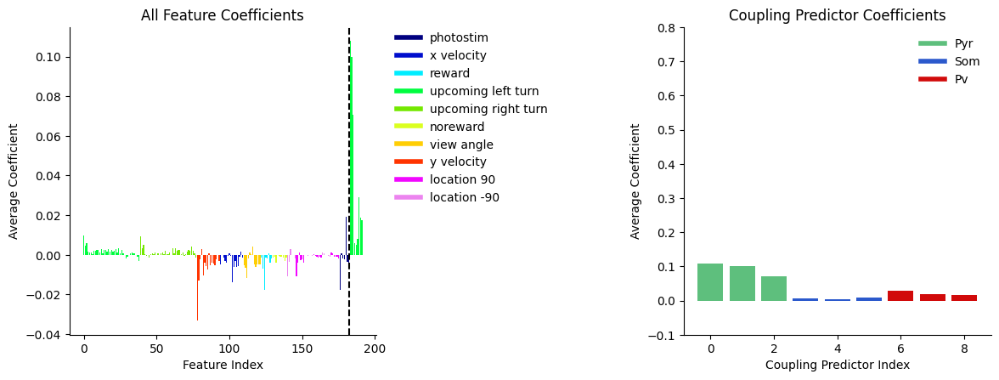

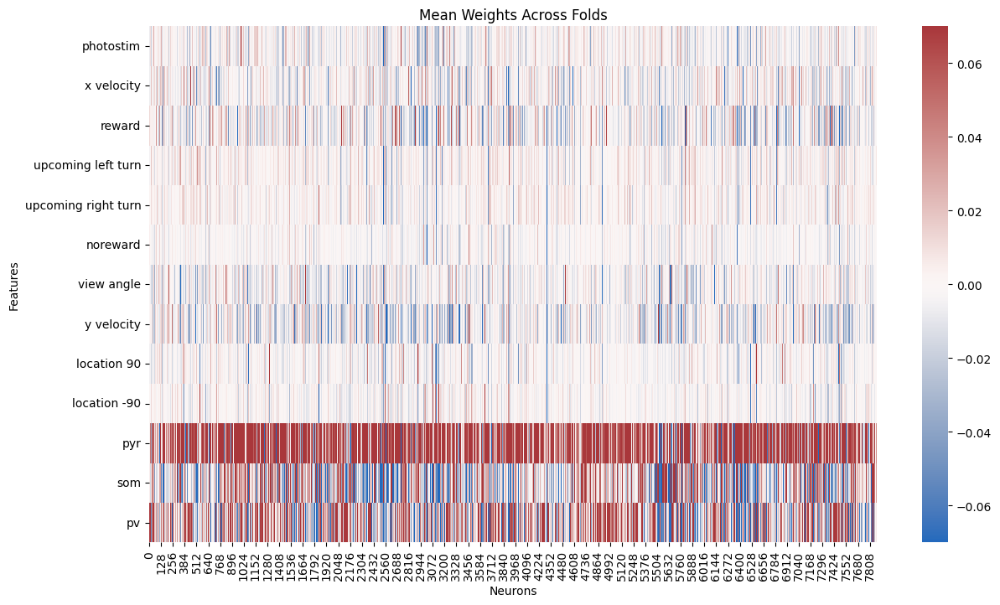

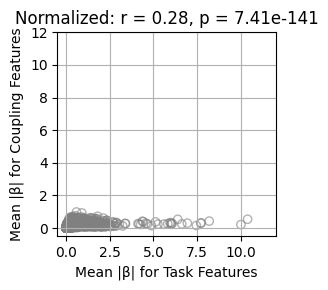

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

server = 'V:'
animalID = 'HA11-1R'
date = '2023-05-05'
results = results_pre_enc
# celltypecolors = results[f'{animalID}_{date}']['colors']
model_types = 'GLM_3nmf_pre'  # List your model types / COMBINED
no_abs = 1
minmaxlims= (-0.07,0.07)

#Aggregate chosen model
combined_output = data_handler.combine_model_output_all(results) #currently just doing model output all

# Aggregate model data
combined_B_weights, feature_names, other_weights, coupling_weights, coupling_indices,celltype_array, neuron_groups, start_indices = data_handler.aggregate_model_data_from_results(results, no_abs)

# Now use the aggregated data for plotting
plotter.plot_feature_weights(server=server, animalID=animalID, date=date, model_type=model_types, 
                     model_chosen=combined_output, no_abs=no_abs)

mean_neuron_feature_unique,unique_feature_names,mean_weights,feature_names,total_beta_feature_unique,max_beta_feature_unique = plotter.plot_weights_heatmap(server=server, animalID=animalID, date=date,
                     model_type=model_types, model_chosen=combined_output, 
                     coupling_indices=coupling_indices, cmap='coolwarm', no_abs=no_abs, minmax=minmaxlims)


desired_order = [
    'x velocity', 'y velocity', 'location -90', 'location 90', 'photostim', 'view angle',
    'upcoming left turn', 'upcoming right turn', 'reward', 'noreward', 
     'pyr', 'som', 'pv'
]

updated_feat_names = [
    'x velocity', 'y velocity', 'sound -90', 'sound 90', 'photostim', 'view angle',
    'left turn', 'right turn', 'reward', 'noreward', 
     'coupling Pyr', 'coupling SOM', 'coupling PV'
]
# Reorder the feature names to match the desired order
ordered_feature_names = [feature for feature in desired_order if feature in unique_feature_names]

# Create a mapping from the original indices to the new indices
reordered_indices = [unique_feature_names.index(feature) for feature in ordered_feature_names]

# Reorder the matrix based on the new order of feature indices
reordered_mean_neuron_feature_unique = mean_neuron_feature_unique[reordered_indices, :]
reordered_totalbeta_feature_unique = total_beta_feature_unique[reordered_indices, :]
reordered_maxbeta_feature_unique = max_beta_feature_unique[reordered_indices, :]

# Define rows
coupling_rows = [-3, -2, -1]
task_rows = list(range(0, len(updated_feat_names) - 3))  # assuming last 3 are coupling

# Sum of |β| per neuron
coupling_beta_per_neuron = np.sum(reordered_totalbeta_feature_unique[coupling_rows, :], axis=0)
task_beta_per_neuron = np.sum(reordered_totalbeta_feature_unique[task_rows, :], axis=0)

# Normalize by number of predictors
n_coupling_features = len(coupling_rows)
n_task_features = len(task_rows)

normalized_coupling = coupling_beta_per_neuron / n_coupling_features
normalized_task = task_beta_per_neuron / n_task_features

# Compute correlation
r, p = pearsonr(normalized_task, normalized_coupling)

# Plot
plt.figure(figsize=(3, 3))
plt.scatter(normalized_task, normalized_coupling, edgecolor='gray', facecolors='none', alpha=0.6)
plt.xlabel('Mean |β| for Task Features')
plt.ylabel('Mean |β| for Coupling Features')
plt.title(f'Normalized: r = {r:.2f}, p = {p:.3g}')
plt.grid(True)
plt.tight_layout()
plt.ylim(-0.5,12)
plt.xlim(-0.5,12)
plt.show()





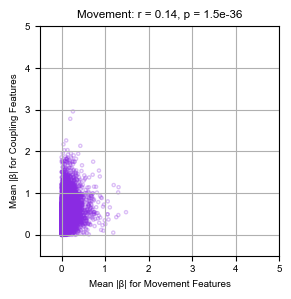

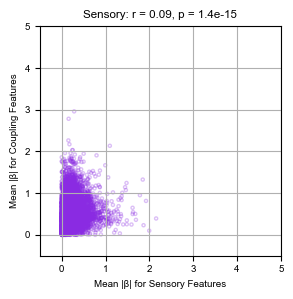

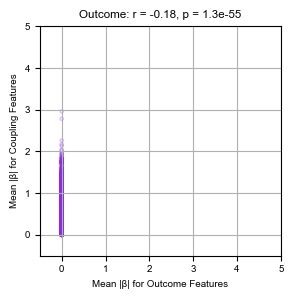

In [39]:
task_feature_groups = {
    'Movement': ['x velocity', 'y velocity', 'view angle', 'left turn', 'right turn'],
    'Sensory': ['sound -90', 'sound 90', 'photostim'],
    'Outcome': ['reward', 'noreward']
}

for group_name, features in task_feature_groups.items():
    # Find row indices for features in this group
    feature_idxs = [updated_feat_names.index(f) for f in features]

    # Mean β across group per neuron
    group_task_beta = np.mean(reordered_totalbeta_feature_unique[feature_idxs, :], axis=0)

    # Correlate with coupling weights
    r, p = pearsonr(group_task_beta, coupling_beta_per_neuron)

    # Plot
    plt.figure(figsize=(3, 3))
    plt.scatter(group_task_beta, coupling_beta_per_neuron, edgecolors='blueviolet', facecolors='none', alpha = 0.3, s=5)
    plt.xlabel(f'Mean |β| for {group_name} Features')
    plt.ylabel('Mean |β| for Coupling Features')
    plt.title(f'{group_name}: r = {r:.2f}, p = {p:.1e}')
    plt.grid(True)
    plt.tight_layout()
    plt.ylim(-0.5,5)
    plt.xlim(-0.5,5)
    plt.show()


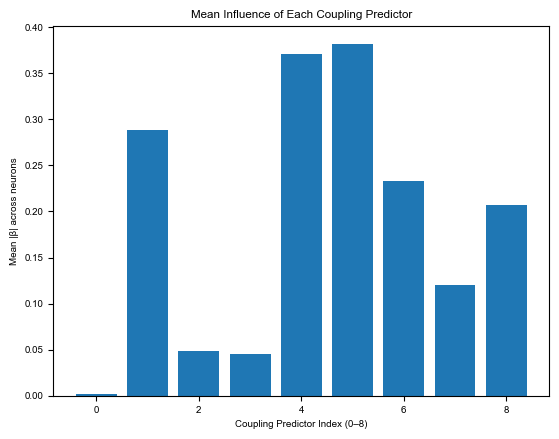

In [67]:
# total_beta_feature_unique is (features x neurons)
# coupling predictors are last 9 rows (adjust if reordered)
coupling_rows = [-9, -8, -7, -6, -5, -4, -3, -2, -1]
coupling_betas = reordered_totalbeta_feature_unique[coupling_rows, :]  # shape (9, N)

mean_abs_beta_per_predictor = np.mean(np.abs(coupling_betas), axis=1)

plt.bar(range(9), mean_abs_beta_per_predictor)
plt.xlabel('Coupling Predictor Index (0–8)')
plt.ylabel('Mean |β| across neurons')
plt.title('Mean Influence of Each Coupling Predictor')
plt.show()


In [96]:
#LOAD FUNCTIONS TO LOOK AT ALIGNED DATA
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import scipy
def align_turns_and_plot(behav_matrix, coupling_predictors, window=30, indices_to_align = (3,4), plot_on = 1):
    # Identify the onset of left and right turns
    left_turn_indices = np.where(behav_matrix[indices_to_align[0]] == 1)[0]
    right_turn_indices = np.where(behav_matrix[indices_to_align[1]] == 1)[0]

    # Combine left and right turn indices
    all_turn_indices = np.concatenate([left_turn_indices, right_turn_indices])
    
    # Create a global trial index array
    sorted_indices = np.sort(all_turn_indices)
    trial_index_map = {idx: i for i, idx in enumerate(sorted_indices)}
    
    # Initialize lists to store aligned coupling predictors and trial indices
    left_aligned_coupling = []
    right_aligned_coupling = []
    left_trials = []
    right_trials = []

    # Align data +/- window frames from left turn onsets
    for idx in left_turn_indices:
        if idx - window >= 0 and idx + window < len(coupling_predictors[0]):
            aligned_data = coupling_predictors[:, idx - window:idx + window + 1]
            left_aligned_coupling.append(aligned_data)
            left_trials.append(trial_index_map[idx])  # Use global trial index

    # Align data +/- window frames from right turn onsets
    for idx in right_turn_indices:
        if idx - window >= 0 and idx + window < len(coupling_predictors[0]):
            aligned_data = coupling_predictors[:, idx - window:idx + window + 1]
            right_aligned_coupling.append(aligned_data)
            right_trials.append(trial_index_map[idx])  # Use global trial index

    # Convert lists to numpy arrays for easy manipulation
    left_aligned_coupling = np.stack(left_aligned_coupling,axis = 0)
    right_aligned_coupling = np.stack(right_aligned_coupling,axis = 0)

    # # Reshape to be trials x frames (stacking vertically)
    # left_aligned_coupling = left_aligned_coupling.reshape(left_aligned_coupling.shape[0], -1)
    # right_aligned_coupling = right_aligned_coupling.reshape(right_aligned_coupling.shape[0], -1)

    print(f'shape (trials x neurons/predictors x frames) aligned:{left_aligned_coupling.shape}')
    print(f'shape (trials x neurons/predictors x frames) aligned:{right_aligned_coupling.shape}')

    # Calculate the mean and standard error across trials for each neuron/predictor
    mean_left_coupling = np.mean(left_aligned_coupling, axis=0)
    sem_left_coupling = np.std(left_aligned_coupling, axis=0) / np.sqrt(left_aligned_coupling.shape[0])
    mean_right_coupling = np.mean(right_aligned_coupling, axis=0)
    sem_right_coupling = np.std(right_aligned_coupling, axis=0) / np.sqrt(right_aligned_coupling.shape[0])

    if plot_on == 1:
        #colors
        new_colors = ('#29663C' ,'#3A9256','#8AD0A2')#('#0a9396','#778da9','#c77dff')
        # Plot the average coupling predictors
        plt.figure(figsize=(6, 6))
        plt.rcParams.update({'font.size': 14, 'font.family': 'arial'})

        plt.subplot(1, 2, 1)
        for neuron_idx in range(mean_left_coupling.shape[0]):
            plt.plot(np.arange(-window, window + 1), mean_left_coupling[neuron_idx, :], label=f'Factor {neuron_idx+1}',color = new_colors[neuron_idx],linewidth = 2)
            plt.fill_between(np.arange(-window, window + 1),
                            mean_left_coupling[neuron_idx, :] - sem_left_coupling[neuron_idx, :],
                            mean_left_coupling[neuron_idx, :] + sem_left_coupling[neuron_idx, :],
                            alpha=0.2, color = new_colors[neuron_idx])
        plt.xlabel('Frames Relative to Turn Onset')
        plt.ylabel('Average Coupling Predictor')
        plt.title('Left Turn')
        plt.legend(frameon = False)
    # # Clean up the appearance
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_box_aspect(1)
        ax.set_xlim(-window,window)


        plt.subplot(1, 2, 2)
        for neuron_idx in range(mean_right_coupling.shape[0]):
            plt.plot(np.arange(-window, window + 1), mean_right_coupling[neuron_idx, :], label=f'Factor {neuron_idx+1}',color = new_colors[neuron_idx],linewidth = 2)
            plt.fill_between(np.arange(-window, window + 1),
                            mean_right_coupling[neuron_idx, :] - sem_right_coupling[neuron_idx, :],
                            mean_right_coupling[neuron_idx, :] + sem_right_coupling[neuron_idx, :],
                            alpha=0.2, color = new_colors[neuron_idx])
        plt.xlabel('Frames Relative to Turn Onset')
        plt.ylabel('Average Coupling Predictor')
        plt.title('Right Turn')
        plt.legend(frameon = False)
        # # Clean up the appearance
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_box_aspect(1)
        ax.set_xlim(-window,window)

        plt.tight_layout()
        plt.show()

    return left_aligned_coupling,right_aligned_coupling, left_trials,right_trials #left_turn_indices, right_turn_indices

def align_general(behav_matrix, coupling_predictors, window=30, indices_to_align = (3,4)):
    # Identify the onset of left and right turns
    if len(indices_to_align)>1:
        left_turn_indices = np.where(behav_matrix[indices_to_align[0]] == 1)[0]
        right_turn_indices = np.where(behav_matrix[indices_to_align[1]] == 1)[0]
        # Combine left and right turn indices
        all_turn_indices = np.concatenate([left_turn_indices, right_turn_indices])
    else:
        left_turn_indices = np.where(behav_matrix[indices_to_align[0]] == 1)[0]
        # Combine left and right turn indices
        all_turn_indices = left_turn_indices
    
    
    # Create a global trial index array
    sorted_indices = np.sort(all_turn_indices)
    trial_index_map = {idx: i for i, idx in enumerate(sorted_indices)}
    
    # Initialize lists to store aligned coupling predictors and trial indices
    aligned_data_all = []

    # Align data using the specified windows
    if isinstance(window, tuple) and len(window) == 2:
        for idx in sorted_indices:
            if idx - window[0] >= 0 and idx + window[1] < len(coupling_predictors[0]):
                aligned_data = coupling_predictors[:, idx - window[0]:idx + window[1] + 1]
                aligned_data_all.append(aligned_data)
    else:
        # If window is a single value
        for idx in sorted_indices:
            if idx - window >= 0 and idx + window < len(coupling_predictors[0]):
                aligned_data = coupling_predictors[:, idx - window:idx + window + 1]
                aligned_data_all.append(aligned_data)

    # Convert lists to numpy arrays for easy manipulation
    aligned_data_all_mat = np.stack(aligned_data_all,axis = 0)

    print(f'shape (trials x neurons/predictors x frames) aligned:{aligned_data_all_mat.shape}')
    return aligned_data_all_mat,all_turn_indices

# Call the function with your data
# align_turns_and_plot(behav_matrix, final_predictors[0:3,:], window=30,indices_to_align = (3,4), plot_on = 0) #0:3, 3:6, 6:10
# Filter data based on correctness
def filter_correct_incorrect(aligned_data, correctness_indices, behavior_matrix, window):
    correct_indices = np.where(behavior_matrix[correctness_indices[0]] == 1)[0]
    incorrect_indices = np.where(behavior_matrix[correctness_indices[1]] == 1)[0]

    correct_data = []
    incorrect_data = []

    for idx in correct_indices:
        if idx - window >= 0 and idx + window < len(aligned_data[0]):
            aligned_data_subset = aligned_data[:, idx - window:idx + window + 1]
            correct_data.append(aligned_data_subset)

    for idx in incorrect_indices:
        if idx - window >= 0 and idx + window < len(aligned_data[0]):
            aligned_data_subset = aligned_data[:, idx - window:idx + window + 1]
            incorrect_data.append(aligned_data_subset)

    return np.stack(correct_data, axis=0), np.stack(incorrect_data, axis=0)


def get_trial_ids_by_condition(condition_array_trials):
    correct_left_ids = []
    correct_right_ids = []
    incorrect_left_ids = []
    incorrect_right_ids = []

    # Loop through each trial in the condition_array_trials
    for i in range(len(condition_array_trials)):
        correct = condition_array_trials[i, 1]
        left_turn = condition_array_trials[i, 2]

        if correct == 1:
            if left_turn == 1:
                correct_left_ids.append(i)
            else:
                correct_right_ids.append(i)
        else:
            if left_turn == 1:
                incorrect_left_ids.append(i)
            else:
                incorrect_right_ids.append(i)

    return correct_left_ids, correct_right_ids, incorrect_left_ids, incorrect_right_ids

#LOAD COUPLING PREDICTORS!
def load_general_coupling_predictors(coupling_predictors, cell_ids):
    #transpose
    coupling_predictors = coupling_predictors.T
    # Assume each cell has 9 predictors: 3 pyr, 3 som, 3 pv
    predictors_per_cell = 9
    
    # Define indices for each cell type within the predictors
    pyr_indices = slice(0, 3)   # First 3 predictors are for pyr
    som_indices = slice(3, 6)   # Next 3 predictors are for som
    pv_indices = slice(6, 9)    # Last 3 predictors are for pv

    # Initialize a dictionary to store the first index of each cell type
    first_indices = {'pyr': None, 'som': None, 'pv': None}

    # Get the first index for each cell type from the neuron_groups dictionary
    for cell_type in ['pyr', 'som', 'pv']:
        if cell_type in neuron_groups and len(neuron_groups[cell_type]) > 0:
            first_indices[cell_type] = neuron_groups[cell_type][0][0]

    # Initialize a list to store the required general predictors
    general_predictors = []

    # Load the predictors using the first occurrences
    if first_indices['pv'] is not None:
        pv_idx = first_indices['pv']
        cell_predictors = coupling_predictors[:, pv_idx * predictors_per_cell:(pv_idx + 1) * predictors_per_cell]
        general_predictors.append(cell_predictors[:, pyr_indices])  # Load pyr predictors
        # general_predictors.append(cell_predictors[:, som_indices])  # Load som predictors

    if first_indices['pyr'] is not None:
        pyr_idx = first_indices['pyr']
        cell_predictors = coupling_predictors[:, pyr_idx * predictors_per_cell:(pyr_idx + 1) * predictors_per_cell]
        general_predictors.append(cell_predictors[:, som_indices])  # Load som predictors
        general_predictors.append(cell_predictors[:, pv_indices])   # Load pv predictors

    if first_indices['som'] is not None:
        som_idx = first_indices['som']
        cell_predictors = coupling_predictors[:, som_idx * predictors_per_cell:(som_idx + 1) * predictors_per_cell]
        general_predictors.append(cell_predictors[:, pyr_indices])  # Load pyr predictors
        general_predictors.append(cell_predictors[:, pv_indices])   # Load pv predictors

    

    # Stack all the selected predictors horizontally
    final_predictors = np.hstack(general_predictors)

    return final_predictors.T, first_indices




IndexError: list index out of range

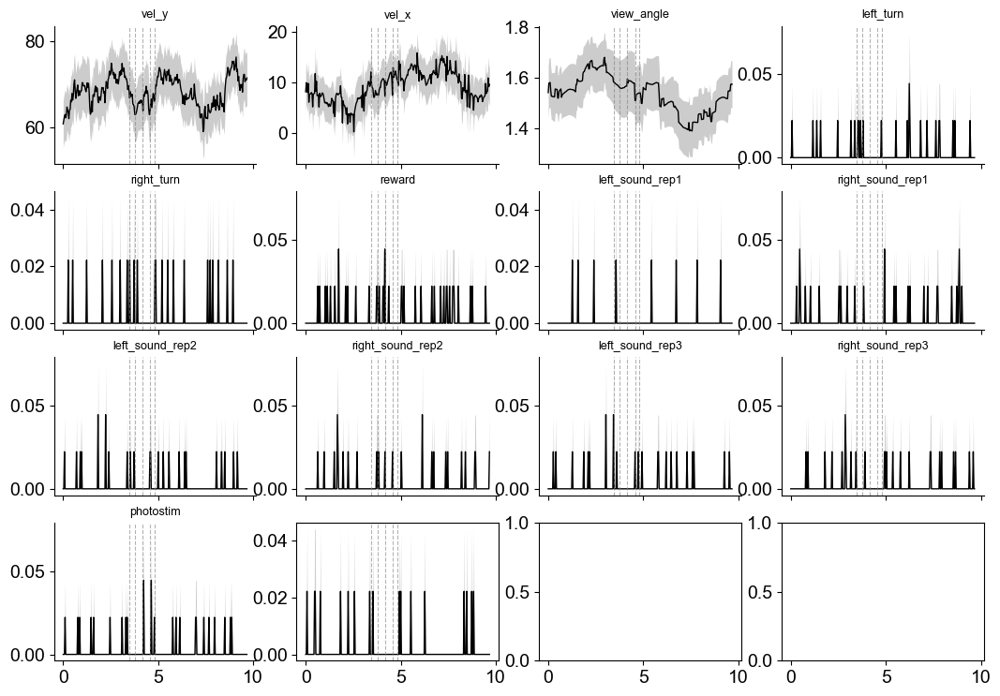

In [111]:
"""
Utilities to align *frame-wise* predictors to trial events and plot trial-averaged traces.

Primary use-case:
- You have a concatenated behavior matrix (predictors x frames) and want to make
  average traces aligned to the same events used by `find_align_info`
  (sound repeats, turn, reward).
"""

from __future__ import annotations

import math
from typing import Dict, Iterable, List, Mapping, Optional, Sequence, Tuple

import numpy as np


# Behavior-matrix column layout (0-indexed) from user description
BEHAV_COLS_DEFAULT: Dict[str, int] = {
    "vel_y": 0,
    "vel_x": 1,
    "view_angle": 2,
    "left_turn": 3,
    "right_turn": 4,
    "reward": 5,
    "left_sound_rep1": 6,
    "right_sound_rep1": 7,
    "left_sound_rep2": 8,
    "right_sound_rep2": 9,
    "left_sound_rep3": 10,
    "right_sound_rep3": 11,
    "photostim": 12,
}

BEHAV_NAMES_DEFAULT: List[str] = [
    "vel_y",
    "vel_x",
    "view_angle",
    "left_turn",
    "right_turn",
    "reward",
    "left_sound_rep1",
    "right_sound_rep1",
    "left_sound_rep2",
    "right_sound_rep2",
    "left_sound_rep3",
    "right_sound_rep3",
    "photostim",
]


# Windows copied from `find_align_info` (left_pad, right_pad)
EVENT_WINDOWS_DEFAULT: Dict[str, Tuple[int, int]] = {
    "sound1": (6, 30),
    "sound2": (1, 30),
    "sound3": (1, 30),
    "turn": (30, 12),
    "reward": (1, 23),
}


def _first_onset(x_bool_1d: np.ndarray) -> Optional[int]:
    idx = np.where(x_bool_1d)[0]
    return int(idx[0]) if idx.size else None


def trial_segments_from_condition_array(
    condition_array_trials: np.ndarray,
    n_total_frames: int,
    trial_start_col: int = 4,
) -> List[Tuple[int, int]]:
    """
    Build (start,end) trial segments in global-frame coordinates using the
    `condition_array_trials[:, trial_start_col]` column (MATLAB 5th column => Python index 4).
    """
    starts = np.asarray(condition_array_trials[:, trial_start_col]).ravel()
    starts = starts[~np.isnan(starts)].astype(int)
    starts = np.unique(starts)
    starts = starts[(starts >= 0) & (starts < n_total_frames)]
    starts.sort()

    segs: List[Tuple[int, int]] = []
    for i, s in enumerate(starts):
        e = (starts[i + 1] - 1) if (i < len(starts) - 1) else (n_total_frames - 1)
        if e >= s:
            segs.append((int(s), int(e)))
    return segs


def compute_event_onsets_from_behav_matrix(
    behav_matrix: np.ndarray,
    trial_segments: Sequence[Tuple[int, int]],
    behav_cols: Mapping[str, int] = BEHAV_COLS_DEFAULT,
) -> Dict[str, np.ndarray]:
    """
    Compute per-trial event onsets (0-based indices, relative within-trial).

    Events:
    - sound1/sound2/sound3: onset of each repeat, combining left+right sound columns
    - turn: first onset of left_turn OR right_turn
    - reward: first onset of reward

    Returns:
    - dict[event_name] = float array shape (n_trials,), where missing onsets are NaN.
    """
    onsets: Dict[str, List[Optional[int]]] = {k: [] for k in ["sound1", "sound2", "sound3", "turn", "reward"]}

    for (s, e) in trial_segments:
        seg = behav_matrix[:, s : e + 1]

        for rep in (1, 2, 3):
            l = behav_cols[f"left_sound_rep{rep}"]
            r = behav_cols[f"right_sound_rep{rep}"]
            onset = _first_onset((seg[l, :] > 0) | (seg[r, :] > 0))
            onsets[f"sound{rep}"].append(onset)

        onset_turn = _first_onset((seg[behav_cols["left_turn"], :] > 0) | (seg[behav_cols["right_turn"], :] > 0))
        onsets["turn"].append(onset_turn)

        onset_reward = _first_onset(seg[behav_cols["reward"], :] > 0)
        onsets["reward"].append(onset_reward)

    out: Dict[str, np.ndarray] = {}
    for k, v in onsets.items():
        out[k] = np.array([np.nan if x is None else x for x in v], dtype=float)
    return out


def align_matrix_to_trial_events(
    X: np.ndarray,
    trial_segments: Sequence[Tuple[int, int]],
    event_onsets: np.ndarray,
    left_pad: int,
    right_pad: int,
) -> np.ndarray:
    """
    Align a frame-wise matrix to per-trial event onsets.

    Parameters:
    - X: (features x frames_total)
    - trial_segments: list of (start,end) in global frames
    - event_onsets: float array (n_trials,), 0-based within-trial; NaN for missing trials
    - left_pad/right_pad: alignment window sizes

    Returns:
    - aligned: (trials x features x window_len) with NaNs where trials are missing/out-of-bounds
    """
    X = np.asarray(X)
    if X.ndim != 2:
        raise ValueError(f"X must be 2D (features x frames). Got {X.shape}")

    n_trials = len(trial_segments)
    win_len = left_pad + right_pad + 1
    aligned = np.full((n_trials, X.shape[0], win_len), np.nan, dtype=float)

    for t, (s, e) in enumerate(trial_segments):
        onset = event_onsets[t]
        if np.isnan(onset):
            continue

        onset_i = int(onset)
        rel_start = onset_i - left_pad
        rel_end = onset_i + right_pad
        trial_len = e - s + 1
        if rel_start < 0 or rel_end >= trial_len:
            continue

        aligned[t, :, :] = X[:, (s + rel_start) : (s + rel_end + 1)]

    return aligned


def nansem(x: np.ndarray, axis: int = 0) -> np.ndarray:
    x = np.asarray(x)
    n = np.sum(~np.isnan(x), axis=axis)
    sd = np.nanstd(x, axis=axis)
    return sd / np.sqrt(np.maximum(n, 1))


def plot_aligned_means_grid(
    aligned: np.ndarray,
    names: Sequence[str],
    title: str,
    left_pad: int,
    ncols: int = 4,
    ylim: Optional[Tuple[float, float]] = None,
):
    """
    Plot mean±SEM per feature in a grid.
    Requires matplotlib (import inside to avoid hard dependency for pure compute usage).
    """
    import matplotlib.pyplot as plt

    mean = np.nanmean(aligned, axis=0)
    sem = nansem(aligned, axis=0)
    t = np.arange(mean.shape[1]) - left_pad

    n_feats = mean.shape[0]
    nrows = math.ceil(n_feats / ncols)
    fig, axs = plt.subplots(nrows, ncols, figsize=(3.2 * ncols, 2.2 * nrows), sharex=True)
    axs = np.array(axs).reshape(-1)

    for i in range(n_feats):
        ax = axs[i]
        ax.plot(t, mean[i], color="black", linewidth=1)
        ax.fill_between(t, mean[i] - sem[i], mean[i] + sem[i], color="black", alpha=0.2, linewidth=0)
        ax.axvline(0, color="gray", linestyle="--", linewidth=0.8)
        ax.set_title(str(names[i]), fontsize=9)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        if ylim is not None:
            ax.set_ylim(ylim)

    for j in range(n_feats, len(axs)):
        axs[j].axis("off")

    fig.suptitle(title)
    fig.tight_layout()
    return fig


def plot_average_predictors_through_trial(
    behav_matrix: np.ndarray,
    condition_array_trials: np.ndarray,
    X_to_plot: Optional[np.ndarray] = None,
    X_names: Optional[Sequence[str]] = None,
    event_windows: Mapping[str, Tuple[int, int]] = EVENT_WINDOWS_DEFAULT,
    behav_cols: Mapping[str, int] = BEHAV_COLS_DEFAULT,
):
    """
    Convenience wrapper:
    - builds trial segments from condition_array_trials
    - extracts event onsets from behav_matrix
    - aligns X_to_plot to each event in event_windows
    - plots trial-averaged mean±SEM grids
    """
    if X_to_plot is None:
        X_to_plot = behav_matrix
    if X_names is None:
        X_names = BEHAV_NAMES_DEFAULT if X_to_plot is behav_matrix else [f"feat{i}" for i in range(X_to_plot.shape[0])]

    trial_segments = trial_segments_from_condition_array(condition_array_trials, n_total_frames=behav_matrix.shape[1])
    event_onsets = compute_event_onsets_from_behav_matrix(behav_matrix, trial_segments, behav_cols=behav_cols)

    figs = {}
    for event, (lp, rp) in event_windows.items():
        aligned = align_matrix_to_trial_events(X_to_plot, trial_segments, event_onsets[event], lp, rp)
        n_valid = int(np.sum(~np.isnan(event_onsets[event])))
        figs[event] = plot_aligned_means_grid(
            aligned,
            names=X_names,
            title=f"{event} aligned (n={n_valid} trials)",
            left_pad=lp,
        )
    return figs


def plot_trial_locked_average_with_event_markers(
    behav_matrix: np.ndarray,
    condition_array_trials: np.ndarray,
    X_to_plot: Optional[np.ndarray] = None,
    X_names: Optional[Sequence[str]] = None,
    behav_cols: Mapping[str, int] = BEHAV_COLS_DEFAULT,
    events: Sequence[str] = ("sound1", "sound2", "sound3", "turn", "reward"),
    frame_rate_hz: Optional[float] = 30.0,
    trial_start_col: int = 4,
    max_trial_len: Optional[int] = None,
    show_sem: bool = True,
):
    """
    Make a *single* plot aligned to trial start (frame 0), and overlay markers for
    multiple event onsets (sound1/2/3, turn, reward) simultaneously.

    This is useful when you want to see predictors "throughout the trial" with all
    events shown on one time axis (instead of separate event-aligned windows).

    Notes:
    - Trials are segmented using `condition_array_trials[:, trial_start_col]`.
    - Each trial is truncated to a common length for averaging:
        - If `max_trial_len` is provided, uses that (capped by each trial's length).
        - Otherwise uses the minimum trial length across detected trials.
    - Event markers are placed at the *median* event onset across trials.
    """
    import matplotlib.pyplot as plt

    if X_to_plot is None:
        X_to_plot = behav_matrix
    if X_names is None:
        X_names = BEHAV_NAMES_DEFAULT if X_to_plot is behav_matrix else [f"feat{i}" for i in range(X_to_plot.shape[0])]

    trial_segments = trial_segments_from_condition_array(
        condition_array_trials,
        n_total_frames=behav_matrix.shape[1],
        trial_start_col=trial_start_col,
    )
    if len(trial_segments) == 0:
        raise ValueError("No trial segments found from condition_array_trials.")

    # Determine common length for averaging
    trial_lens = np.array([e - s + 1 for (s, e) in trial_segments], dtype=int)
    common_len = int(np.min(trial_lens)) if max_trial_len is None else int(min(np.min(trial_lens), max_trial_len))
    if common_len <= 1:
        raise ValueError("Common trial length too small to plot.")

    # Stack trial-locked data: (trials x features x time)
    n_trials = len(trial_segments)
    X = np.asarray(X_to_plot)
    if X.ndim != 2:
        raise ValueError(f"X_to_plot must be 2D (features x frames). Got {X.shape}")
    trial_locked = np.full((n_trials, X.shape[0], common_len), np.nan, dtype=float)
    for t, (s, e) in enumerate(trial_segments):
        seg_len = e - s + 1
        use_len = min(seg_len, common_len)
        trial_locked[t, :, :use_len] = X[:, s : s + use_len]

    # Compute event onsets from behav_matrix (relative within trial)
    event_onsets = compute_event_onsets_from_behav_matrix(behav_matrix, trial_segments, behav_cols=behav_cols)

    # Time axis
    x = np.arange(common_len)
    xlabel = "Frame (trial start = 0)"
    if frame_rate_hz is not None and frame_rate_hz > 0:
        x = x / float(frame_rate_hz)
        xlabel = "Time (s, trial start = 0)"

    mean = np.nanmean(trial_locked, axis=0)  # (features x time)
    sem = nansem(trial_locked, axis=0) if show_sem else None

    # Plot as stacked small multiples (one axis per feature) to keep it readable
    n_feats = mean.shape[0]
    ncols = 4
    nrows = math.ceil(n_feats / ncols)
    fig, axs = plt.subplots(nrows, ncols, figsize=(3.2 * ncols, 2.2 * nrows), sharex=True)
    axs = np.array(axs).reshape(-1)

    # Compute median onset time per event (only within common_len)
    event_medians = {}
    for ev in events:
        if ev not in event_onsets:
            continue
        vals = event_onsets[ev]
        vals = vals[~np.isnan(vals)]
        vals = vals[vals < common_len]
        if vals.size:
            med = float(np.median(vals))
            med_x = med / float(frame_rate_hz) if frame_rate_hz is not None and frame_rate_hz > 0 else med
            event_medians[ev] = med_x

    for i in range(n_feats):
        ax = axs[i]
        ax.plot(x, mean[i], color="black", linewidth=1)
        if sem is not None:
            ax.fill_between(x, mean[i] - sem[i], mean[i] + sem[i], color="black", alpha=0.2, linewidth=0)

        # event markers
        for ev, ev_x in event_medians.items():
            ax.axvline(ev_x, color="gray", linestyle="--", linewidth=0.8, alpha=0.6)

        ax.set_title(str(X_names[i]), fontsize=9)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    for j in range(n_feats, len(axs)):
        axs[j].axis("off")

    fig.suptitle("Trial-locked average with event markers (S1/S2/S3/Turn/Reward)")
    for ax in axs[: min(n_feats, len(axs))]:
        ax.set_xlabel(xlabel)
    fig.tight_layout()
    return fig, event_medians

# Behavior predictors, one figure with all event markers
fig, event_medians = plot_trial_locked_average_with_event_markers(
    behav_matrix,
    condition_array_trials,
    frame_rate_hz=30.0,   # set None to use frames instead of seconds
)

V:\Connie\ProcessedData\HA11-1R/2023-05-05/GLM_3nmf_pre/prepost trial cv 73 #1/test
First indices for each cell type: {'pyr': 22, 'som': 29, 'pv': 0}
shape (trials x neurons/predictors x frames) aligned:(35, 3, 121)
shape (trials x neurons/predictors x frames) aligned:(27, 3, 121)


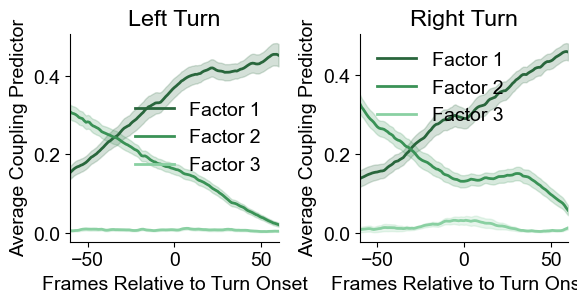

Accuracy: 0.74
Confusion Matrix:
[[10  2]
 [ 3  4]]
Classification Report:
              precision    recall  f1-score   support

   Left Turn       0.77      0.83      0.80        12
  Right Turn       0.67      0.57      0.62         7

    accuracy                           0.74        19
   macro avg       0.72      0.70      0.71        19
weighted avg       0.73      0.74      0.73        19



In [112]:
#QUICKLY RUN ONE FOLD OF DATA FOR A PARTICULAR MOUSE
mouse = "HA11-1R"
date = "2023-05-05"
server = "V:"
fold_number = 0
results = results_pre
# coupling_celltype = list(0:3) #0:3, 3:6, 6:10
current_save_directory = f'{server}\Connie\ProcessedData\{mouse}/{date}/GLM_3nmf_pre/'
path = os.path.join(current_save_directory, "prepost trial cv 73 #{}/test".format(fold_number+1))
print(path)

# Load actual response data
coupling_matrix = scipy.io.loadmat(os.path.join(path, 'cells_big_matrix.mat'))
coupling_predictors = coupling_matrix['cells_big_matrix']

condition_mat = scipy.io.loadmat(os.path.join(path, 'condition_array_trials.mat'))
condition_array_trials = condition_mat['condition_array_trials']

#load behav to figure out trials
behav_ids = scipy.io.loadmat(os.path.join(path,'behav_the_matrix_ids.mat'))
behav_ids_matrix = behav_ids['behav_the_matrix_ids'][0]

#load behav matrix to have some sort of trial structure
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix'] #7/8 are sounds, 4 left turns, 5 right turns

behav_long = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix.mat'))
behav_big_matrix = behav_long['behav_big_matrix']

# Example usage:
# Assuming 'coupling_predictors' is a (num_frames, num_cells * 9) matrix
# and 'cell_ids' is a list of cell types (length num_cells) where each element is 'pyr', 'som', or 'pv'
final_predictors, first_indices = load_general_coupling_predictors(coupling_predictors, results[f'{mouse}_{date}']['neuron_groups'])

# Print the first indices of each cell type
print("First indices for each cell type:", first_indices)
left_aligned_coupling, right_aligned_coupling,_,_ = align_turns_and_plot(behav_matrix, final_predictors[0:3,:], window=60,indices_to_align = (3,4), plot_on = 1) #0:3, 3:6, 6:10

def decode_turn_choice(left_aligned_coupling, right_aligned_coupling):
    # Flatten the aligned coupling predictors for each trial
    X_left = left_aligned_coupling.reshape(left_aligned_coupling.shape[0], -1)  # Shape: (n_trials, n_features)
    X_right = right_aligned_coupling.reshape(right_aligned_coupling.shape[0], -1)  # Shape: (n_trials, n_features)

    # Create labels: 0 for left turns, 1 for right turns
    y_left = np.zeros(X_left.shape[0])
    y_right = np.ones(X_right.shape[0])

    # Combine left and right turn data
    X = np.vstack((X_left, X_right))
    y = np.hstack((y_left, y_right))

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Initialize the SVM classifier
    clf = SVC(kernel='linear')

    # Train the classifier
    clf.fit(X_train, y_train)

    # Predict on the test set
    y_pred = clf.predict(X_test)

    # Evaluate the classifier
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred, target_names=['Left Turn', 'Right Turn'])

    # Output the results
    print(f'Accuracy: {accuracy:.2f}')
    print('Confusion Matrix:')
    print(conf_matrix)
    print('Classification Report:')
    print(class_report)

    return clf

classifier = decode_turn_choice(left_aligned_coupling, right_aligned_coupling)

In [115]:
# behav_ids_matrix
#reward = 5, left sound = 6, right sound = 7, photostim = 13
# plt.plot(behav_matrix[7,:])
import numpy as np
 
def find_align_info_from_behav(
    behav_matrix: np.ndarray,
    condition_array_trials: np.ndarray | None = None,
    trial_start_frames: np.ndarray | None = None,
    trial_start_col: int = 4,  # MATLAB 5th col -> python index 4
    alternative_alignment: bool = False,
    behav_cols: dict | None = None,
    behav_big_matrix: np.ndarray | None = None,
    no_reward_big_row: int | None = 182,  # e.g. behav_big_matrix[182,:] marks "no reward / pure"
):
    """
    Like find_align_info, but computed directly from concatenated behavior matrices.
 
    Events (per trial):
      0 sound1 onset  (left OR right sound rep1)
      1 sound2 onset  (left OR right sound rep2)
      2 sound3 onset  (left OR right sound rep3)
      3 turn onset    (left_turn OR right_turn)
      4 reward onset  (reward; if missing, falls back to "no reward/pure" from behav_big_matrix[no_reward_big_row])
 
    alignment_frames are 0-based indices *within-trial* (NaN if missing).
 
    Returns: align_info, alignment_frames, left_padding, right_padding
    """
    if behav_cols is None:
        behav_cols = {
            "vel_y": 0,
            "vel_x": 1,
            "view_angle": 2,
            "left_turn": 3,
            "right_turn": 4,
            "reward": 5,
            "left_sound_rep1": 6,
            "right_sound_rep1": 7,
            "left_sound_rep2": 8,
            "right_sound_rep2": 9,
            "left_sound_rep3": 10,
            "right_sound_rep3": 11,
            "photostim": 12,
        }
 
    if trial_start_frames is None:
        if condition_array_trials is None:
            raise ValueError("Provide either trial_start_frames or condition_array_trials.")
        trial_start_frames = np.asarray(condition_array_trials[:, trial_start_col]).ravel()
    else:
        trial_start_frames = np.asarray(trial_start_frames).ravel()
 
    # Clean/sort/unique trial starts
    trial_start_frames = trial_start_frames[~np.isnan(trial_start_frames)].astype(int)
    trial_start_frames = np.unique(trial_start_frames)
    trial_start_frames = trial_start_frames[(trial_start_frames >= 0) & (trial_start_frames < behav_matrix.shape[1])]
    trial_start_frames.sort()
 
    # Build (start,end) global frame segments per trial
    trial_segments = []
    for i, s in enumerate(trial_start_frames):
        e = (trial_start_frames[i + 1] - 1) if i < len(trial_start_frames) - 1 else (behav_matrix.shape[1] - 1)
        if e >= s:
            trial_segments.append((int(s), int(e)))
 
    def first_onset(x_1d):
        idx = np.where(x_1d)[0]
        return int(idx[0]) if idx.size else None
 
    # Per-trial onsets (0-based within-trial)
    sound_onsets = []  # list of [s1,s2,s3] per trial
    turn_onsets = []
    reward_or_pure_onsets = []
 
    for (s, e) in trial_segments:
        seg = behav_matrix[:, s : e + 1]
 
        # sound repeats: combine left+right for each repeat
        s1 = first_onset((seg[behav_cols["left_sound_rep1"], :] > 0) | (seg[behav_cols["right_sound_rep1"], :] > 0))
        s2 = first_onset((seg[behav_cols["left_sound_rep2"], :] > 0) | (seg[behav_cols["right_sound_rep2"], :] > 0))
        s3 = first_onset((seg[behav_cols["left_sound_rep3"], :] > 0) | (seg[behav_cols["right_sound_rep3"], :] > 0))
        sound_onsets.append([s1, s2, s3])
 
        # turn: first onset of left OR right
        t_on = first_onset((seg[behav_cols["left_turn"], :] > 0) | (seg[behav_cols["right_turn"], :] > 0))
        turn_onsets.append(t_on)
 
        # reward: first reward; if missing and no_reward_big_row is available, use that instead
        r_on = first_onset(seg[behav_cols["reward"], :] > 0)
 
        if r_on is None and behav_big_matrix is not None and no_reward_big_row is not None:
            big_seg = behav_big_matrix[no_reward_big_row, s : e + 1]
            # treat any >0 as "on"/onset (works even if it's convolved)
            r_on = first_onset(big_seg > 0)
 
        reward_or_pure_onsets.append(r_on)
 
    n_trials = len(trial_segments)
    sound_onsets_arr = np.array(
        [[np.nan if x is None else x for x in row] for row in sound_onsets],
        dtype=float,
    )  # (trials,3)
    turn_onsets_arr = np.array([np.nan if x is None else x for x in turn_onsets], dtype=float)
    reward_onsets_arr = np.array([np.nan if x is None else x for x in reward_or_pure_onsets], dtype=float)
 
    # alignment_frames (events x trials)
    event_names = ["sound1", "sound2", "sound3", "turn", "reward_or_pure"]
    alignment_frames = np.full((len(event_names), n_trials), np.nan, dtype=float)
    alignment_frames[0, :] = sound_onsets_arr[:, 0]
    alignment_frames[1, :] = sound_onsets_arr[:, 1]
    alignment_frames[2, :] = sound_onsets_arr[:, 2]
    alignment_frames[3, :] = turn_onsets_arr
    alignment_frames[4, :] = reward_onsets_arr
 
    # Padding windows (copied from your find_align_info defaults)
    left_padding = {}
    right_padding = {}
    for ev in range(len(event_names)):
        if ev == 0:
            left_padding[ev] = 6
            right_padding[ev] = 30
        elif ev in (1, 2):
            left_padding[ev] = 1
            right_padding[ev] = 30
        elif ev == 3:
            left_padding[ev] = 90 if alternative_alignment else 30
            right_padding[ev] = 60 if alternative_alignment else 12
        elif ev == 4:
            left_padding[ev] = 1
            right_padding[ev] = 23
 
    align_info = {
        "event_names": event_names,
        "trial_start_frames": trial_start_frames,
        "trial_segments": trial_segments,
        "stimulus_repeats_onsets": sound_onsets_arr,   # (trials,3)
        "turn_onset": turn_onsets_arr,                 # (trials,)
        "reward_or_pure_onset": reward_onsets_arr,     # (trials,)
        "alignment_frames": alignment_frames,
        "left_padding": left_padding,
        "right_padding": right_padding,
        "no_reward_big_row": no_reward_big_row,
    }
 
    return align_info, alignment_frames, left_padding, right_padding

_, trials_included, relative_trial_starts = get_testing_trial_frames(combined_frames_included, range(0,combined_frames_included[-1]), condition_array_trials)
align_info, alignment_frames, left_padding, right_padding = find_align_info_from_behav(
            behav_matrix= behav_matrix,
            condition_array_trials= condition_array_trials,
            trial_start_frames = relative_trial_starts,
            trial_start_col= 4,  # MATLAB 5th col -> python index 4
            alternative_alignment= False,
            behav_cols= None,
            behav_big_matrix = behav_big_matrix,
            no_reward_big_row = 182,  # e.g. behav_big_matrix[182,:] marks "no reward / pure"
        )


NameError: name 'get_testing_trial_frames' is not defined

In [ ]:
def find_align_info(self,imaging, turn_frames, alternative_alignment=False):
        empty_trials = [i for i in range(len(imaging)) if not imaging[i]['good_trial']]
        good_trials = [i for i in range(len(imaging)) if i not in empty_trials]

        imaging_array = [imaging[i]['movement_in_imaging_time'][0][0] for i in good_trials]
        align_info = {}

        # Get maze length
        maze_length = [len(trial['maze_frames'][0]) for trial in imaging_array]

        # Get stimulus info
        stimulus_repeats_onsets = []
        for trial in imaging_array:
            stimulus = np.array(trial['stimulus'][0])
            diff_stimulus = np.diff(stimulus)
            peaks, _ = find_peaks(diff_stimulus)
            stimulus_repeats_onsets.append(peaks + 1)  # Adjust for diff offset

        total_stimulus_repeats = [len(onsets) + 1 for onsets in stimulus_repeats_onsets]
        stim_onset = [np.min(onsets) for onsets in stimulus_repeats_onsets]

        shortest_maze_length = min(
            maze_len - stim_on for maze_len, stim_on in zip(maze_length, stim_onset)
        )
        min_length_stim = min(stim_onset) - 1

        if min_length_stim == 0:
            min_length_stim = min(set(stim_onset) - {min(stim_onset)}) - 1

        # Get reward info
        max_length_reward = min(len(trial['reward_frames'][0]) for trial in imaging_array)
        reward_onset = [
            np.where(np.array(trial['is_reward'][0]) == 1)[0] for trial in imaging_array
        ]
        reward_trial = [i for i, onset in enumerate(reward_onset) if len(onset) > 0]
        min_length_reward = min(
            reward_onset[i][0] - np.min(imaging_array[i]['reward_frames'][0])
            for i in reward_trial
        )

        # Pure tones
        pure_onsets = [
            np.where(np.array(trial['pure_tones'][0]) == 1)[0] for trial in imaging_array
        ]
        pure_onsets = [np.min(onset) for onset in pure_onsets if len(onset) > 0]

        # Frame alignments
        frames_around = turn_frames
        align_info['turn_onset'] = frames_around + 1
        align_info['maze_length'] = maze_length
        align_info['min_length'] = shortest_maze_length
        align_info['stimulus_onset'] = min_length_stim + 1
        align_info['stimulus_repeats_onsets'] = stimulus_repeats_onsets
        align_info['total_stimulus_repeats'] = total_stimulus_repeats
        align_info['max_length_reward'] = max_length_reward
        align_info['reward_onset'] = min_length_reward + 1
        align_info['pure_onsets'] = pure_onsets
        align_info['good_trials'] = good_trials

        # Event alignment
        alignment_frames = np.zeros((6, len(good_trials)))  # 6 events, len(good_trials) trials
        left_padding = {}
        right_padding = {}

        for event in range(6):
            if event == 0:
                alignment_frames[event,:] = [onsets[0] for onsets in stimulus_repeats_onsets]
                left_padding[event] = 6
                right_padding[event] = 30

            elif event in [1,2]:
                alignment_frames[event,:] = [onsets[event] for onsets in stimulus_repeats_onsets]
                left_padding[event] = 1
                right_padding[event] = 30

            elif event == 3:
                alignment_frames[event,:] = [
                    trial['turn_frame'][0] - 1 if isinstance(trial['turn_frame'], list) else trial['turn_frame'] - 1
                    for trial in imaging_array
                ]
                left_padding[event] = 30 if not alternative_alignment else 90
                right_padding[event] = 12 if not alternative_alignment else 60


            elif event == 4:
                if all(len(onset) == 0 for onset in reward_onset):
                    alignment_frames[event,:] = pure_onsets
                    left_padding[event] = 1 if not alternative_alignment else 60
                    right_padding[event] = max_length_reward - 1
                else:
                    alignment_frames[event,:] = [None] * len(good_trials)
                    for i in reward_trial:
                        alignment_frames[event,i] = reward_onset[i][0]
                    incorrect_trials = set(range(len(good_trials))) - set(reward_trial)
                    for i in incorrect_trials:
                        alignment_frames[event,i] = pure_onsets[i]
                    left_padding[event] = 1
                    right_padding[event] = 23

            elif event == 5:
                alignment_frames[event,:] = [trial['iti_frames'][0][0] for trial in imaging_array]
                left_padding[event] = 1
                right_padding[event] = 80

        align_info['alignment_frames'] = alignment_frames
        align_info['left_padding'] = left_padding
        align_info['right_padding'] = right_padding

        return align_info, alignment_frames, left_padding, right_padding

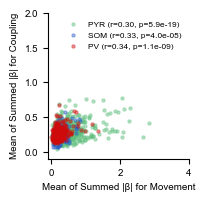

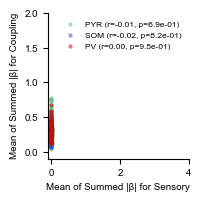

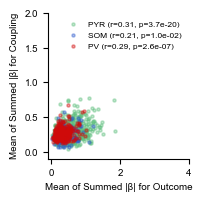

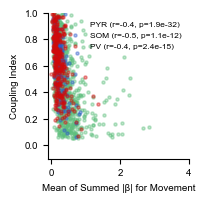

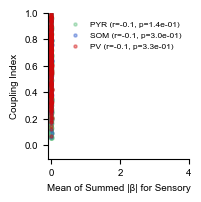

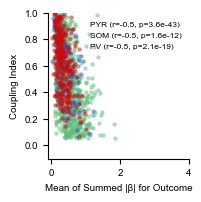

In [63]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Define feature groupings
movement_feats = ['x velocity', 'y velocity', 'view angle', 'left turn', 'right turn']
sensory_feats = ['sound -90', 'sound 90', 'photostim']
outcome_feats = ['reward', 'noreward']

grouped_features = {
    'Movement': movement_feats,
    'Sensory': sensory_feats,
    'Outcome': outcome_feats
}
threshold = 0.05 #for coupling index filtering

# Define colors per cell type
celltype_colors = {'pyr': 'mediumorchid', 'som': 'deepskyblue', 'pv': 'crimson'}

# Get feature indices
feat_name_to_index = {feat: i for i, feat in enumerate(updated_feat_names)}
grouped_feature_indices = {
    group: [feat_name_to_index[f] for f in feats if f in feat_name_to_index]
    for group, feats in grouped_features.items()
}

# Coupling indices are always last 3
coupling_rows = [-3, -2, -1]

plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})
# mpl.rcParams['pdf.fonttype'] = 42   # TrueType fonts (editable)

# PLOT
for group_name, feat_inds in grouped_feature_indices.items():
    plt.figure(figsize=(2, 2))
    
    for ct in ['pyr', 'som', 'pv']:
        cell_inds = neuron_groups[ct]
        cell_inds_updated = cell_inds[np.array(coupling_index_by_celltype[('No Coupling','All')][ct]['Active ITI']) > threshold]
        beta_subset = reordered_totalbeta_feature_unique[:, cell_inds_updated]
        
        # Compute mean absolute β per feature group
        task_beta = np.mean(np.abs(beta_subset[feat_inds, :]), axis=0).ravel()
        coupling_beta = np.mean(np.abs(beta_subset[coupling_rows, :]), axis=0).ravel()
        
        # Correlation
        r, p = stats.pearsonr(task_beta, coupling_beta)
        
        # Plot
        plt.scatter(task_beta, coupling_beta, 
                    label=f'{ct.upper()} (r={r:.2f}, p={p:.1e})', 
                    alpha=0.4, s=5, color= plotter.default_colors[ct] ) #celltype_colors[ct]
    
    # plt.title(f'{group_name} Features')
    plt.xlabel(f'Mean of Summed |β| for {group_name}')
    plt.ylabel('Mean of Summed |β| for Coupling')
    plt.legend(fontsize=6, frameon=False)
    # plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.ylim(-0.1,2)
    plt.xlim(-0.1,4)
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.savefig(f'{plotter.save_results}/beta_vs_coupling/{model_types}_{group_name}_vs_coupling_meanofsum_threshold.pdf', bbox_inches='tight')
    plt.show()

# PLOT
for group_name, feat_inds in grouped_feature_indices.items():
    plt.figure(figsize=(2, 2))
    
    for ct in ['pyr', 'som', 'pv']:
        cell_inds = neuron_groups[ct]
        current_coupling = coupling_index_by_celltype[('No Coupling','All')][ct]['Active ITI']
        mask = np.array(current_coupling) > threshold
        cell_inds_updated = cell_inds[mask]
        coupling_vals = np.array(current_coupling)[mask]
        beta_subset = reordered_totalbeta_feature_unique[:, cell_inds_updated]
        
        # Compute mean absolute β per feature group
        task_beta = np.mean(np.abs(beta_subset[feat_inds, :]), axis=0).ravel()
        coupling_beta = coupling_vals#np.mean(np.abs(beta_subset[coupling_rows, :]), axis=0).ravel()
        
        # Correlation
        r, p = stats.pearsonr(task_beta, coupling_vals)
        
        # Plot
        plt.scatter(task_beta, coupling_beta, 
                    label=f'{ct.upper()} (r={r:.1f}, p={p:.1e})', 
                    alpha=0.4, s=5, color= plotter.default_colors[ct] ) #celltype_colors[ct]
    
    # plt.title(f'{group_name} Features')
    plt.xlabel(f'Mean of Summed |β| for {group_name}')
    plt.ylabel('Coupling Index')
    plt.legend(fontsize=6, frameon=False)
    # plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.ylim(-0.1,1)
    plt.xlim(-0.1,4)
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.savefig(f'{plotter.save_results}/beta_vs_coupling/{model_types}_{group_name}_vs_couplingindex_meanofsum_threshold.pdf', bbox_inches='tight')
    plt.show()


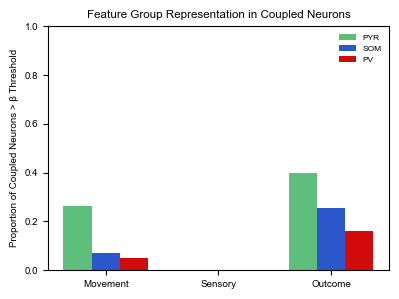

In [66]:
# Define threshold for what counts as "significant β"
beta_threshold = 0.5
# Container to store proportions
feature_group_counts = {ct: {} for ct in ['pyr', 'som', 'pv']}
for group_name, feat_inds in grouped_feature_indices.items():
    for ct in ['pyr', 'som', 'pv']:
        cell_inds = neuron_groups[ct]
        # Apply coupling threshold
        coupling_mask = np.array(coupling_index_by_celltype[('No Coupling','All')][ct]['Active ITI']) > threshold
        cell_inds_updated = cell_inds[coupling_mask]
        # Get beta subset for current group
        beta_subset = reordered_totalbeta_feature_unique[:, cell_inds_updated]
        # Get mean |β| for feature group
        task_betas = np.mean(np.abs(beta_subset[feat_inds, :]), axis=0)# shape: (N_neurons,)
        # Count how many neurons exceed threshold
        n_above_thresh = np.sum(task_betas > beta_threshold)
        proportion = n_above_thresh / len(task_betas) if len(task_betas) > 0 else np.nan
        # Store
        feature_group_counts[ct][group_name] = proportion
# ------------------------------
# Plotting summary as grouped bar plot
import matplotlib.pyplot as plt
groups = list(grouped_feature_indices.keys())
cell_types = ['pyr', 'som', 'pv']
bar_width = 0.25
x = np.arange(len(groups))
plt.figure(figsize=(4, 3))
for i, ct in enumerate(cell_types):
    y_vals = [feature_group_counts[ct][g] for g in groups]
    plt.bar(x + i * bar_width, y_vals, width=bar_width, label=ct.upper(), color=plotter.default_colors[ct])
plt.xticks(x + bar_width, groups)
plt.ylabel('Proportion of Coupled Neurons > β Threshold')
plt.ylim(0, 1)
plt.title('Feature Group Representation in Coupled Neurons')
plt.legend(frameon=False, fontsize=6)
plt.tight_layout()
plt.savefig(f'{plotter.save_results}/beta_vs_coupling/feature_overrep_in_coupled_neurons_iti.pdf', bbox_inches='tight')
plt.show()

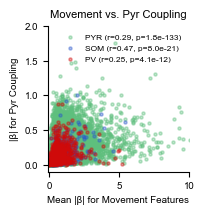

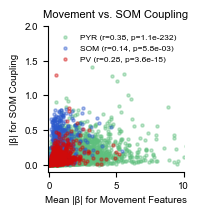

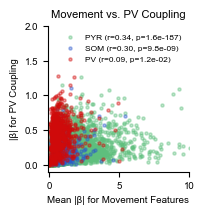

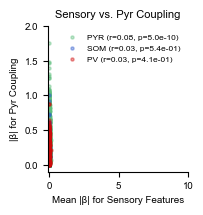

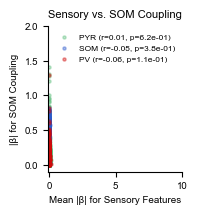

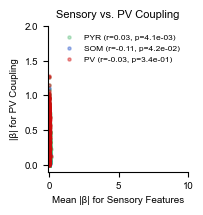

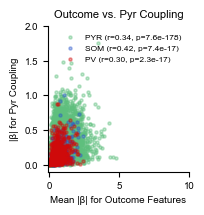

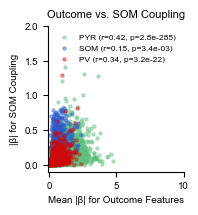

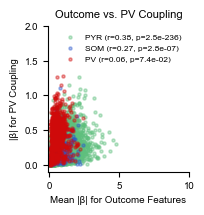

In [ ]:
#SAME PLOTS BUT NOW FOR EACH COUPLING TYPE INDIVIDUALLY
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Define task feature groupings
movement_feats = ['x velocity', 'y velocity'] #, 'view angle', 'left turn', 'right turn']
sensory_feats = ['sound -90', 'sound 90', 'photostim']
outcome_feats = ['reward', 'noreward']

grouped_features = {
    'Movement': movement_feats,
    'Sensory': sensory_feats,
    'Outcome': outcome_feats
}

# Coupling predictor labels (assumed to be last 3 in reordered_totalbeta_feature_unique)
coupling_types = {
    'Pyr Coupling': -3,
    'SOM Coupling': -2,
    'PV Coupling': -1
}

# Define colors per cell type
celltype_colors = {'pyr': 'mediumorchid', 'som': 'deepskyblue', 'pv': 'crimson'}

# Get feature indices for each task group
feat_name_to_index = {feat: i for i, feat in enumerate(updated_feat_names)}
grouped_feature_indices = {
    group: [feat_name_to_index[f] for f in feats if f in feat_name_to_index]
    for group, feats in grouped_features.items()
}

# Plot style
plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})

# Loop over each task group (Movement, Sensory, Outcome)
for task_group, feat_inds in grouped_feature_indices.items():
    # Loop over each coupling type (Pyr, SOM, PV)
    for coupling_label, coupling_row in coupling_types.items():
        plt.figure(figsize=(2, 2))
        
        for ct in ['pyr', 'som', 'pv']:
            cell_inds = neuron_groups[ct]
            beta_subset = reordered_totalbeta_feature_unique[:, cell_inds] #reordered_mean_neuron_feature_unique #reordered_totalbeta_feature_unique
            
            # Get mean |β| for task group
            #mean
            # task_beta = np.mean(np.abs(beta_subset[feat_inds, :]), axis=0).ravel()
            #sum
            task_beta = np.sum(np.abs(beta_subset[feat_inds, :]), axis=0).ravel()
            
            # Get |β| for this specific coupling predictor
            coupling_beta = np.abs(beta_subset[coupling_row, :]).ravel()
            
            # Correlation
            r, p = stats.pearsonr(task_beta, coupling_beta)
            
            # Plot
            plt.scatter(task_beta, coupling_beta,
                        label=f'{ct.upper()} (r={r:.2f}, p={p:.1e})',
                        alpha=0.4, s=5, color=plotter.default_colors[ct])
        
        plt.xlabel(f'Mean |β| for {task_group} Features')
        plt.ylabel(f'|β| for {coupling_label}')
        plt.legend(fontsize=6, frameon=False)
        plt.tight_layout()
        plt.ylim(-0.1, 2) #when using the mean (-0.1, 1)
        plt.xlim(-0.1, 10)
        ax = plt.gca()
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        plt.title(f'{task_group} vs. {coupling_label}', fontsize=8)
        plt.savefig(f'{plotter.save_results}/beta_vs_coupling/{model_types}_{task_group}_vs_{coupling_label}_sum.pdf', bbox_inches='tight')
        plt.show()


In [11]:
def identify_switching_neurons(B_weights_contexts, coupling_indices, start_indices):
    """
    Identify neurons whose coupling weights switch sign across contexts.

    Parameters:
    - B_weights_contexts: list of np.arrays (one per context), each shaped (features, total_neurons)
    - coupling_indices: list or range of coupling predictor indices
    - start_indices: list of ints indicating the start index of each dataset

    Returns:
    - switching_neuron_mask: boolean array (total_neurons,) True if neuron flipped sign
    - neuron_signs: dict mapping neuron index to [sign_context1, sign_context2, ...]
    """

    num_contexts = len(B_weights_contexts)
    total_neurons = B_weights_contexts[0].shape[1]
    neuron_signs = {}

    # Collect mean coupling weight sign per neuron, per context
    for n in range(total_neurons):
        signs = []
        for c in range(num_contexts):
            weights = B_weights_contexts[c][coupling_indices, n]
            mean_weight = np.nanmean(weights)
            sign = np.sign(mean_weight) if np.abs(mean_weight) > 1e-5 else 0
            signs.append(sign)
        neuron_signs[n] = signs

    # Determine which neurons have conflicting signs
    switching_neuron_mask = np.zeros(total_neurons, dtype=bool)
    for n, signs in neuron_signs.items():
        unique_signs = set(signs) - {0}  # ignore zeros
        if len(unique_signs) > 1:
            switching_neuron_mask[n] = True

    return switching_neuron_mask, neuron_signs

import numpy as np
import matplotlib.pyplot as plt

def plot_avg_coupling_weights_per_group(
    combined_B_weights, coupling_indices, neuron_groups,
    dataset_labels=None, title="Average Coupling Weights per Cell Type"
):
    """
    Plot average coupling weights for each cell type across all datasets.

    Parameters:
    - combined_B_weights: Full weight matrix (features x neurons).
    - coupling_indices: List of indices corresponding to coupling predictors.
    - neuron_groups: Dictionary mapping cell type (e.g., 'pyr') to neuron index arrays.
    - dataset_labels: Optional list of dataset identifiers to show on x-axis.
    - title: Plot title.
    """
    fig, ax = plt.subplots(figsize=(8, 6))
    colors = {'pyr': '#5DAF83', 'som': '#4669D2', 'pv': '#D23F3F'}
    x = np.arange(len(neuron_groups))

    mean_weights = []
    std_weights = []

    labels = []

    for i, (celltype, indices) in enumerate(neuron_groups.items()):
        weights = combined_B_weights[coupling_indices, indices.flatten()]
        avg = np.mean(weights)
        std = np.std(weights)
        mean_weights.append(avg)
        std_weights.append(std)
        labels.append(celltype)

    ax.bar(x, mean_weights, yerr=std_weights, capsize=5, color=[colors[label] for label in labels])
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.set_ylabel('Mean Coupling Weight')
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

def plot_switching_fraction_by_celltype(celltype_array, switching_indices, cell_type_labels={0: 'pyr', 1: 'som', 2: 'pv'}):
    unique_types = np.unique(celltype_array)
    counts = []
    switches = []

    celltype_array  = np.array(celltype_array)  # Ensure it's a numpy array for efficient operations

    for ct in unique_types:
        total = np.sum(celltype_array == ct)
        switched = np.sum(switching_indices[(np.where(celltype_array == ct)[0])])
        counts.append(total)
        switches.append(switched / total * 100 if total > 0 else 0)

    labels = [cell_type_labels[ct] for ct in unique_types]
    plt.figure(figsize=(6, 4))
    plt.bar(labels, switches, color='skyblue')
    plt.ylabel('% Switching Neurons')
    plt.title('Switching Fraction per Cell Type')
    plt.tight_layout()
    plt.show()

def plot_switching_predictor_sources(B_weights, coupling_indices, switching_indices, input_celltypes, input_labels={0: 'pyr', 1: 'som', 2: 'pv'}):
    # Assume coupling predictors ordered: pyr1, pyr2,... som1, ..., pv1...
    source_counts = {k: 0 for k in input_labels.values()}

    for i in switching_indices:
        w = B_weights[coupling_indices, i]
        max_index = np.argmax(np.abs(w))
        input_type = input_celltypes[max_index]  # assumes you know which predictor is from which type
        label = input_labels.get(input_type, 'unknown')
        source_counts[label] += 1

    labels = list(source_counts.keys())
    values = list(source_counts.values())
    total = sum(values)
    frac = [v / total * 100 for v in values]

    plt.figure(figsize=(6, 4))
    plt.bar(labels, frac, color=['#5DAF83', '#4669D2', '#D23F3F'])
    plt.ylabel("% of Flipping Influence")
    plt.title('Dominant Input Cell Type for Switching Neurons')
    plt.tight_layout()
    plt.show()

import seaborn as sns

def plot_sign_heatmap(sign_matrix, dataset_labels=None):
    plt.figure(figsize=(10, 6))
    sns.heatmap(sign_matrix, cmap='bwr', center=0, cbar_kws={'label': 'Sign'})
    plt.xlabel('Context')
    plt.ylabel('Neuron Index')
    if dataset_labels:
        plt.title('Sign Patterns across Contexts')
    plt.tight_layout()
    plt.show()


HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30
HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30


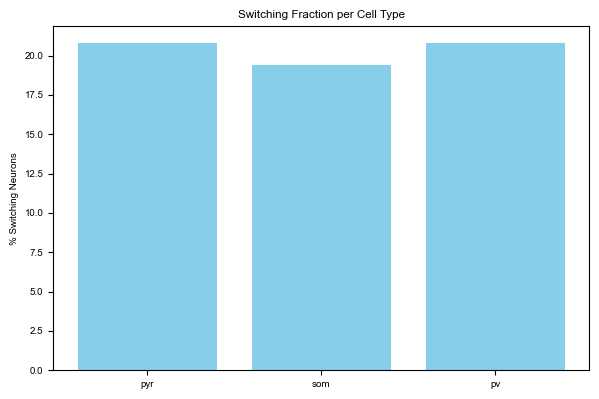

TypeError: unsupported operand type(s) for -: 'range' and 'int'

In [14]:
# For example, context1 = 'active', context2 = 'passive'
B_weights_act, _, _, _, coupling_indices, _, _, start_indices = data_handler.aggregate_model_data_from_results(results_pre)
B_weights_pas, _, _, _, _, _, _, _ = data_handler.aggregate_model_data_from_results(results_pass)

switching_mask, signs_dict = identify_switching_neurons(
    [B_weights_act, B_weights_pas],
    coupling_indices,
    start_indices
)

plot_switching_fraction_by_celltype(celltype_array, switching_mask, cell_type_labels={0: 'pyr', 1: 'som', 2: 'pv'})


input_celltypes = (
    [0] * 3 +  # pyr
    [1] * 3  +  # som
    [2] * 3     # pv
)

plot_switching_predictor_sources(B_weights_act, np.arange(coupling_indices), switching_mask, input_celltypes, input_labels={0: 'pyr', 1: 'som', 2: 'pv'})



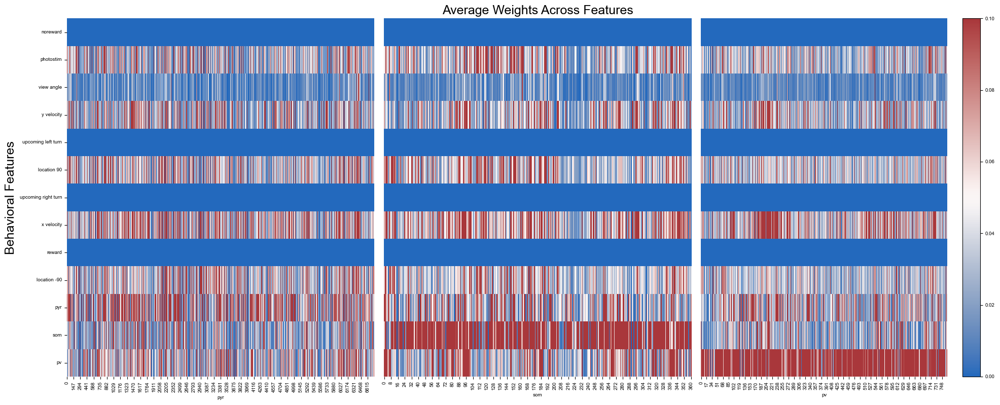

In [15]:
plotter.unique_features_heatmap_celltypes(max_beta_feature_unique,unique_feature_names,neuron_groups, minmax = (0, .1),model_type =model_types, no_abs=no_abs)
#max_beta_feature_unique, total_beta_feature_unique,mean_neuron_feature_unique

In [23]:
# Create an instance of AnalysisManager, passing in the plotter module
analysis_manager = analysisfun(data = None, plotter=plotter)

HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30


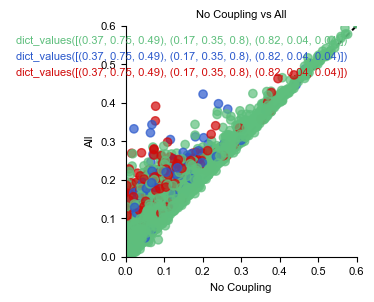

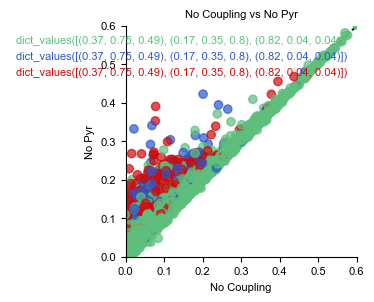

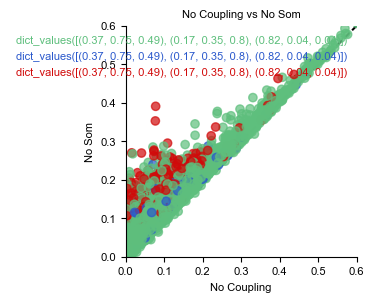

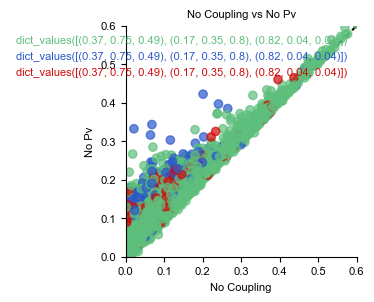

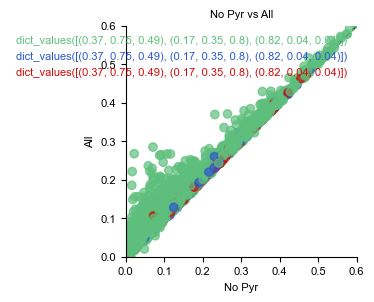

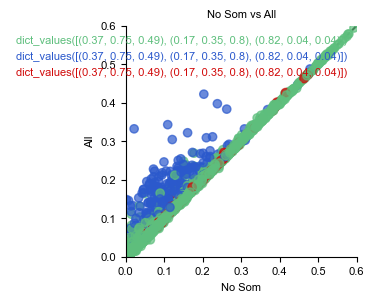

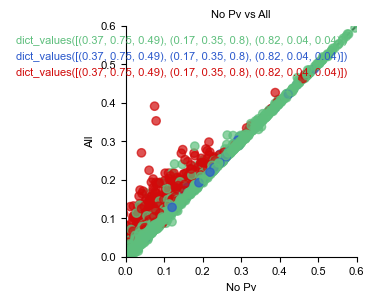

Outliers: (array([   0,    3,   10, ..., 7881, 7882, 7884], dtype=int64),)
Percent of cells that are outliers!: 0.34153455928979076


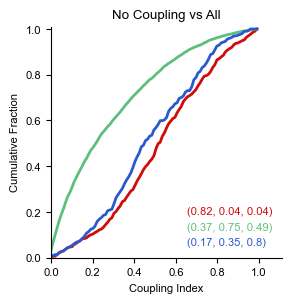

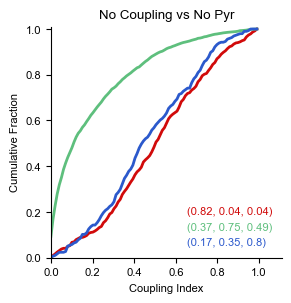

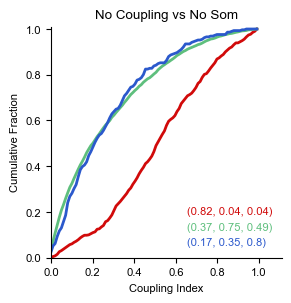

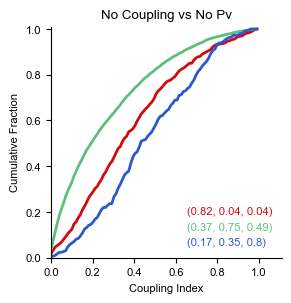

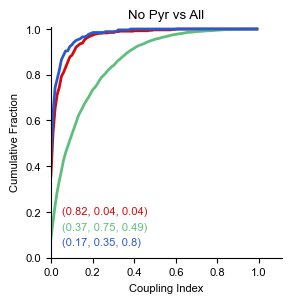

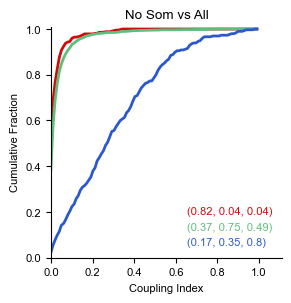

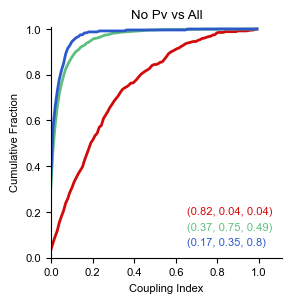

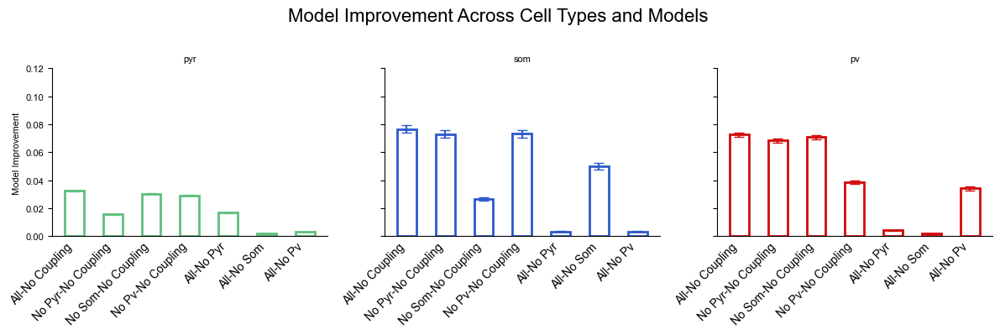

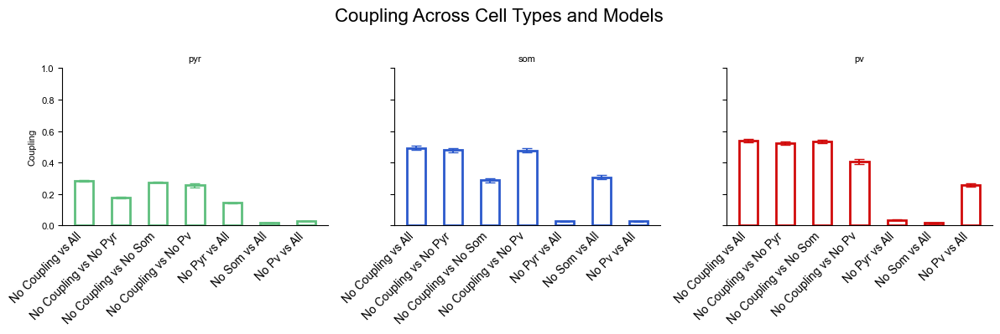

In [13]:
# PLOT EXAMPLE COUPLING INDICES FOR EXAMPLE RESULTS

# Aggregate model data
combined_B_weights, feature_names, other_weights, coupling_weights, coupling_indices,celltype_array, neuron_groups, start_indices = data_handler.aggregate_model_data_from_results(results, no_abs)

# plot scatter of coupling partial vs full model
analysis_manager.generate_scatter_plots(results, model_types)

# Example usage:
coupling_index_dir, model_improvement = analysis_manager.plot_coupling_index_across_datasets(results, model_types)

#PLOT Model improvement or coupling index across models!
#coupling_index_dir/ model_improvement

    
# Plot Model Improvement
save_string_improvement = f'bar_celltypes_model_diff_{model_types}.png'
plotter.bar_plot_separated(model_improvement, neuron_groups, measure_string='Model Improvement', save_path=save_string_improvement, minmax=(0,0.12))

# Plot Coupling Index
save_string_coupling = f'bar_celltypes_coupling_{model_types}.png'
plotter.bar_plot_separated(coupling_index_dir, neuron_groups, measure_string='Coupling', save_path=save_string_coupling, minmax=(0,1))

In [46]:
np.where(np.array(coupling_index_by_celltype[('No Coupling','All')]['pyr']['Passive']) >  0.05)[0].shape #size of all neurons in that group

(801,)

model type: Active, original length, 7885
model type: Active ITI, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Active ITI, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Active ITI, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Active ITI, original length, 7885
model type: Passive, original length, 7885
Recalculating coupling index using neurons present across all comparisons and models...
Cell Type: pyr, Number of common non-NaN neurons across all comparisons and models: 897
Cell Type: som, Number of common non-NaN neurons across all comparisons and models: 152
Cell Type: pv, Number of common non-NaN neurons across all comparisons and models: 309

PYR Cell Type: No Coupling vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs 

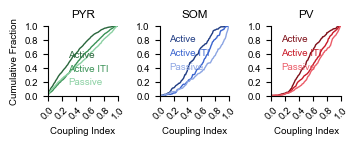


PYR Cell Type: No Pyr vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pyr vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pyr vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Active ITI, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Active ITI, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Active ITI, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


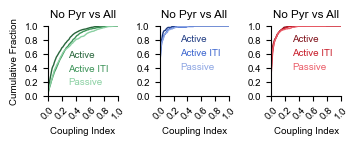


PYR Cell Type: No Som vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Som vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Som vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Active ITI, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Active ITI, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Active ITI, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


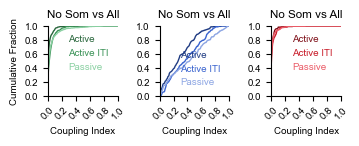


PYR Cell Type: No Pv vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pv vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pv vs All
Model Active vs Active ITI:
Observed Difference: nan, P-value: 0.0002
Model Active ITI vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Active ITI, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Active ITI, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Active ITI, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


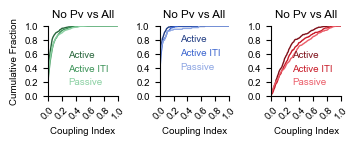

In [27]:
# NOW MAKE MODEL COMPARISONS!! Assuming you have three results dictionaries for each model

color_map_dict = {('pyr', 'Active'): '#29663C', ('pyr', 'Active ITI'): '#3A9256', ('pyr', 'Passive'): '#8AD0A2',
                   ('som', 'Active'): '#203C83', ('som', 'Active ITI'): '#3A64CF', ('som', 'Passive'): '#8CA5E3', 
                   ('pv', 'Active'): '#7F1019', ('pv', 'Active ITI'): '#C81927', ('pv', 'Passive'): '#EB5C68'}

# MAKE NEW INSTANCE OF PLOTTER AND ANALYSIS
plotter_context = plotterfun(data = None,celltypecolors=colors_dict, save_results= save_results, color_map_dict =  color_map_dict)
analysis_manager = analysisfun(data = None, plotter=plotter_context)

results_list = [results_pre,results_iti, results_pass]#[results_pre, results_pass]#[results_pre, results_iti, results_pass] # [updated_results_pre, updated_results_iti, updated_results_pass]
model_types = ['Active', 'Active ITI', 'Passive'] #['Active Task', 'Active ITI', 'Passive']

comparisons = [('No Coupling','All'),
        ('No Pyr','All'),
        ('No Som','All'),
        ('No Pv','All')]

coupling_index_by_celltype,_ = analysis_manager.plot_coupling_index_across_celltypes_cdf(results_list, 
         model_types, comparisons=comparisons,recalculate_modulation= True, figsize = (3*1.2,1.2*1.5)) #figsize = (3*1.3,1.3*1.5)

model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
model type: Active, original length, 7885
model type: Passive, original length, 7885
Recalculating coupling index using neurons present across all comparisons and models...
Cell Type: pyr, Number of common non-NaN neurons across all comparisons and models: 1281
Cell Type: som, Number of common non-NaN neurons across all comparisons and models: 175
Cell Type: pv, Number of common non-NaN neurons across all comparisons and models: 349

PYR Cell Type: No Coupling vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Coupling vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Coupling vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


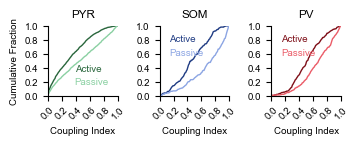


PYR Cell Type: No Pyr vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pyr vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pyr vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


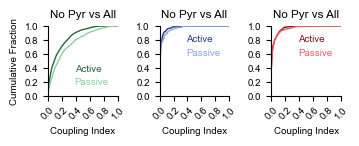


PYR Cell Type: No Som vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Som vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Som vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


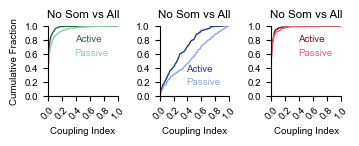


PYR Cell Type: No Pv vs All


c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\scipy\stats\_resampling.py:1114: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

SOM Cell Type: No Pv vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002

PV Cell Type: No Pv vs All
Model Active vs Passive:
Observed Difference: nan, P-value: 0.0002
model type: Active, pyr,6760, original length, 7885
model type: Passive, pyr,6760, original length, 7885
model type: Active, som,361, original length, 7885
model type: Passive, som,361, original length, 7885
model type: Active, pv,764, original length, 7885
model type: Passive, pv,764, original length, 7885


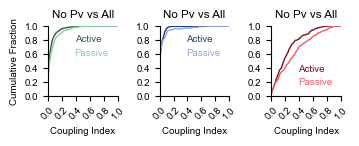

In [12]:
# NOW MAKE MODEL COMPARISONS!! Assuming you have three results dictionaries for each model

color_map_dict = {('pyr', 'Active'): '#29663C', ('pyr', 'Active ITI'): '#3A9256', ('pyr', 'Passive'): '#8AD0A2',
                   ('som', 'Active'): '#203C83', ('som', 'Active ITI'): '#3A64CF', ('som', 'Passive'): '#8CA5E3', 
                   ('pv', 'Active'): '#7F1019', ('pv', 'Active ITI'): '#C81927', ('pv', 'Passive'): '#EB5C68'}

# MAKE NEW INSTANCE OF PLOTTER AND ANALYSIS
plotter_context = plotterfun(data = None,celltypecolors=colors_dict, save_results= save_results, color_map_dict =  color_map_dict)
analysis_manager = analysisfun(data = None, plotter=plotter_context)

results_list = [results_pre, results_pass]#[results_pre, results_pass]#[results_pre, results_iti, results_pass] # [updated_results_pre, updated_results_iti, updated_results_pass]
model_types = [ 'Active','Passive'] #['Active Task', 'Active ITI', 'Passive']

comparisons = [('No Coupling','All'),
        ('No Pyr','All'),
        ('No Som','All'),
        ('No Pv','All')]

coupling_index_by_celltype,_ = analysis_manager.plot_coupling_index_across_celltypes_cdf(results_list, 
         model_types, comparisons=comparisons,recalculate_modulation= True, figsize = (3*1.2,1.2*1.5)) #figsize = (3*1.3,1.3*1.5)


In [18]:
#find neurons that flip sign across models
# Assuming 'B_weights' is features x neurons
# and you've labeled the 3 predictors per cell type per dataset
signs = sign(B_weights(coupling_idx, neuron_idx));  # [3x1] per type

# flip_sign_neurons = analysis_manager.find_flipping_sign_neurons(results_list, model_types, neuron_groups)
# # Plot the flipping sign neurons
# plotter_context.plot_flipping_sign_neurons(flip_sign_neurons, neuron_groups, model_types, save_path='flipping_sign_neurons.png')


NameError: name 'sign' is not defined

In [12]:
#Count to make sure neurons are the same across contexts
first_key = ('No Coupling', 'All')
# Loop through all cell types (second key)
for cell_type in coupling_index_by_celltype[first_key].keys():
    # Loop through all comparisons (last key)
    for comparison in coupling_index_by_celltype[first_key][cell_type].keys():
        # Extract the relevant array
        neurons_data = coupling_index_by_celltype[first_key][cell_type][comparison]
        # Count the number of non-NaN values
        non_nan_count = np.sum(~np.isnan(neurons_data))
        # Print the result
        print(f"Cell Type: {cell_type}, Comparison: {comparison}, Number of non-NaN neurons: {non_nan_count}")

NameError: name 'coupling_index_by_celltype' is not defined

('No Pyr', 'All') - pyr: Passive vs Active Wilcoxon p-value: 0.00000
('No Pyr', 'All') - som: Passive vs Active Wilcoxon p-value: 0.52673
('No Pyr', 'All') - pv: Passive vs Active Wilcoxon p-value: 0.99999
Bonferroni corrected alpha threshold: 0.01667
0.06258993479547703
('No Som', 'All') - pyr: Passive vs Active Wilcoxon p-value: 0.92244
('No Som', 'All') - som: Passive vs Active Wilcoxon p-value: 0.00000
('No Som', 'All') - pv: Passive vs Active Wilcoxon p-value: 0.99987
Bonferroni corrected alpha threshold: 0.01667
0.1445629027311745
('No Pv', 'All') - pyr: Passive vs Active Wilcoxon p-value: 1.00000
('No Pv', 'All') - som: Passive vs Active Wilcoxon p-value: 0.99998
('No Pv', 'All') - pv: Passive vs Active Wilcoxon p-value: 0.00000
Bonferroni corrected alpha threshold: 0.01667
0.07700508203672726
Comparison ('No Pyr', 'All'), cell type pyr, neurons used: 1281
cell_type pyr, 0.15565554621487732,0.21824548101035432
Comparison ('No Som', 'All'), cell type pyr, neurons used: 1281
cell_

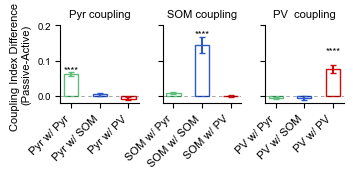

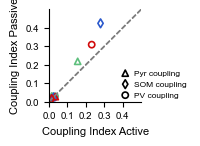

In [26]:
# COMPARE COUPLING ACROSS CONTEXTS
model_pairs = [('Passive','Active')] #more coupled, less coupled

comparisons_ = [('No Pyr','All'),
        ('No Som','All'),
        ('No Pv','All')]


# Generate x labels for plot!
cell_types_first_half = ['Pyr', 'SOM', 'PV']  #['Pyr coupling', 'SOM coupling', 'PV coupling']  # The first half (with 'w')
cell_types_second_half = ['Pyr', 'SOM', 'PV']  # The second half (without 'w')


xlabels = plotter.generate_xlabels(cell_types_first_half, cell_types_second_half,connector='w/')

# Call the function with the defined model pairs
analysis_manager.bar_plot_separated_coupling_index_diff(coupling_index_by_celltype, comparisons_, model_pairs, celltypecolors,
                                        'Coupling Index Difference \n(Passive-Active)', #'Coupling Index Difference (P-A)', #'Coupling Index Difference \n(Passive-Active)'
                                        bar_width=0.1,minmax = (-.02,0.2), xaxislabel = xlabels,save_path=save_results, figsize=(3*1.2,1.2*1.5))

markerstyles = ['^','d','o'] #['*','^','d','o']
model_pairs = [('Active','Passive')] #more coupled, less coupled
analysis_manager.scatter_plot_separated_celltype_mean(coupling_index_by_celltype, model_pairs, 'Coupling Index', minmax = (0,.5),markerstyles = markerstyles,version = 2, comparisons = comparisons_, figsize=(1.2,1.2))

In [13]:
# Import path setup
from utils.path_utils import setup_paths
base_dir = setup_paths()
from utils.general_stats import GeneralStats
stats = GeneralStats()  # instantiate it

import matplotlib.pyplot as plt
from scipy.stats import wilcoxon

In [114]:
def bar_plot_separated_coupling_index_diff_test(coupling_index_by_celltype, comparisons, model_pairs, colors, measure_string, bar_width=0.5, save_path=None, minmax=(0, 0.1), xaxislabel = None, figsize = (3*1.3,1.3*1.5)):
        """
        Create a bar plot with error bars to compare coupling index differences across cell types within each comparison.

        Parameters:
        coupling_index_by_celltype: dict
            A nested dictionary where outer keys are comparisons, second-level keys are cell types, and inner keys are model types, with values as the coupling index.
        comparisons: list
            A list of comparisons to include in the plot.
        model_pairs: list of tuples
            A list of tuples where each tuple contains two model types to compare (e.g., [('Model_Pre', 'Model_ITI'), ...]).
        colors: dict
            A dictionary where keys are cell types and values are colors for the bars.
        measure_string: str
            The label for the y-axis.
        bar_width: float
            The width of the bars in the plot.
        save_path: str, optional
            The path to save the plot. If None, the plot is displayed instead of saved.
        minmax: tuple
            Tuple specifying the y-axis limits (min, max).
        """
        # For collecting all p-values for Bonferroni correction
        all_p_values = []

        # Set global font size and family 
        plt.rcParams.update({'font.size': 8, 'font.family': 'arial'})

        # Create a figure with subplots, one for each comparison
        fig, axs = plt.subplots(1, len(comparisons), figsize=figsize, sharey=True) #(3, 1) #1.26 is the actual ratio but have to increase to account for labels
        
        # Iterate over comparisons to create each subplot
        for i, comparison in enumerate(comparisons):
            ax = axs[i]  # Select the subplot
            all_pos = []
            bar_heights_al = []
            # Iterate over each cell type in the current comparison
            for j, (cell_type, cell_data) in enumerate(coupling_index_by_celltype[comparison].items()):
                # Calculate positions for each model comparison along the x-axis
                positions = np.arange(len(model_pairs)) + 1 + j * (bar_width + 0.1)
                all_pos.append(positions)
                means = []
                errors = []
                
                # Iterate over each model comparison and compute differences
                for model1, model2 in model_pairs:
                    if model1 in cell_data and model2 in cell_data:
                        differences = np.array(cell_data[model1]) - np.array(cell_data[model2])
                        means.append(np.nanmean(differences))
                        errors.append(np.nanstd(differences) / np.sqrt(np.sum(~np.isnan(differences))))  # Standard error ignoring NaNs
                    else:
                        means.append(np.nan)
                        errors.append(np.nan)
                
                # Create bar plot with uncolored inside and colored outlines
                bars = ax.bar(positions, means, yerr=errors, capsize=2, 
                            edgecolor=colors[cell_type],
                            facecolor='white', linewidth=1, width=bar_width, ecolor=colors[cell_type])
                
                # Get heights of the current bars
                # Get heights of the current bars
                bar_heights = [bar.get_height() for bar in bars]
                bar_heights_al.append(bar_heights)

            # variables to store statistics
            all_stats_dict = {}
            comparisons_list = []
            test_stats = []

            # Statistical tests for differences from zero using Wilcoxon signed-rank test
            significance_stars = []
            for model1, model2 in model_pairs:
                p_values_for_this_comparison = []
                for cell_type, cell_data in coupling_index_by_celltype[comparison].items():
                    if model1 in cell_data and model2 in cell_data:
                        differences = np.array(cell_data[model1]) - np.array(cell_data[model2])
                        #Remove NaNs
                        differences = differences[~np.isnan(differences)]
                        if np.sum(~np.isnan(differences)) > 0:
                            # Perform Wilcoxon signed-rank test against zero
                            stat, p_value = wilcoxon(differences, alternative='greater')
                            p_values_for_this_comparison.append(p_value)
                            all_p_values.append(p_value)
                            print(f"{comparison} - {cell_type}: {model1} vs {model2} Wilcoxon p-value: {p_value:.5f}")

                            comparisons_list.append((f"{comparison}_{cell_type}_{model1}", f"{comparison}_{cell_type}_{model2}"))
                            test_stats.append(stat)

                            # Collect bar positions for drawing lines and stars

                            ## save stats for each comparison
                            # Suppose you have stats for several groups:
                            stats_dict = {
                                'group1': stats.get_basic_stats(cell_data[model1]),
                                'group2': stats.get_basic_stats(cell_data[model2]),
                                # etc.
                            }

                            # Save stats for each group
                            label1 = f"{comparison}_{cell_type}_{model1}"
                            label2 = f"{comparison}_{cell_type}_{model2}"
                            all_stats_dict[label1] = stats.get_basic_stats(cell_data[model1])
                            all_stats_dict[label2] = stats.get_basic_stats(cell_data[model2])

            # Clean the measure string for saving
            safe_measure_string = measure_string.replace('\n', ' ').replace('/', '-').strip()


            # After the plotting loop, save all stats to a table
            if save_path:
                df_stats = stats.basic_stats_to_table(all_stats_dict, save_path=f'{save_path}/basic_stats_{safe_measure_string}.csv')
                df_tests = stats.to_table(comparisons_list, test_stats, p_values_for_this_comparison, save_path=f'{save_path}/stat_tests_{safe_measure_string}.csv',type = 'wilcoxon signed-rank test against zero')
            else:
                df_stats = stats.basic_stats_to_table(all_stats_dict)
                df_tests = stats.to_table(comparisons_list, test_stats, p_values_for_this_comparison,type = 'wilcoxon signed-rank test against zero')

            if xaxislabel is None:
                ax.set_xticks(np.arange(len(model_pairs)) + 1 + bar_width)
                ax.set_xticklabels([f'{model1} - {model2}' for model1, model2 in model_pairs], rotation=45, ha='right', fontsize=8)
                ax.tick_params(axis='x', which='major', length=0)
                # Set labels and title for each subplot
                #ax.set_title(f'{comparison}', fontsize=14)
            else:
                # Use provided x-axis labels for each subplot
                if i < len(xaxislabel):  # Ensure there are enough labels for each comparison
                    ax.set_xticks(np.squeeze(all_pos))
                    ax.set_xticklabels(xaxislabel[i], rotation=45, ha='right', fontsize=8)
                    #ax.set_title(f'{comparison}', fontsize=14)
                    ax.set_title(f'{xaxislabel[i][0][:3]} coupling', fontsize=8)
                else:
                    ax.set_xticks(np.arange(len(model_pairs)) + 1 + bar_width)
                    ax.set_xticklabels([f'{model1} - {model2}' for model1, model2 in model_pairs], rotation=45, ha='right', fontsize=8)

            # Clean up the appearance
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            if i == 0:
                ax.set_ylabel(f'{measure_string}', fontsize=8)

            ax.set_ylim(minmax[0], minmax[1])
            if minmax[0] < 0:
                ax.axhline(0, color='black', linewidth=0.5, linestyle=(0, (5, 5)), alpha=0.5) #axes[0].axvline(x=182, linestyle='dashed', color='k', alpha=1)
            

            # Calculate Bonferroni significance
            corrected_p_values, significance_stars = stats.calculate_bonferroni_significance(p_values_for_this_comparison)

            # Draw significance lines and stars
            for idx, (p, star) in enumerate(zip(corrected_p_values, significance_stars)):
                if star != 'ns':
                    bottom, top = axs[0].get_ylim()
                    top = minmax[1] - 0.1
                    top = bar_heights_al[idx][0]
                    print(top)
                    y = top + (idx * 0.02)  # Adjust y-coordinate
                    # x1 = bar_positions[idx] - bar_width / 2
                    # x2 = bar_positions[idx] + bar_width / 2
                    x1 = all_pos[idx]
                    plotter.add_significance_line(axs[i], x1, y=y, significance=star)

            
        
        # Add a global title for the figure
        #fig.suptitle(f'{measure_string} Differences Across Comparisons and Cell Types', fontsize=16)
        
        # Adjust layout
        #plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.tight_layout()
        plt.subplots_adjust(wspace=0.3)

        #to save svg so that we can edit texts!
        new_rc_params = {'text.usetex': False,
        "svg.fonttype": 'none'
        }
        plt.rcParams.update(new_rc_params)


        # Save plot if save_path is provided
        if save_path: 
            os.chdir(save_path)
            plt.savefig(f'bar_diff_{model_pairs[0][0]}-{model_pairs[0][1]}_coupling_celltypesv1.pdf', bbox_inches='tight')


def scatter_plot_separated_celltype_mean_test(coupling_index_by_celltype, model_pairs, measure_string, minmax=(0, 0.1),markerstyles = "o",version = 1,comparisons=None, figsize = (1.5,1.5)):
        """
        Create a scatter plot comparing mean coupling indices between two models for each cell type.

        Parameters:
        coupling_index_by_celltype: dict
            A nested dictionary where outer keys are comparisons, second-level keys are cell types, and inner keys are model types, with values as the coupling index.
        cell_types: list
            A list of cell types to include in the plot.
        model_pairs: list of tuples
            A list of tuples where each tuple contains two model types to compare (e.g., [('Model_Pre', 'Model_ITI'), ...]).
        colors: dict
            A dictionary where keys are cell types and values are colors for the scatter points.
        measure_string: str
            The label for the axes.
        save_path: str, optional
            The path to save the plot. If None, the plot is displayed instead of saved.
        minmax: tuple
            Tuple specifying the axis limits (min, max) for both x and y axes.
        markerstyles: str or list
            Marker style(s) for different comparisons.
        version: int
            Version of the plot style (1 or 2).
        comparisons: list, optional
            List of specific comparisons to include. If None, all comparisons in `coupling_index_by_celltype` are used.

        """
        # Set global font size and family 
        plt.rcParams.update({'font.size': 8, 'font.family': 'arial'})

        # Use all comparisons if none are provided
        if comparisons is None:
            comparisons = list(coupling_index_by_celltype.keys())
        
        cell_types = plotter.celltypecolors.keys()
        colors = plotter.celltypecolors

        if version ==1: 
            # Create a figure with subplots, one for each cell type
            fig, axs = plt.subplots(1, len(cell_types), figsize=figsize, sharex=True, sharey=True) # figsize=(9, 3)
            # Iterate over cell types to create each subplot
            for i, cell_type in enumerate(cell_types):
                ax = axs[i]  # Select the subplot
                handles = []  # To store scatter plot handles for the legend
                labels = []  # To store labels for the legend
                
                # Iterate over each comparison in the current cell type
                for cmp,comparison in comparison in enumerate(comparisons):
                    cell_data = coupling_index_by_celltype[comparison][cell_type]
                    
                    # Iterate over each model comparison and compute mean coupling indices
                    for model1, model2 in model_pairs:
                        if model1 in cell_data and model2 in cell_data:
                            mean_model1 = np.nanmean(cell_data[model1])  # Mean across neurons for model1
                            mean_model2 = np.nanmean(cell_data[model2])  # Mean across neurons for model2

                            # Plot the mean of model1 on the x-axis vs. model2 on the y-axis
                            scatter = ax.scatter(mean_model1, mean_model2, color=colors[cell_type], alpha=0.7, s=20, label=f'{model1} vs {model2}', edgecolor='black', marker = markerstyles[cmp])

                            # # Clean up the appearance
                            ax.spines['top'].set_visible(False)
                            ax.spines['right'].set_visible(False)
                            ax.set_box_aspect(1)

                            # Store the handle and label for legend
                            handles.append(scatter)
                            labels.append(f'{comparison[1]}')
                
                # Set labels and title for each subplot
                ax.set_title(f'{cell_type}', fontsize=8)
                if i == 0:
                    ax.set_ylabel(f'{measure_string} {model2}', fontsize=8)
                ax.set_xlabel(f'{measure_string} {model1}', fontsize=8)
                ax.set_xlim(minmax[0], minmax[1])
                ax.set_ylim(minmax[0], minmax[1])

                # Add a 45-degree diagonal line to show where x = y
                ax.plot([minmax[0], minmax[1]], [minmax[0], minmax[1]], linestyle='--', color='gray', linewidth=1)

                
                # Add the legend for this subplot
                ax.legend(handles, labels, loc= (.7,0), fontsize=6, frameon=False,handletextpad=0.1) #'lower right'

                ticks = np.arange(minmax[0], minmax[1], 0.1)
                plt.xticks(ticks)
                plt.yticks(ticks)

                # Adjust layout
                plt.tight_layout(rect=[0, 0, 1, 0.95])
                plt.tight_layout(rect=[0, 0, .80, 1]) #rect=[0, 0, 1, 0.95]
        
        else:
            # Create a figure with subplots, one for each cell type
            fig, axs = plt.subplots(1, 1, figsize=figsize, sharex=True, sharey=True) #figsize(3, 3)
            #fig, axs = plt.subplots(1, 1, figsize=(10,10), sharex=True, sharey=True)
            
            for i, cell_type in enumerate(cell_types):
                ax = axs  # Select the subplot
                handles = []  # To store scatter plot handles for the legend
                labels = []  # To store labels for the legend
                
                # Iterate over each comparison in the current cell type
                for cmp, comparison in enumerate(comparisons):
                    cell_data = coupling_index_by_celltype[comparison][cell_type]
                    
                    # Iterate over each model comparison and compute mean coupling indices
                    for model1, model2 in model_pairs:
                        if model1 in cell_data and model2 in cell_data:
                            non_nan1 = ~np.isnan(cell_data[model1])
                            non_nan2 = ~np.isnan(cell_data[model2])
                            good_neurons = non_nan1 & non_nan2
                            print(f'Comparison {comparison}, cell type {cell_type}, neurons used: {np.sum(good_neurons)}')
                            
                            mean_model1 = np.nanmean(cell_data[model1])  # Mean across neurons for model1
                            mean_model2 = np.nanmean(cell_data[model2])  # Mean across neurons for model2

                            # Plot the mean of model1 on the x-axis vs. model2 on the y-axis
                            #scatter = ax.scatter(mean_model1, mean_model2, color=colors[cell_type], alpha=0.7, s=50, label=f'{model1} vs {model2}', edgecolor='black', marker = markerstyles[cmp])
                            scatter = ax.scatter(mean_model1, mean_model2,facecolors='none',  alpha=1, s=20, label=f'{model1} vs {model2}', edgecolor=colors[cell_type], marker = markerstyles[cmp], linewidths=1)
                            print(f'cell_type {cell_type}, {mean_model1},{mean_model2}')

                            # # Clean up the appearance
                            ax.spines['top'].set_visible(False)
                            ax.spines['right'].set_visible(False)
                            ax.set_box_aspect(1)

                            # Store the handle and label for legend
                            handles.append(scatter)
                            labels.append(f'{comparison[0]}')
                
                # Set labels and title for each subplot
                # ax.set_title(f'{cell_type}', fontsize=8)
                if i == 0:
                    ax.set_ylabel(f'{measure_string} {model2}', fontsize=8)
                ax.set_xlabel(f'{measure_string} {model1}', fontsize=8)
                ax.set_xlim(minmax[0], minmax[1])
                ax.set_ylim(minmax[0], minmax[1])

                # Add a 45-degree diagonal line to show where x = y
                ax.plot([minmax[0], minmax[1]], [minmax[0], minmax[1]], linestyle='--', color='gray', linewidth=1)

                ticks = np.arange(minmax[0], minmax[1], 0.1)
                plt.xticks(ticks)
                plt.yticks(ticks)

                # Add the legend for this subplot
                labels = ["Pyr coupling", "SOM coupling", "PV coupling"]
                # After the loop is done and you have `handles` and `labels`
                import copy
                legend_handles = []
                for h in handles:
                    h_copy = copy.copy(h)
                    h_copy.set_edgecolor('black')  # Make the legend symbol black
                    h_copy.set_facecolor('none')   # Keep it consistent with facecolors='none' used in plotting
                    legend_handles.append(h_copy)
                ax.legend(legend_handles, labels, loc=(.7, 0), fontsize=6, frameon=False, handletextpad=0.1, labelcolor='black')
                
                # ax.legend(handles, labels, loc= (.7,0), fontsize=8, frameon=False,handletextpad=0.1) #'lower right'

        # Add a global title for the figure
        # fig.suptitle(f'{measure_string} Comparison Across Cell Types', fontsize=8)
        

        #to save svg so that we can edit texts!
        new_rc_params = {'text.usetex': False,
        "svg.fonttype": 'none'
        }
        plt.rcParams.update(new_rc_params)

        

        # Save plot if save_path is provided
        if plotter.save_results: 
            os.chdir(plotter.save_results)
            plt.savefig(f'scatter_{model1}_vs_{model2}_coupling_celltypes_version{version}.pdf', bbox_inches='tight')
        
        plt.show()


('No Pyr', 'All') - pyr: Active vs Passive Wilcoxon p-value: 1.00000
('No Pyr', 'All') - som: Active vs Passive Wilcoxon p-value: 0.47327
('No Pyr', 'All') - pv: Active vs Passive Wilcoxon p-value: 0.00001
Bonferroni corrected alpha threshold: 0.01667
0.007188109500425988
('No Som', 'All') - pyr: Active vs Passive Wilcoxon p-value: 0.07756
('No Som', 'All') - som: Active vs Passive Wilcoxon p-value: 1.00000
('No Som', 'All') - pv: Active vs Passive Wilcoxon p-value: 0.00013
Bonferroni corrected alpha threshold: 0.01667
0.0007574080485557102
('No Pv', 'All') - pyr: Active vs Passive Wilcoxon p-value: 0.00000
('No Pv', 'All') - som: Active vs Passive Wilcoxon p-value: 0.00002
('No Pv', 'All') - pv: Active vs Passive Wilcoxon p-value: 1.00000
Bonferroni corrected alpha threshold: 0.01667
0.0044368397342998776
0.0051390420024328195
Comparison ('No Pyr', 'All'), cell type pyr, neurons used: 1281
cell_type pyr, 0.15565554621487732,0.21824548101035432
Comparison ('No Som', 'All'), cell type p

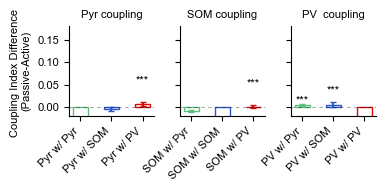

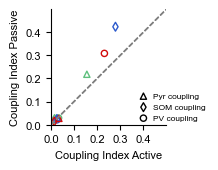

In [115]:
bar_plot_separated_coupling_index_diff_test(coupling_index_by_celltype, comparisons_, model_pairs, celltypecolors,
                                        'Coupling Index Difference \n(Passive-Active)', #'Coupling Index Difference \n(Passive-Active)'
                                        bar_width=0.1,minmax = (-.02,0.18), xaxislabel = xlabels,save_path=save_results)

markerstyles = ['^','d','o'] #['*','^','d','o']
model_pairs = [('Active','Passive')] #more coupled, less coupled
scatter_plot_separated_celltype_mean_test(coupling_index_by_celltype, model_pairs, 'Coupling Index', minmax = (0,.5),markerstyles = markerstyles,version = 2, comparisons = comparisons_)

In [142]:
response_type = 'diff_stim' #diff_stim, avg_ctrl_post, avg_ctrl_pre
dir1 = f'V:\Connie/results\opto_sound_2025\context\mod_index_specified_cells\differences_pre_post\dff\{response_type}.mat'
responder_type = 'sound_only_sig_cells'
dir2 = f'V:\Connie/results\opto_sound_2025\context\mod_index_specified_cells\differences_pre_post\dff\{responder_type}.mat' #sound_only_sig_cells, opto_only_sig_cells,opto_sound_sig_cells,unmodulated
import scipy
# Load specific modulation indices!!
mod_idx = scipy.io.loadmat(dir1)
mod_index = mod_idx[response_type]
sig_cels = scipy.io.loadmat(dir2)
sig_cells = sig_cels[responder_type][0]-1 #minus one bc of MATLAB indexing
sig_cells = sig_cells.T
context = 1 #active = 0, passive = 1
print(f'shape sig_cells: {sig_cells.shape}')  # Check the shape of sig_cells

# Load the condition_array_trials structure
mouse_dates_keys
mat_data = scipy.io.loadmat('V:\Connie/results\opto_sound_2025\context\mod_index_specified_cells\differences_pre_post\dff\info.mat')
info = mat_data['info'][0][0]
# Assuming your mouse_date structure is loaded as a numpy array
mouse_dates = [
    item[0].replace('\\', '_').replace('/', '_')  # Replace slashes with underscores for consistency
    for item in info['mouse_date'][0]
]
print(mouse_dates)

print(f'shape mod_index: {mod_index.shape}')  # Check the shape of mod_index
# Create an empty dictionary to store the significant neurons for each mouse_date
significant_neurons = {}
mod_index_neurons = {}
# Iterate over the mouse_dates and map to corresponding neurons in sig_cells by index
for idx, mouse_date in enumerate(mouse_dates):
    if idx < len(sig_cells):
        # Get the significant neurons for the current index
        significant_neurons_al = sig_cells[idx]
        print(f'{mouse_date}: {significant_neurons_al}')
        # Store the results in a dictionary with mouse_date as the key
        significant_neurons[mouse_date] = significant_neurons_al
        current_mod = mod_index[idx][context] #[0,significant_neurons_al[0]]
        mod_index_neurons[mouse_date] = current_mod[0,significant_neurons_al[0]]#current_mod[significant_neurons_al[0]] #[0,significant_neurons_al[0]]
    else:
        print(f"No significant neurons found for {mouse_date}")

# Now you have a dictionary mapping each dataset to its significant neurons

print(f'total significant neurons: {len(sig_cells)}')

shape sig_cells: (24,)
['HA11-1R_2023-05-05', 'HA11-1R_2023-04-13', 'HA2-1L_2023-04-12', 'HA2-1L_2023-05-05', 'HA1-00_2023-06-29', 'HA1-00_2023-08-28', 'HE4-1L1R_2023-08-21', 'HE4-1L1R_2023-08-24', 'HA10-1L_2023-04-10', 'HA10-1L_2023-04-17', 'HA10-1L_2023-04-12', 'HA11-1R_2023-04-07', 'HA11-1R_2023-05-01', 'HA11-1R_2023-05-02', 'HA2-1L_2023-04-28', 'HA2-1L_2023-05-01', 'HA1-00_2023-06-27', 'HA1-00_2023-07-07', 'HA1-00_2023-08-25', 'HE4-1L1R_2023-08-14', 'HE4-1L1R_2023-08-28', 'HE4-1L1R_2023-09-04', 'HE4-1L1R_2023-09-11', 'HA10-1L_2023-03-31', 'HE1-00_2023-05-30']
shape mod_index: (25, 2)
HA11-1R_2023-05-05: [[  0   5   7   8  28  34  44  45  48  50  54  63  65  67  80  81  82  83
   85  86  91  96  97  99 102 105 111 117 119 121 122 124 127 128 129 131
  133 134 137 138 139 140 142 145 151 153 158 163 166 167 172 178 189 190
  193 194 202 203 209 210 212 213 226 240 244 247 248 249 251 255 257 262
  266 268 275 277 278 282 287 288 290 297 298 299 301 302 303 313 315 316
  321 322 333 3

In [126]:
# Create an empty dictionary to store the significant neurons for each mouse_date
significant_neurons = {}
mod_index_neurons = {}
# Iterate over the mouse_dates and map to corresponding neurons in sig_cells by index
for idx, mouse_date in enumerate(mouse_dates):
    
    if idx < len(sig_cells):
        # Get the significant neurons for the current index
        significant_neurons_al = sig_cells[idx]
        # Store the results in a dictionary with mouse_date as the key
        significant_neurons[mouse_date] = significant_neurons_al
        current_mod = mod_index[idx][0]
        mod_index_neurons[mouse_date] = current_mod[0,significant_neurons_al[0]]
    else:
        print(f"No significant neurons found for {mouse_date}")

In [122]:
# TO PLOT MOD VS COUPLING INDEX!
def binnedhex_model_dev_comparison(mean_deviance1, mean_deviance2, cell_ids, measure_string, measure_string2, colors=None, plot_lims=None, save_path=None, plot_lims_neg=None, gridsize=30):
    """
    Create a binned hexagonal plot comparing deviance explained of partial vs full models.
    
    Parameters:
        mean_deviance1 (array_like): Deviance explained for full model.
        mean_deviance2 (array_like): Deviance explained for partial model.
        cell_ids (array_like): IDs of cells.
        measure_string (str): The label for the x-axis.
        measure_string2 (str): The label for the y-axis.
        colors (dict, optional): Dictionary of colors for each cell type. Keys should be cell types and values should be colors.
        plot_lims (optional): Limits for x and y axis.
        save_path (optional): Path to save the plot.
        gridsize (int, optional): The size of the bins in the hexagonal plot. Default is 30.

    Returns:
        None
    """
    # Set global font size and family 
    plt.rcParams.update({'font.size': 14, 'font.family': 'arial'})
    fig, ax = plt.subplots(1, 1, figsize=(3, 3))
    
    # Create a hexbin plot
    hb = ax.hexbin(mean_deviance2, mean_deviance1, gridsize=gridsize, cmap='Blues', mincnt=1)
    
    # Add a color bar
    cb = fig.colorbar(hb, ax=ax,fraction=0.046, pad=0.04)
    cb.set_label('Counts')
    
    # Draw unity line
    # max_dev = max(max(mean_deviance2), max(mean_deviance1))
    # ax.plot([0, max_dev], [0, max_dev], '--', color='black', zorder=1, label='Unity Line')
    
    # Set labels and title
    ax.set_xlabel(f'{measure_string}', fontsize=14)
    ax.set_ylabel(f'{measure_string2}', fontsize=14)
    # ax.set_title(f'{measure_string} vs {measure_string2}', fontsize=14)

    # Set equal limits for x and y axes
    if plot_lims:
        ax.set_xlim(0, plot_lims)
        ax.set_ylim(0, plot_lims)
    if plot_lims_neg:
        ax.set_xlim(plot_lims_neg, plot_lims)
        # ax.set_ylim(plot_lims_neg, plot_lims)
        ax.set_ylim(plot_lims_neg, 1)
    
    # Clean up the appearance
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_box_aspect(1)

    #to save svg so that we can edit texts!
    new_rc_params = {'text.usetex': False,
    "svg.fonttype": 'none'
    }
    plt.rcParams.update(new_rc_params)
    
    # Save plot if save_path is provided
    if save_path: 
        plt.savefig(save_path, bbox_inches='tight', format='svg')
    
    # Show plot
    plt.show()

def binned_model_dev_comparison(mean_deviance1, mean_deviance2, cell_ids, measure_string, measure_string2, colors=None, plot_lims=None, save_path=None, plot_lims_neg=None, num_bins=6):
    """
    Create a binned scatter plot comparing deviance explained of partial vs full models.
    
    Parameters:
        mean_deviance1 (array_like): Deviance explained for full model.
        mean_deviance2 (array_like): Deviance explained for partial model.
        cell_ids (array_like): IDs of cells.
        measure_string (str): The label for the x-axis.
        measure_string2 (str): The label for the y-axis.
        colors (dict, optional): Dictionary of colors for each cell type. Keys should be cell types and values should be colors.
        plot_lims (optional): Limits for x and y axis.
        save_path (optional): Path to save the plot.
        num_bins (int, optional): The number of bins to use for binning the data. Default is 20.

    Returns:
        None
    """
    # Set global font size and family 
    plt.rcParams.update({'font.size': 14, 'font.family': 'arial'})
    fig, ax = plt.subplots(1, 1, figsize=(3, 3))

    
    # Bin the data along the x-axis (mean_deviance2)
    bins = np.linspace(min(mean_deviance2), max(mean_deviance2), num_bins)
    print(bins)
    bin_means = []
    bin_means_x = []
    
    # For each bin, calculate the mean of y (mean_deviance1) for points in that bin
    for i in range(len(bins) - 1):
        bin_mask = (mean_deviance2 >= bins[i]) & (mean_deviance2 < bins[i + 1])
        bin_mean_y = np.mean(mean_deviance1[bin_mask]) if np.any(bin_mask) else np.nan
        bin_mean_x = np.mean(mean_deviance2[bin_mask]) if np.any(bin_mask) else np.nan
        bin_means.append(bin_mean_y)
        bin_means_x.append(bin_mean_x)
    
    # Remove NaN values (if any bins are empty)
    bin_means = np.array(bin_means)
    bin_means_x = np.array(bin_means_x)
    valid_bins = ~np.isnan(bin_means) & ~np.isnan(bin_means_x)
    bin_means = bin_means[valid_bins]
    bin_means_x = bin_means_x[valid_bins]
    
    # Plot the binned data
    ax.plot(bin_means_x, bin_means, marker='o', linestyle='-', color='black', label='Binned Data')
    
    # Draw unity line
    # max_dev = max(max(mean_deviance2), max(mean_deviance1))
    # ax.plot([0, max_dev], [0, max_dev], '--', color='black', zorder=1, label='Unity Line')
    
    # Set labels and title
    ax.set_xlabel(f'{measure_string}', fontsize=14)
    ax.set_ylabel(f'{measure_string2}', fontsize=14)
    #ax.set_title(f'{measure_string} vs {measure_string2}', fontsize=14)

    # Set equal limits for x and y axes
    if plot_lims:
        ax.set_xlim(0, plot_lims)
        ax.set_ylim(0, plot_lims)
    if plot_lims_neg:
        ax.set_xlim(plot_lims_neg, plot_lims)
        ax.set_ylim(plot_lims_neg, plot_lims)
    
    # Clean up the appearance
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_box_aspect(1)

    #to save svg so that we can edit texts!
    new_rc_params = {'text.usetex': False,
    "svg.fonttype": 'none'
    }
    plt.rcParams.update(new_rc_params)

    # Save plot if save_path is provided
    if save_path: 
        plt.savefig(f'{save_path}', bbox_inches='tight', format='svg')
    
    # Show plot
    plt.show()

def binned_model_dev_comparison_by_cell_type(mean_deviance1, mean_deviance2, cell_ids, measure_string, measure_string2, colors=None, plot_lims=None, save_path=None, plot_lims_neg=None, num_bins=6):
    """
    Create a binned scatter plot comparing deviance explained of partial vs full models, binned by cell type.
    
    Parameters:
        mean_deviance1 (array_like): Deviance explained for full model.
        mean_deviance2 (array_like): Deviance explained for partial model.
        cell_ids (array_like): IDs of cells.
        measure_string (str): The label for the x-axis.
        measure_string2 (str): The label for the y-axis.
        colors (dict, optional): Dictionary of colors for each cell type. Keys should be cell types and values should be colors.
        plot_lims (optional): Limits for x and y axis.
        save_path (optional): Path to save the plot.
        num_bins (int, optional): The number of bins to use for binning the data. Default is 20.

    Returns:
        None
    """

    # Set global font size and family 
    plt.rcParams.update({'font.size': 14, 'font.family': 'arial'})
    fig, ax = plt.subplots(1, 1, figsize=(3, 3))

    # Get unique cell types from cell_ids
    cell_types = np.unique(cell_ids)
    
    # Set up default colors if not provided
    if colors is None:
        colormap = plt.cm.plasma
        color_dict = {cell_type: colormap(i / len(cell_types)) for i, cell_type in enumerate(cell_types)}
    else:
        color_dict = colors
    
    # Bin the data and plot separately for each cell type
    for cell_type in cell_types:
        print(cell_type)
        # Select data for the current cell type
        type_mask = np.array(cell_ids) == cell_type
        type_deviance1 = mean_deviance1[type_mask]
        type_deviance2 = mean_deviance2[type_mask]
        

        # Handle NaNs by creating valid masks
        valid_mask = ~np.isnan(type_deviance1) & ~np.isnan(type_deviance2)
        type_deviance1 = type_deviance1[valid_mask]
        type_deviance2 = type_deviance2[valid_mask]

        # Skip this cell type if there's no valid data after removing NaNs
        if len(type_deviance1) == 0 or len(type_deviance2) == 0:
            print(f"Skipping cell type {cell_type} due to no valid data after removing NaNs")
            continue

        # Debugging: print out the first few elements of each array for this cell type

        # Bin the data along the x-axis (mean_deviance2)
        bins = np.linspace(min(type_deviance2), max(type_deviance2), max(2, num_bins))  # Ensure at least 2 bins
        num2test = .1
        bins = np.linspace(-1*(num2test),num2test, num_bins+1) # np.linspace(-1*(num2test),num2test, num_bins+1)
        print(f"Bins for cell type {cell_type}: {bins}")
        bin_means_y = []
        bin_means_x = []
        
        for i in range(len(bins) - 1):
            bin_mask = (type_deviance2 >= bins[i]) & (type_deviance2 < bins[i + 1])
            if np.any(bin_mask):
                bin_mean_y = np.mean(type_deviance1[bin_mask])
                bin_mean_x = np.mean(type_deviance2[bin_mask])
                bin_means_y.append(bin_mean_y)
                bin_means_x.append(bin_mean_x)

        # Convert lists to numpy arrays
        bin_means_y = np.array(bin_means_y)
        bin_means_x = np.array(bin_means_x)

        # Plot the binned data for the current cell type
        if len(bin_means_x) > 0 and len(bin_means_y) > 0:  # Only plot if data exists after binning
            ax.plot(bin_means_x, bin_means_y, marker='o', linestyle='-', color=color_dict[cell_type], label=f'{cell_type}')
        else:
            print(f"No valid bins for cell type {cell_type}")

    # Set labels and title
    ax.set_xlabel(f'{measure_string}', fontsize=14)
    ax.set_ylabel(f'{measure_string2}', fontsize=14)

    # Set equal limits for x and y axes
    if plot_lims:
        ax.set_xlim(0, plot_lims)
        ax.set_ylim(0, plot_lims)
    if plot_lims_neg:
        ax.set_xlim(plot_lims_neg, plot_lims)
        ax.set_ylim(plot_lims_neg, plot_lims)

    ax.set_xlim(-1*(num2test),num2test)
    ax.set_ylim(-1*(num2test),1)
    
    # Add a legend with colors corresponding to cell types
    ax.legend(frameon=False, loc='upper right')

    # Clean up the appearance
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_box_aspect(1)

    #to save svg so that we can edit texts!
    new_rc_params = {'text.usetex': False,
    "svg.fonttype": 'none'
    }
    plt.rcParams.update(new_rc_params)

    # Save plot if save_path is provided
    if save_path: 
        plt.savefig(f'{save_path}', bbox_inches='tight', format='svg')
    
    # Show plot
    plt.show() 



In [140]:
def threshold_modulation_index(mod_indices, full_data, partial_data,
                                lower_bound=None, upper_bound=None, abs_thresh=None):
    mod_indices_np = np.array(mod_indices, dtype=np.float64)
    # Create a boolean mask that starts with all True
    include_mask = np.ones_like(mod_indices_np, dtype=bool)
    # Apply lower bound
    if lower_bound is not None:
        include_mask &= mod_indices_np > lower_bound
    # Apply upper bound
    if upper_bound is not None:
        include_mask &= mod_indices_np < upper_bound
    # Apply absolute threshold (overrides previous if set)
    if abs_thresh is not None:
        include_mask = np.abs(mod_indices_np) < abs_thresh
    # Invert the mask to find outliers to be NaN'd
    mod_outliers = np.where(~include_mask)[0]
    print(f"Thresholding {len(mod_outliers)} cells based on ΔStim thresholds")
    # Apply thresholding
    for idx in mod_outliers:
        mod_indices[idx] = np.nan
        full_data[idx] = np.nan
        partial_data[idx] = np.nan
    return mod_indices, full_data, partial_data

from scipy.stats import ttest_ind
import numpy as np
def analyze_coupling_by_delta_stim_sign(mod_indices, coupling_index,threshold = 0, plot = True):
    """
    Compare coupling index between ΔStim < 0 (suppressed) and ΔStim > 0 (enhanced) neurons.
    Parameters:
        mod_indices (array-like): ΔStim modulation indices for each neuron.
        coupling_index (array-like): Coupling index values for each neuron.
    Returns:
        dict: Mean coupling for each group, t-test results, and sample sizes.
    """
    mod_indices = np.array(mod_indices)
    coupling_index = np.array(coupling_index)
    # Filter out NaNs
    valid = ~np.isnan(mod_indices) & ~np.isnan(coupling_index)
    mod_indices = mod_indices[valid]
    coupling_index = coupling_index[valid]
    # Group based on sign of ΔStim
    suppressed = coupling_index[mod_indices < threshold]
    enhanced = coupling_index[mod_indices > threshold]
    # T-test
    t_stat, p_value = ttest_ind(suppressed, enhanced, equal_var=False)

    # Convert to numpy and filter NaNs
    coupling_values = np.array(coupling_index)
    delta_stim_values = np.array(mod_indices)
    valid_mask = ~np.isnan(coupling_values) & ~np.isnan(delta_stim_values)
    coupling_values = coupling_values[valid_mask]
    delta_stim_values = delta_stim_values[valid_mask]
    # Split by sign
    suppressed_mask = delta_stim_values < threshold
    enhanced_mask = delta_stim_values > threshold
    suppressed_coupling = coupling_values[suppressed_mask]
    enhanced_coupling = coupling_values[enhanced_mask]
    # Stats
    mean_suppressed = np.mean(suppressed_coupling)
    mean_enhanced = np.mean(enhanced_coupling)

    if plot:
        plt.figure(figsize=(6, 4))
        plt.hist(suppressed_coupling, bins=30, alpha=0.6, label=f'Suppressed (ΔStim < {threshold})', color='red')
        plt.hist(enhanced_coupling, bins=30, alpha=0.6, label=f'Enhanced (ΔStim > {threshold})', color='green')
        plt.axvline(mean_suppressed, color='red', linestyle='--')
        plt.axvline(mean_enhanced, color='green', linestyle='--')
        plt.title(f'Coupling Index by ΔStim Sign')
        plt.xlabel('Coupling Index')
        plt.ylabel('Count')
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {
        'mean_suppressed': np.mean(suppressed),
        'mean_enhanced': np.mean(enhanced),
        'n_suppressed': len(suppressed),
        'n_enhanced': len(enhanced),
        't_stat': t_stat,
        'p_value': p_value
    }

def generate_scatter_plots_v2(results, celltypecolors, save_results, model_type, significant_neurons=None, mod_index_neurons=None, abs = 0, measure_string = 'Sound Index', mod_index_threshold=None):
    # Initialize an empty dictionary to store the mean deviance explained values across all datasets
    mean_dev_dict = {
        'No Coupling': [],
        'All': [],
        'No Pyr': [],
        'No Som': [],
        'No Pv': []
    }
    
    # Initialize a list to store all cell labels and modulation indices
    cell_labels = []
    mod_indices = []

    
    # Loop over each dataset in the results dictionary
    for dataset_key, dataset in results.items():
        if dataset_key in mod_index_neurons.keys():
            print(dataset_key)
            # Determine the cell labels based on significant neurons if provided
            if significant_neurons and dataset_key in significant_neurons:
                cell_ids = significant_neurons[dataset_key][0]
            else:
                cell_ids = range(len(dataset['celltype_array']))  # Default to all cells

            # Append the data from each dataset to the corresponding list in mean_dev_dict
            mean_dev_dict['No Coupling'].extend(dataset['mean_dev_behav'][cell_ids])
            mean_dev_dict['All'].extend(dataset['mean_dev'][cell_ids])
            mean_dev_dict['No Pyr'].extend(dataset['mean_dev_no_pyr'][cell_ids])
            mean_dev_dict['No Som'].extend(dataset['mean_dev_no_som'][cell_ids])
            mean_dev_dict['No Pv'].extend(dataset['mean_dev_no_pv'][cell_ids])

            
            # Map cell IDs to cell types and add to the cell_labels list
            cell_types = {
                0: 'pyr',
                1: 'som',
                2: 'pv',
            }
            cell_labels.extend([cell_types[dataset['celltype_array'][i]] for i in cell_ids])
            
            # Append modulation indices if provided
            mod_indices.extend(mod_index_neurons[dataset_key])
            
            # if mod_index_neurons and dataset_key in mod_index_neurons:
            #     mod_indices.extend(mod_index_neurons[dataset_key])
            # else:
            #     mod_indices.extend([None] * len(cell_ids))  # Use None if no modulation index available

            outlier_indices_all = np.where(np.array(mean_dev_dict['All']) < 0.05)
            num_cells = np.shape(mean_dev_dict['All'])[0]
            print(f"Outliers: {outlier_indices_all}")
            print(f"Percent of cells that are outliers!: {outlier_indices_all[0].size / num_cells}")
            
            # Create scatter plots and calculate coupling index for each comparison
            

            # Convert to np.float64
            full_data = np.array(mean_dev_dict['All']).astype(np.float64)
            partial_data = np.array(mean_dev_dict['No Coupling']).astype(np.float64)

            # NaN outlier indices
            full_data[outlier_indices_all] = np.nan
            partial_data[outlier_indices_all] = np.nan
            print(outlier_indices_all)
            for idx in outlier_indices_all[0]:
                mod_indices[idx] = np.nan

            mod_indices, full_data, partial_data = threshold_modulation_index(
                mod_indices,
                full_data,
                partial_data,
                lower_bound = None,      # optional: include only ΔStim > -0.2
                upper_bound = mod_index_threshold,       # optional: include only ΔStim < 0.2
                abs_thresh = None        # optional: override and use |ΔStim| < threshold
            )

            # # Threshold modulation index 
            # if mod_index_threshold is not None:
            #     mod_indices_np = np.array(mod_indices, dtype=np.float64)
            #     mod_outliers = np.where(np.abs(mod_indices_np) < mod_index_threshold)[0]
            #     print(f"Thresholding {len(mod_outliers)} cells with ΔStim < {mod_index_threshold}")
            #     for idx in mod_outliers:
            #         mod_indices[idx] = np.nan
            #         full_data[idx] = np.nan
            #         partial_data[idx] = np.nan

            # Calculate coupling index
            coupling_index = analysis_manager.calculate_coupling_index(full_data, partial_data)
    
    print(f"length mod {len(mod_indices)} , length coupling {len(mean_dev_dict['All'])}")
    # Change directory to the results folder
    os.chdir(save_results)
    
    # List of comparisons
    comparisons = [
        ('No Coupling', 'All'),
        ('No Coupling', 'No Pyr'),
        ('No Coupling', 'No Som'),
        ('No Coupling', 'No Pv'),
        ('No Pyr', 'All'),
        ('No Som', 'All'),
        ('No Pv', 'All')
    ]
    
    # Now, plot coupling vs modulation index
    if mod_index_neurons:
        coupling_values = coupling_index #mean_dev_dict['All'] 
        if abs:
            modulation_index = np.abs(mod_indices)
        else:
            modulation_index = mod_indices
        
        
        # Plot the coupling vs modulation index
        save_string = f'coupling_vs_mod_index_{model_type}.png'
        save_string = f'coupling_vs_mod_index_{model_type}.pdf'
        #save_string = f'coupling_vs_mod_index_{model_type}.svg'

        label2 = 'Coupling Index'
        label1 = measure_string
        
        plotter.scatter_model_dev_comparison(coupling_values, modulation_index, cell_labels, label1, label2, celltypecolors, 1, save_string,plot_lims_neg = -.5)
        # from scipy.stats import pearsonr
        # r, p = pearsonr(coupling_values, modulation_index)
        # print(f'Pearson r = {r:.2f}, p = {p:.4f}')

        # m, b = np.polyfit(coupling_values, modulation_index, 1)
        # ax.plot(coupling_values, m * coupling_values + b, color='gray', linestyle='--')

        # import numpy as np
        from scipy.stats import pearsonr

        # Convert to numpy arrays
        coupling_values = np.array(coupling_values)
        modulation_index = np.array(modulation_index)

        # Filter out NaNs from either array
        valid_mask = ~np.isnan(coupling_values) & ~np.isnan(modulation_index)
        coupling_clean = coupling_values[valid_mask]
        mod_index_clean = modulation_index[valid_mask]

        r, p = pearsonr(coupling_clean, mod_index_clean )
        print(f'Pearson r = {r:.2f}, p = {p:.4f}')

        # from scipy.stats import zscore
        # coupling_values = zscore(coupling_clean)
        # modulation_index = zscore(mod_index_clean)
        # plotter.scatter_model_dev_comparison(coupling_values, modulation_index, cell_labels, label1, label2, celltypecolors, 5, save_string,plot_lims_neg = -2)
        



        binnedhex_model_dev_comparison(coupling_values, modulation_index, cell_labels, label1, label2, celltypecolors, .2, save_string, plot_lims_neg=-.2 )

        save_string = f'binned_coupling_vs_mod_index_pass_{model_type}.pdf'
        binned_model_dev_comparison_by_cell_type( coupling_values, modulation_index,cell_labels, label1, label2, celltypecolors, 1, save_string,num_bins=3, plot_lims_neg=-.5 ) #_by_cell_type


        result = analyze_coupling_by_delta_stim_sign(mod_indices, coupling_index, threshold = .05, plot = True)
        print(f"Suppressed mean: {result['mean_suppressed']:.3f}, n={result['n_suppressed']}")
        print(f"Enhanced mean: {result['mean_enhanced']:.3f}, n={result['n_enhanced']}")
        print(f"T-statistic: {result['t_stat']:.3f}, p-value: {result['p_value']:.4f}")

        #scatter_coupling_vs_modulation(coupling_values, modulation_index, cell_labels, celltypecolors, 0.6, save_string)


In [702]:
plotter.save_results

'W:\\Connie/results\\Bassi2025\\glm_coupling'

In [695]:
plotter.celltypecolors

{'pyr': (0.37, 0.75, 0.49), 'som': (0.17, 0.35, 0.8), 'pv': (0.82, 0.04, 0.04)}

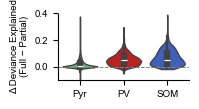

In [721]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
def plot_delta_deviance_violin_by_celltype(plotter,results_pre, lower_bound=-.2, upper_bound=1, figsize=(6, 4), save_path=None, save_string = ''):
    """
    Plots violin plots of delta deviance explained (Full - Partial) across cell types.
    Assumes:
        results_pre[dataset][f'mean_dev{model_type}_full']: full model deviance
        results_pre[dataset][f'mean_dev{model_type}_partial']: partial model deviance
        results_pre[dataset]['neuron_groups']: dict with cell type keys ('pyr', 'pv', 'som') and neuron indices
    """
    delta_devs_by_celltype = {'pyr': [], 'pv': [], 'som': []}
    for dataset in results_pre.keys():
        full_key = f'mean_dev'
        partial_key = f'mean_dev_behav'
        full_dev = results_pre[dataset][full_key]
        partial_dev = results_pre[dataset][partial_key]
        # Clean deviance values
        full_dev = np.clip(full_dev, lower_bound, upper_bound)
        partial_dev = np.clip(partial_dev, lower_bound, upper_bound)
        delta_dev = full_dev - partial_dev  # difference in deviance explained due to coupling
        neuron_groups = results_pre[dataset]['neuron_groups']
        for celltype in delta_devs_by_celltype.keys():
            if celltype in neuron_groups:
                indices = neuron_groups[celltype]
                vals = delta_dev[indices]
                vals = vals[~np.isnan(vals)]
                delta_devs_by_celltype[celltype].extend(vals)
    # Create violin plot
    celltype_order = ['pyr', 'pv', 'som']
    palette = [plotter.celltypecolors[ct] for ct in celltype_order]
    plt.figure(figsize=figsize)
    sns.violinplot(data=[delta_devs_by_celltype['pyr'],
                         delta_devs_by_celltype['pv'],
                         delta_devs_by_celltype['som']],
                   inner='box', cut=0, linewidth=1,
                   palette=palette)
    plt.xticks([0, 1, 2], ['Pyr', 'PV', 'SOM'])
    plt.ylabel("Δ Deviance Explained\n(Full − Partial)")
    # plt.title("Coupling Contribution by Cell Type")
    plt.axhline(0, color='gray', linestyle='--', linewidth=0.7)
    plt.ylim(-.1,.4) #set y limit
    sns.despine()
    plt.tight_layout()
    if save_path:
        os.makedirs(save_path, exist_ok=True)
        plt.savefig(f'{save_path}violin_dev_explained_diff_celltypes_{save_string}.pdf', dpi=300, bbox_inches='tight')
    plt.show()

plot_delta_deviance_violin_by_celltype(plotter,results_pass, lower_bound=-.2, upper_bound=1, figsize=(2, 1.1), save_path=f'{plotter.save_results}/supplement/',save_string = 'passive')


<>:17: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:17: SyntaxWarning: "is" with a literal. Did you mean "=="?
C:\Users\runyan1\AppData\Local\Temp\ipykernel_28568\665366558.py:17: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if model_ex is 'pre':


HA11-1R_2023-05-05
HA11-1R_2023-04-13
HA2-1L_2023-04-12
HA2-1L_2023-05-05
HA1-00_2023-06-29
HA1-00_2023-08-28
HE4-1L1R_2023-08-21
HE4-1L1R_2023-08-24
HA10-1L_2023-04-10
HA10-1L_2023-04-17
HA10-1L_2023-04-12
HA11-1R_2023-04-07
HA11-1R_2023-05-01
HA11-1R_2023-05-02
HA2-1L_2023-04-28
HA2-1L_2023-05-01
HA1-00_2023-06-27
HA1-00_2023-07-07
HA1-00_2023-08-25
HE4-1L1R_2023-08-14
HE4-1L1R_2023-08-28
HE4-1L1R_2023-09-04
HE4-1L1R_2023-09-11
HA10-1L_2023-03-31
HE1-00_2023-05-30
HA11-1R_2023-05-05
Outliers: (array([  0,   1,   5,   6,   8,   9,  10,  12,  13,  14,  15,  16,  18,
        19,  20,  22,  24,  25,  26,  28,  29,  30,  31,  34,  35,  36,
        39,  40,  41,  42,  43,  44,  45,  46,  49,  51,  52,  54,  55,
        57,  58,  59,  60,  61,  62,  63,  64,  66,  67,  68,  69,  70,
        71,  72,  73,  75,  77,  78,  79,  80,  82,  83,  84,  87,  90,
        91,  93,  94,  98,  99, 101, 102, 103], dtype=int64),)
Percent of cells that are outliers!: 0.7019230769230769
(array([  0,   1,   

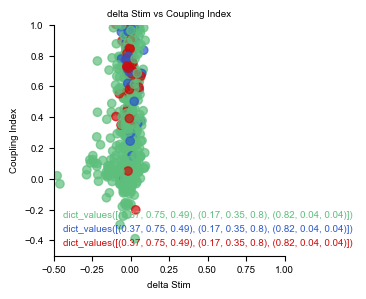

Pearson r = 0.21, p = 0.0000


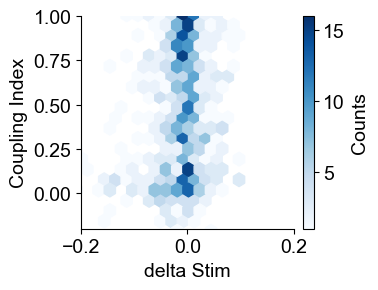

pv
Bins for cell type pv: [-0.1        -0.03333333  0.03333333  0.1       ]
pyr
Bins for cell type pyr: [-0.1        -0.03333333  0.03333333  0.1       ]
som
Bins for cell type som: [-0.1        -0.03333333  0.03333333  0.1       ]


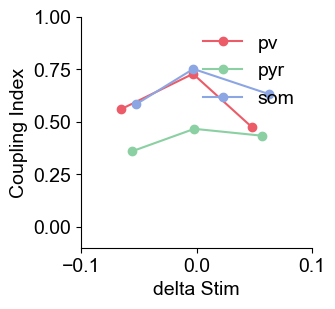

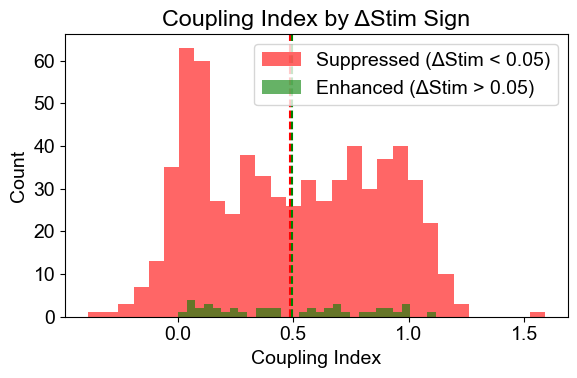

Suppressed mean: 0.485, n=665
Enhanced mean: 0.493, n=43
T-statistic: -0.150, p-value: 0.8817


In [143]:
if context == 0:
    results = results_pre
    model_types = 'GLM_3nmf_pre'
    model_ex = 'pre'
else:
    results = results_pass
    model_types = 'GLM_3nmf_pass'
    model_ex = 'pass'
save_path = 'W:\\Connie/results\\test'

# Aggregate model data
# Aggregate model data
combined_B_weights, feature_names, other_weights, coupling_weights, coupling_indices,celltype_array, neuron_groups, start_indices = data_handler.aggregate_model_data_from_results(results, no_abs, significant_neurons=significant_neurons)

# Example usage:
#generate_scatter_plots(results, celltypecolors, save_results, model_types, significant_neurons=significant_neurons)
if model_ex is 'pre':
    celltypecolors2 = {'pyr': '#29663C', 'som': '#203C83', 'pv': '#7F1019'}
else:
    celltypecolors2 = {'pyr': '#8AD0A2', 'som': '#8CA5E3', 'pv': '#EB5C68'}
    #color_map_dict = {('pyr', 'Active Task'): '#29663C', ('pyr', 'Active ITI'): '#3A9256', ('pyr', 'Passive'): '#8AD0A2', ('som', 'Active Task'): '#203C83', ('som', 'Active ITI'): '#3A64CF', ('som', 'Passive'): '#8CA5E3', ('pv', 'Active Task'): '#7F1019', ('pv', 'Active ITI'): '#C81927', ('pv', 'Passive'): '#EB5C68'}

# mod index vs coupling (all vs behav only)
generate_scatter_plots_v2(results, celltypecolors2, save_path, model_types, significant_neurons=significant_neurons,mod_index_neurons = mod_index_neurons, abs = 0, measure_string = 'delta Stim', mod_index_threshold = .1)

In [16]:
import scipy
#LOAD SPECIFIC NEURON IDs to plot their coupling
opto = 0
opto_dir = 'V:/Connie/results/opto_2024/context/mod' #'V:/Connie/results/passive/mod' #'V:/Connie/results/opto_2024/context/mod' #'V:/Connie/results/active/mod' #

sound_dir = 'V:\Connie/results\opto_2024\sfn24\mod'
act_dir = 'V:/Connie/results/passive/mod'

# Load the condition_array_trials structure
mat_data = scipy.io.loadmat(os.path.join(opto_dir,'info.mat'))
info = mat_data['info'][0][0]

# Assuming your mouse_date structure is loaded as a numpy array
mouse_dates = [
    item[0].replace('\\', '_').replace('/', '_')  # Replace slashes with underscores for consistency
    for item in info['mouse_date'][0]
]
print(mouse_dates)

if opto == 1:

    # Load specific modulation indices!!
    mod_idx = scipy.io.loadmat(os.path.join(opto_dir,'mod_indexm.mat'))
    mod_index = mod_idx['mod_indexm'][0] 
    sig_cels = scipy.io.loadmat(os.path.join(opto_dir,'sig_mod_boot_thr.mat'))
    sig_cells = sig_cels['sig_mod_boot_thr'][0]-1 #minus one bc of MATLAB indexing

    #highly modulated 
    # sig_cels = scipy.io.loadmat(os.path.join(opto_dir,'sig_mod_boot_thr05.mat'))
    # sig_cells = sig_cels['sig_mod_boot_thr05'][0]-1 #minus one bc of MATLAB indexing
else:

    mod_idx = scipy.io.loadmat(os.path.join(act_dir,'combined_mod_index.mat'))
    mod_index = mod_idx['combined_mod_index'][0] 
    sig_cels = scipy.io.loadmat(os.path.join(sound_dir,'combined_thres.mat'))
    sig_cells = sig_cels['combined_thres'][0]-1 #minus one bc of MATLAB indexing

    #highly modulated 
    sig_cels = scipy.io.loadmat(os.path.join(sound_dir,'sig_mod_boot_thr05.mat'))
    sig_cells = sig_cels['sig_mod_boot_thr05'][0]-1 #minus one bc of MATLAB indexing

    # sig_cels = scipy.io.loadmat(os.path.join(sound_dir,'sig_mod_boot_thrneg02.mat'))
    # sig_cells = sig_cels['sig_mod_boot_thrneg02'][0]-1 #minus one bc of MATLAB indexing

    # sig_cels = scipy.io.loadmat(os.path.join(sound_dir,'sig_mod_boot_thr01.mat'))
    # sig_cells = sig_cels['sig_mod_boot_thr01'][0]-1 #minus one bc of MATLAB indexing

# Create an empty dictionary to store the significant neurons for each mouse_date
significant_neurons = {}
mod_index_neurons = {}

# Iterate over the mouse_dates and map to corresponding neurons in sig_cells by index
for idx, mouse_date in enumerate(mouse_dates):
    if idx < len(sig_cells):
        # Get the significant neurons for the current index
        significant_neurons_al = sig_cells[idx]
        # Store the results in a dictionary with mouse_date as the key
        significant_neurons[mouse_date] = significant_neurons_al
        current_mod = mod_index[idx][0]
        # mod_index_neurons[mouse_date] = current_mod[significant_neurons_al[0]]
    else:
        print(f"No significant neurons found for {mouse_date}")

# Now you have a dictionary mapping each dataset to its significant neurons

print(f'total significant neurons: {len(sig_cells)}')

['HA11-1R_2023-05-05', 'HA11-1R_2023-04-13', 'HA2-1L_2023-04-12', 'HA2-1L_2023-05-05', 'HA1-00_2023-06-29', 'HA1-00_2023-08-28', 'HE4-1L1R_2023-08-21', 'HE4-1L1R_2023-08-24', 'HA10-1L_2023-04-10', 'HA10-1L_2023-04-17', 'HA10-1L_2023-04-12', 'HA11-1R_2023-04-07', 'HA11-1R_2023-05-01', 'HA11-1R_2023-05-02', 'HA2-1L_2023-04-28', 'HA2-1L_2023-05-01', 'HA1-00_2023-06-27', 'HA1-00_2023-07-07', 'HA1-00_2023-08-25', 'HE4-1L1R_2023-08-14', 'HE4-1L1R_2023-08-28', 'HE4-1L1R_2023-09-04', 'HE4-1L1R_2023-09-11', 'HA10-1L_2023-03-31', 'HE1-00_2023-05-30']
No significant neurons found for HE1-00_2023-05-30
total significant neurons: 24


In [54]:
#LOAD SOUND INFO NEURONS!!
import scipy
#LOAD SPECIFIC NEURON IDs to plot their weights
file_path = r'V:\Connie\results\opto_sound_2025\context\selectivity_pools\sounds\prepost_ctrl\union\all_modulated\selectivity_pool_results.mat'
sel_results = scipy.io.loadmat(file_path)
sel_pool_results = sel_results['selectivity_pool_results']

pool_num = 1 #0 is positive, 1 is negative, 2 is both
# Extract the relevant data from the loaded structure
relative_indices = sel_pool_results[0,0][0,0][pool_num]['both']['nonsel']['relative_cell_indices']
dataset_ids = sel_pool_results[0][pool_num]['both']['nonsel']['datasets_ids']

# Create an empty dictionary to store the significant neurons for each mouse_date
significant_neurons_mod = {}
# Iterate over the mouse_dates and map to corresponding neurons in sig_cells by index
for idx, mouse_date in enumerate(mouse_dates):
    if idx < len(sig_cells):
        # Get the significant neurons for the current index
        significant_neurons_al = sig_cells[idx][0]
        print(f"Mouse date: {mouse_date}, Significant neurons: {significant_neurons_al}")   
        # Store the results in a dictionary with mouse_date as the key
        significant_neurons_mod[mouse_date] = significant_neurons_al

    else:
        print(f"No significant neurons found for {mouse_date}")

# Now you have a dictionary mapping each dataset to its significant neurons

print(f'total significant neurons: {len(sig_cells)}')

ValueError: no field of name both

In [132]:
# sel_pool_results[0,0][0,0][2][0][0][0][0][0][0].shape
sel_pool_results[0,0][0,0][2][0][0][0][0][0][0].shape

sel_pool_results[0,1]['both'][0,0]['nonsel'][0,0]['relative_cell_indices'][0,0]


array([[  6],
       [  8],
       [ 49],
       [ 68],
       [ 81],
       [112],
       [125],
       [134],
       [139],
       [141],
       [168],
       [190],
       [195],
       [203],
       [210],
       [211],
       [267],
       [283],
       [289],
       [299],
       [300],
       [302],
       [323],
       [361],
       [ 38],
       [ 40],
       [ 52],
       [ 61],
       [ 76],
       [ 79],
       [ 88],
       [100],
       [112],
       [132],
       [135],
       [140],
       [151],
       [155],
       [166],
       [189],
       [190],
       [196],
       [198],
       [199],
       [215],
       [241],
       [256],
       [261],
       [268],
       [269],
       [343],
       [344],
       [351],
       [357],
       [379],
       [ 15],
       [ 29],
       [ 60],
       [ 72],
       [ 76],
       [ 93],
       [117],
       [122],
       [130],
       [136],
       [145],
       [157],
       [166],
       [171],
       [191],
       [192],
      

In [78]:
import scipy.io
import numpy as np

# Load the MATLAB file
file_path = r'V:\Connie\results\opto_sound_2025\context\selectivity_pools\sounds\prepost_ctrl\union\all_modulated\selectivity_pool_results.mat'
sel_results = scipy.io.loadmat(file_path)

def extract_pool_data(sel_pool_results,context='both',selectivity = 'nonsel', pool_num=2):
    """
    Extract data from nested MATLAB structure.
    
    Parameters:
    -----------
    sel_pool_results : numpy.ndarray
        Loaded MATLAB structure
    pool_num : int
        Pool number to extract (default: 2)
        
    Returns:
    --------
    dict
        Organized data from the pool
    """
    # Navigate to the specific pool
    # sel_pool_results[0,1]['both'][0,0]['nonsel'][0,0]['relative_cell_indices'][0,0]
    pool = sel_pool_results[0,pool_num][context][0,0] #sel_pool_results[0,0][0,0][pool_num]
    
    # Extract the nonselective neuron data
    nonsel_data = pool[selectivity][0,0]
    
    # Create organized dictionary
    data = {
        'relative_indices': nonsel_data['relative_cell_indices'][0,0].flatten(),
        'dataset_ids': nonsel_data['dataset_ids'][0,0].flatten(),
        'active_left_mod': nonsel_data['active_left_mod'][0,0].flatten(),
        'active_right_mod': nonsel_data['active_right_mod'][0,0].flatten(),
        'passive_left_mod': nonsel_data['passive_left_mod'][0,0].flatten(),
        'passive_right_mod': nonsel_data['passive_right_mod'][0,0].flatten()
    }
    
    return data

# Extract data from pool
pool_data = extract_pool_data(sel_pool_results,pool_num=1)

# Print verification
print("Data summary:")
print(f"Number of neurons: {len(pool_data['relative_indices'])}")
print(f"Unique datasets: {np.unique(pool_data['dataset_ids'])}")

# Load the condition_array_trials structure
opto_dir = 'V:/Connie/results/opto_2024/context/mod'
mat_data = scipy.io.loadmat(os.path.join(opto_dir,'info.mat'))
info = mat_data['info'][0][0]

# Assuming your mouse_date structure is loaded as a numpy array
mouse_dates = [
    item[0].replace('\\', '_').replace('/', '_')  # Replace slashes with underscores for consistency
    for item in info['mouse_date'][0]
]
print(mouse_dates)

# Create dictionary of neurons by dataset
sel_by_dataset = {}
neurons_by_dataset = {}

for dataset_id in np.unique(pool_data['dataset_ids']):
    mask = pool_data['dataset_ids'] == dataset_id
    neurons_by_dataset[mouse_dates[dataset_id-1]] = pool_data['relative_indices'][mask] - 1,  # Convert to Python indexing
    sel_by_dataset[mouse_dates[dataset_id-1]] = {
        'relative_indices': pool_data['relative_indices'][mask] - 1,  # Convert to Python indexing
        'active_left_mod': pool_data['active_left_mod'][mask],
        'active_right_mod': pool_data['active_right_mod'][mask]
    }

NameError: name 'sel_pool_results' is not defined

In [134]:
print(neurons_by_dataset['HA11-1R_2023-05-05'])

(array([  5,   7,  48,  67,  80, 111, 124, 133, 138, 140, 167, 189, 194,
       202, 209, 210, 266, 282, 288, 298, 299, 301, 322, 360],
      dtype=uint16),)


(192, 24)
(192, 31)
(192, 42)
(192, 20)
(192, 19)
(192, 15)
(192, 54)
(192, 25)
(192, 84)
(192, 72)
(192, 52)
(192, 71)
(192, 22)
(192, 67)
(192, 22)
(192, 6)
(192, 14)
(192, 22)
(192, 19)
(192, 65)
(192, 50)
(192, 36)
(192, 17)
(192, 81)
(192, 43)
Final Shape of All Betas: (192, 973)


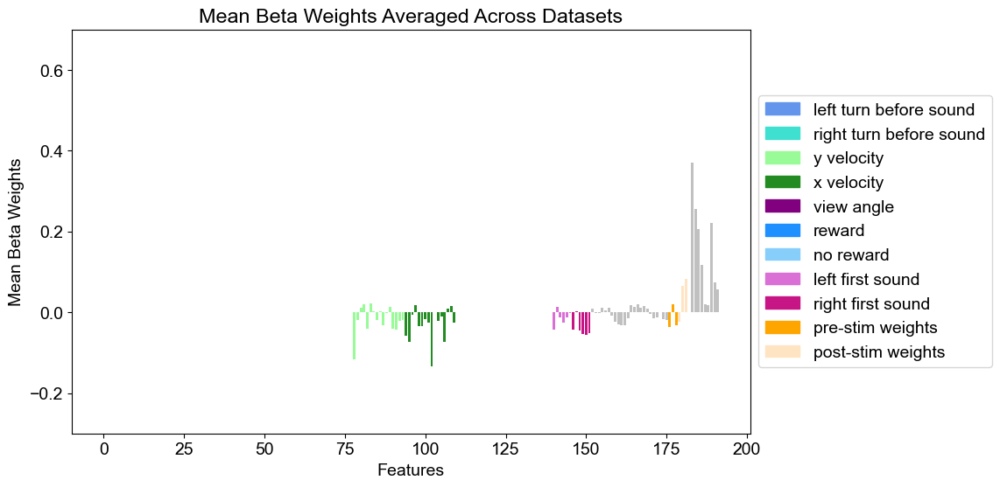

In [138]:
import matplotlib.pyplot as plt

significant_neurons = neurons_by_dataset 
# Placeholder for the highly modulated beta weights
highly_mod_betas = {}

# Placeholder for all beta weights across folds and datasets
all_betas = []

ex_model = results_pass

# Loop through the keys in ex_model and check for significant neurons
for key in significant_neurons.keys():
    if np.any(significant_neurons[key]):  # Only process if there are significant neurons
        betas_across_folds = []

        for fold in ex_model[key]['model_output_all'].keys():
            # Extract beta weights for significant neurons
            betas = ex_model[key]['model_output_all'][fold]['B_weights'][:, significant_neurons[key]]
            
            # Squeeze to remove unnecessary dimensions
            betas_squeezed = np.squeeze(betas)
            
            # If squeezing resulted in a 1D array, reshape it back to (192, 1)
            if betas_squeezed.ndim == 1:
                betas_squeezed = betas_squeezed.reshape(-1, 1)
            
            # Append to list of beta weights across folds
            betas_across_folds.append(betas_squeezed)

        # Stack beta weights across folds and compute the mean along the fold axis (axis=0)
        mean_betas = np.mean(np.stack(betas_across_folds, axis=0), axis=0)
        highly_mod_betas[key] = mean_betas
        print(np.shape(highly_mod_betas[key]))

        

        # # Append mean beta weights to the all_betas list
        # all_betas.append(mean_betas)
        # print(np.shape(all_betas))
        
        #concatenate or stack here after taking mean across folds so that I end up with array that has all predictors (192) x all neurons
    # all_betas = np.vstack((mean_betas))
    
# Now we need to create the all_betas array in the desired shape (192, num_neurons)
# Using a list to collect all means
all_betas = []

for mean_betas in highly_mod_betas.values():
    all_betas.append(mean_betas)  # Collect mean_betas directly

# Convert to a NumPy array and stack along the first axis (predictors)
all_betas = np.concatenate(all_betas, axis=1)  # (192, num_neurons)

# Print the final shape
print(f"Final Shape of All Betas: {np.shape(all_betas)}")   



# Check and reshape arrays before stacking if necessary

reshaped_betas = all_betas
# Stack beta weights across datasets and compute the overall mean
all_mean_betas = np.mean(reshaped_betas,axis=1)

# Create a color array for the bars
# colors = ['blue' if i < 176 or i > 178 else 'red' for i in range(all_mean_betas.shape[0])]

# Create a color array for the bars
colors = []
for i in range(all_mean_betas.shape[0]):
    if 0 <= i <= 5: #2 <= i <= 5:
        colors.append('cornflowerblue')  # left turn right before sound
    # if 6 <= i <= 38:
    #     colors.append('lightsteelblue')  # Highlight for weights 3-6 %left turn right before sound
    elif 39 <= i <= 44: #41 <= i <= 44:
        colors.append('turquoise')  # right turn right before sound
    # elif 45 <= i <= 77:
    #     colors.append('paleturquoise')  # right turn right aftter sound
    elif 78 <= i <= 93:
        colors.append('palegreen') # y velocity
    elif 94 <= i <= 109:
        colors.append('forestgreen') # x velocity
    elif 110 <= i <= 121:
        colors.append('purple') # view angle
    elif 122 <= i <= 129:
        colors.append('dodgerblue')  # reward
    elif 130 <= i <= 139:
        colors.append('lightskyblue')  # no reward
    elif 140 <= i <= 145:
        colors.append('orchid') #-90 first sound
    elif 146 <= i <= 151:
        colors.append('mediumvioletred') #90 first sound
    elif 176 <= i <= 178:
        colors.append('orange')  # pre-stim weights
    elif 179 <= i <= 182:
        colors.append('bisque')  # post-stim weights
    else:
        colors.append('silver')  # Default color

legend_labels = [
    'left turn before sound',
    # 'left turn right before sound',
    'right turn before sound',
    # 'right turn right after sound',
    'y velocity',
    'x velocity',
    'view angle',
    'reward',
    'no reward',
    '-90 first sound',
    '90 first sound',
    'pre-stim weights',
    'post-stim weights'
]

# Plot the mean beta weights with highlighted specific weights
plt.figure(figsize=(10, 6))
# plt.bar(range(mean_weights.shape[0]), mean_weights # Use the color array for the bars

plt.bar(range(len(all_mean_betas)), all_mean_betas, color=colors) 
plt.xlabel('Features')
plt.ylabel('Mean Beta Weights')
plt.title('Mean Beta Weights Averaged Across Datasets')

# Create legend handles with the correct unique colors
unique_colors = {
    'cornflowerblue': 'left turn before sound',
    'turquoise': 'right turn before sound',
    'palegreen': 'y velocity',
    'forestgreen': 'x velocity',
    'purple': 'view angle',
    'dodgerblue': 'reward',
    'lightskyblue': 'no reward',
    'orchid': 'left first sound',
    'mediumvioletred': 'right first sound',
    'orange': 'pre-stim weights',
    'bisque': 'post-stim weights'
}

# Create legend with only the unique colors and their labels
legend_handles = [plt.Rectangle((0, 0), 1, 1, color=color) for color in unique_colors.keys()]
legend_labels = list(unique_colors.values())

plt.legend(
    handles=legend_handles,
    labels=legend_labels,
    loc='center left',
    bbox_to_anchor=(1, 0.5)
)
plt.ylim(-.3, .7)

plt.show()



(192, 20)
(192, 11)
(192, 11)
(192, 11)
(192, 8)
(192, 3)
(192, 6)
(192, 19)
(192, 19)
(192, 16)
(192, 14)
(192, 14)
(192, 11)
(192, 17)
(192, 11)
(192, 5)
(192, 5)
(192, 4)
(192, 4)
(192, 16)
(192, 13)
(192, 17)
(192, 8)
(192, 17)
(192, 8)
Final Shape of All Betas: (192, 288)


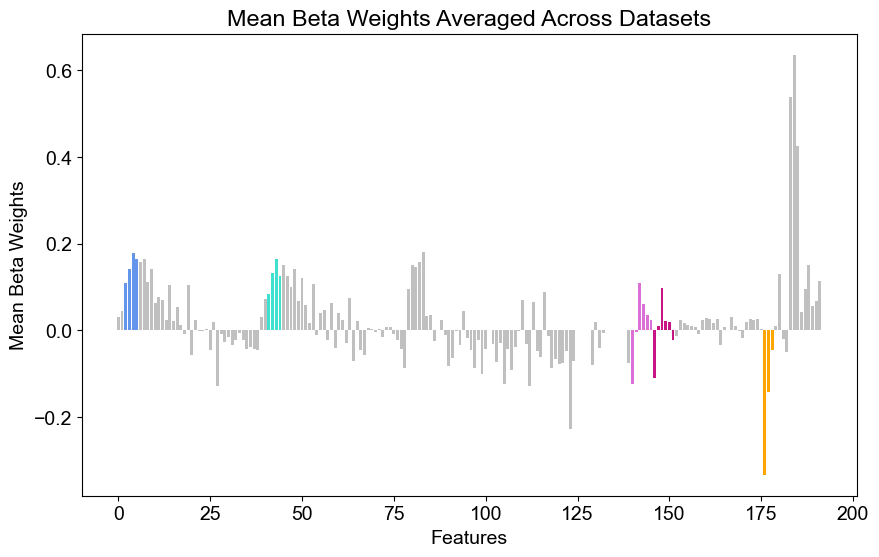

In [76]:
import matplotlib.pyplot as plt

significant_neurons = neurons_by_dataset 
# Placeholder for the highly modulated beta weights
highly_mod_betas = {}

# Placeholder for all beta weights across folds and datasets
all_betas = []

ex_model = results_pre

# Loop through the keys in ex_model and check for significant neurons
for key in significant_neurons.keys():
    if np.any(significant_neurons[key]):  # Only process if there are significant neurons
        betas_across_folds = []

        for fold in ex_model[key]['model_output_all'].keys():
            # Extract beta weights for significant neurons
            betas = ex_model[key]['model_output_all'][fold]['B_weights'][:, significant_neurons[key]]
            
            # Squeeze to remove unnecessary dimensions
            betas_squeezed = np.squeeze(betas)
            
            # If squeezing resulted in a 1D array, reshape it back to (192, 1)
            if betas_squeezed.ndim == 1:
                betas_squeezed = betas_squeezed.reshape(-1, 1)
            
            # Append to list of beta weights across folds
            betas_across_folds.append(betas_squeezed)

        # Stack beta weights across folds and compute the mean along the fold axis (axis=0)
        mean_betas = np.mean(np.stack(betas_across_folds, axis=0), axis=0)
        highly_mod_betas[key] = mean_betas
        print(np.shape(highly_mod_betas[key]))

        

        # # Append mean beta weights to the all_betas list
        # all_betas.append(mean_betas)
        # print(np.shape(all_betas))
        
        #concatenate or stack here after taking mean across folds so that I end up with array that has all predictors (192) x all neurons
    # all_betas = np.vstack((mean_betas))
    
# Now we need to create the all_betas array in the desired shape (192, num_neurons)
# Using a list to collect all means
all_betas = []

for mean_betas in highly_mod_betas.values():
    all_betas.append(mean_betas)  # Collect mean_betas directly

# Convert to a NumPy array and stack along the first axis (predictors)
all_betas = np.concatenate(all_betas, axis=1)  # (192, num_neurons)

# Print the final shape
print(f"Final Shape of All Betas: {np.shape(all_betas)}")   



# Check and reshape arrays before stacking if necessary

reshaped_betas = all_betas
# Stack beta weights across datasets and compute the overall mean
all_mean_betas = np.mean(reshaped_betas,axis=1)

# Create a color array for the bars
# colors = ['blue' if i < 176 or i > 178 else 'red' for i in range(all_mean_betas.shape[0])]

# Create a color array for the bars
colors = []
for i in range(all_mean_betas.shape[0]):
    if 2 <= i <= 5:
        colors.append('cornflowerblue')  # Highlight for weights 3-6 %left turn right before sound
    elif 41 <= i <= 44:
        colors.append('turquoise')  # right turn right before sound
    elif 140 <= i <= 145:
        colors.append('orchid') #-90 first sound
    elif 146 <= i <= 151:
        colors.append('mediumvioletred') #90 first sound
    elif 176 <= i <= 178:
        colors.append('orange')  # Highlight for weights 176-178
    else:
        colors.append('silver')  # Default color

# Plot the mean beta weights with highlighted specific weights
plt.figure(figsize=(10, 6))
# plt.bar(range(mean_weights.shape[0]), mean_weights # Use the color array for the bars

plt.bar(range(len(all_mean_betas)), all_mean_betas, color=colors) 
plt.xlabel('Features')
plt.ylabel('Mean Beta Weights')
plt.title('Mean Beta Weights Averaged Across Datasets')
plt.show()



In [99]:
# Import local utilities
from utils.dataset_processor import DatasetProcessor
from utils.cell_visualizer import CellVisualizer
# Load data from States_pupil_analysis
from helper_functions.data_pipeline import DataPipeline
pipeline = DataPipeline()
data_loaders, celltype_info = pipeline.load_data(datasets=datasets, load_celltypes=True)

# Initialize processor with alignment parameters
processor = DatasetProcessor(alignment={
    'type': 'pre',
    'data_type': 'z_dff'
})

fields_to_separate = ['condition'] #is_stim_trial, correct, condition left_turn,
# 
# Create trial divider for condition splitting
trial_divider = TrialDivider()

# Process and align all datasets
aligned_data = processor.process_datasets(
    data_loaders=data_loaders,
    celltype_info=celltype_info,
    save_path='aligned_data.pkl'
)

# For each dataset, create condition splits
for (animalID, date), data in aligned_data.items():
    print(f"\nProcessing {animalID} {date}")
    
    # Create condition splits
    
    all_conditions, condition_array = trial_divider.divide_trials_from_df(
        trial_info_df=data['trial_info'],
        good_trials=data['good_trials'],
        fields_to_separate=fields_to_separate
    )
    
    # Store conditions in aligned_data for later use
    aligned_data[(animalID, date)]['all_conditions'] = all_conditions
    print(f"Found {len(all_conditions)} conditions")

# Verify alignment worked
for (animalID, date), data in aligned_data.items():
    print(f"\nDataset: {animalID} {date}")
    print(f"Aligned imaging shape: {data['aligned_imaging'].shape}")
    print(f"Number of good trials: {len(data['good_trials'])}")
    print(f"Number of conditions: {len(data['all_conditions'])}")

Loading data for: Animal: HA11-1R, Date: 2023-05-05, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-04-13, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-04-12, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-05-05, Server: V:
Loading data for: Animal: HA1-00, Date: 2023-06-29, Server: V:
Loading data for: Animal: HA1-00, Date: 2023-08-28, Server: W:
Loading data for: Animal: HE4-1L1R, Date: 2023-08-21, Server: W:
Loading data for: Animal: HE4-1L1R, Date: 2023-08-24, Server: W:
Loading data for: Animal: HA10-1L, Date: 2023-04-10, Server: V:
Loading data for: Animal: HA10-1L, Date: 2023-04-17, Server: V:
Loading data for: Animal: HA10-1L, Date: 2023-04-12, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-04-07, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-05-01, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-05-02, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-04-28, Server: V:
Loading data for: Animal: HA2-1L, Date: 202

Dataset: HA11-1R_2023-05-05, Significant neurons: [  5   7  48  67  80 111 124 133 138 140 167 189 194 202 209 210 266 282
 288 298 299 301 322 360]
Dataset: HA11-1R_2023-04-13, Significant neurons: [ 37  39  51  60  75  78  87  99 111 131 134 139 150 154 165 188 189 195
 197 198 214 240 255 260 267 268 342 343 350 356 378]
Dataset: HA2-1L_2023-04-12, Significant neurons: [ 14  28  59  71  75  92 116 121 129 135 144 156 165 170 190 191 199 210
 217 219 241 248 254 276 279 280 286 300 305 315 319 335 346 351 353 355
 358 359 365 366 374 375]
Dataset: HA2-1L_2023-05-05, Significant neurons: [ 16  44  60 116 146 210 219 221 231 234 241 246 263 265 276 282 283 284
 295 317]
Dataset: HA1-00_2023-06-29, Significant neurons: [ 16  27  32  48  80 100 102 106 111 112 122 123 132 136 138 140 142 154
 155]
Dataset: HA1-00_2023-08-28, Significant neurons: [  1  12  49  52  70  88  90  91  98 123 134 158 172 191 192]
Dataset: HE4-1L1R_2023-08-21, Significant neurons: [ 14  34  39  43  45  52  70  8

C:\Code/Github/GLM-analysis\utils\cell_visualizer.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, n_conditions, figsize=(3*n_conditions, 3))


Dataset: HE4-1L1R_2023-09-04, Significant neurons: [ 10  19  21  27  29  32  42  47  52  57  81  99 106 157 158 160 161 171
 183 185 191 200 205 208 224 227 231 244 245 248 252 254 269 281 292 310]
Dataset: HE4-1L1R_2023-09-11, Significant neurons: [  8  22  24  25  27  32  81 106 108 132 136 174 175 214 217 231 233]
Dataset: HA10-1L_2023-03-31, Significant neurons: [  8   9  13  26  34  39  47  51  58  61  64  67  76  80  86  95  97 106
 108 111 112 119 124 125 126 127 128 149 150 151 158 159 178 186 188 192
 202 212 214 233 241 242 243 246 251 253 260 261 264 265 266 275 278 279
 280 284 295 296 297 298 300 301 303 307 310 312 317 321 334 336 344 347
 349 354 362 364 373 375 383 387 393]
Dataset: HE1-00_2023-05-30, Significant neurons: [  7  25  37  43  45  49  50  52  53  57  65  69  75  85  91  92 107 124
 148 152 154 160 175 179 184 187 192 214 228 242 244 248 260 268 276 289
 294 296 299 306 321 325 337]
Plotting complete!


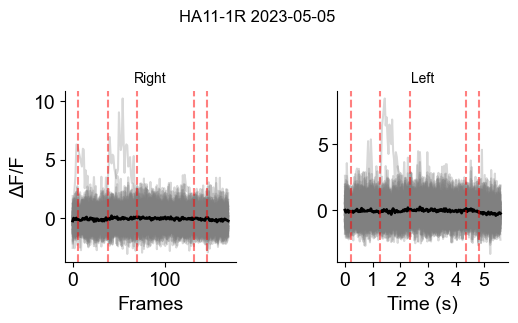

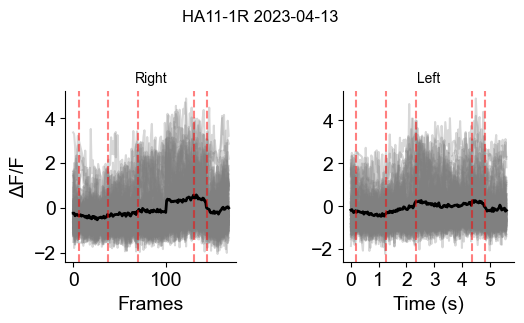

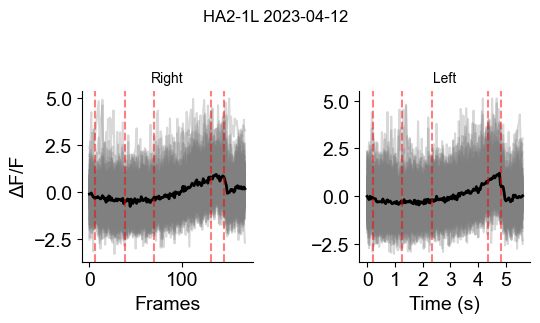

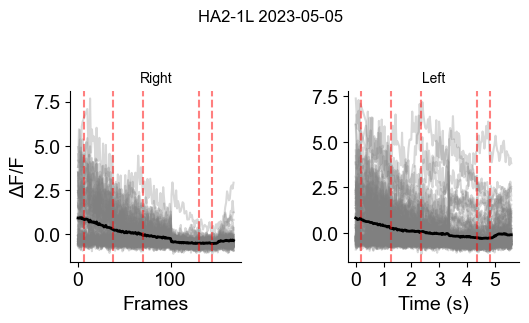

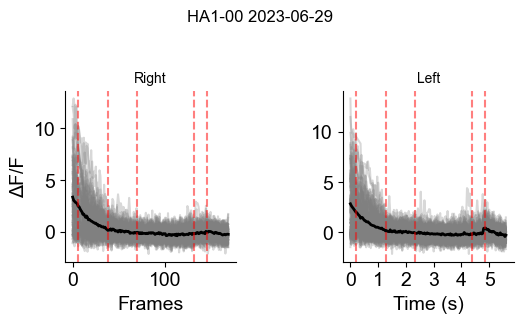

...

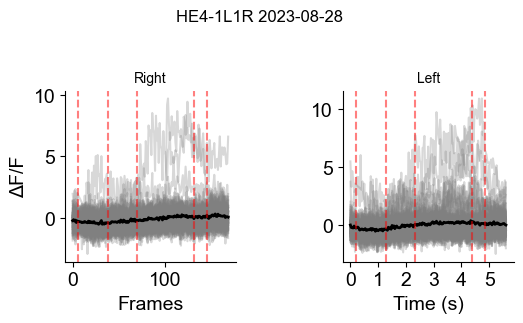

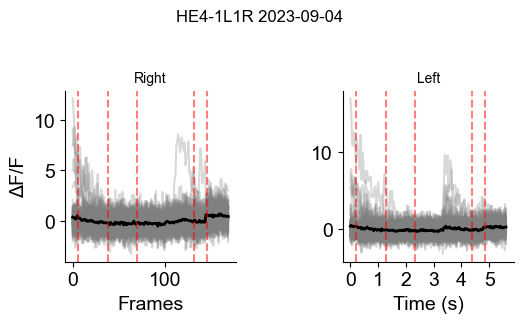

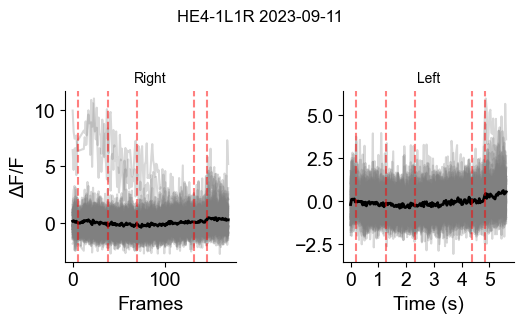

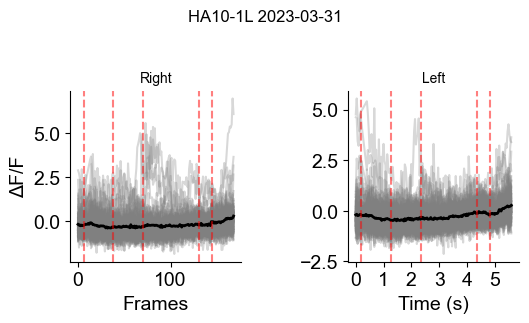

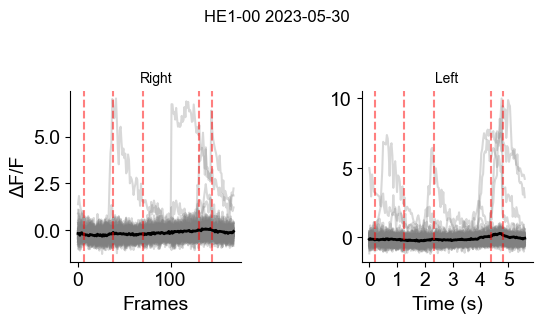

In [184]:
# Initialize visualization tools
trial_plotter = TrialPlotter()
trial_divider = TrialDivider()
cell_viz = CellVisualizer()

# Create output directories if they don't exist
base_figure_dir = f'{save_results}/figures/suppressed_neurons'
os.makedirs(base_figure_dir, exist_ok=True)


# Plot for each dataset
for dataset in mouse_dates:
        
    # Extract animal ID and date from dataset name
    animalID, date = dataset.split('_')
    
    # Get the aligned data for this dataset
    data = aligned_data[(animalID, date)]
    
    # Get significant neurons and their modulation values
    sig_neurons = significant_neurons[dataset][0]
    print(f"Dataset: {dataset}, Significant neurons: {sig_neurons}")
    
    # Plot the most modulated neuron
    cell_viz.plot_informative_cell(
        aligned_imaging=data['aligned_imaging'],
        cell_id=sig_neurons[5],  # Change this to the specific neuron ID you want to plot
        all_conditions=data['all_conditions'],
        title_base=f'{animalID} {date} ',
        save_path=f'{base_figure_dir}/{animalID}_{date}_ex_suppressed'
    )

print("Plotting complete!")

In [ ]:
from typing import List, Optional, Tuple
def plot_population_heatmap(aligned_imaging: np.ndarray,
                          sig_neurons: list,
                          all_conditions: list,
                          title: str = None,
                          save_path: str = None,
                          vmin: float = None,
                          vmax: float = None) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot heatmap of all significant neurons' activity across conditions.
    
    Parameters:
    -----------
    aligned_imaging : np.ndarray
        Shape (trials, neurons, frames)
    sig_neurons : list
        List of significant neuron indices
    all_conditions : list
        List of (trials, combination, label) tuples
    title : str, optional
        Title for the plot
    save_path : str, optional
        Path to save the figure
    vmin, vmax : float, optional
        Min and max values for color scaling
    
    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """
    # Create figure
    fig, axes = plt.subplots(len(all_conditions), 1, 
                            figsize=(12, 4*len(all_conditions)),
                            sharex=True)
    
    if len(all_conditions) == 1:
        axes = [axes]
    
    # For each condition
    for ax, (trials, _, label) in zip(axes, all_conditions):
        # Get data for significant neurons
        condition_data = aligned_imaging[trials][:, sig_neurons, :]
        
        # Calculate mean across trials
        mean_activity = np.mean(condition_data, axis=0)  # (neurons, frames)
        
        # Plot heatmap
        im = ax.imshow(mean_activity, 
                      aspect='auto',
                      cmap='viridis',
                      vmin=vmin,
                      vmax=vmax)
        
        # Add colorbar
        plt.colorbar(im, ax=ax, label='ΔF/F')
        
        # Customize plot
        ax.set_ylabel('Neuron #')
        ax.set_title(f'{label} (n={len(sig_neurons)} neurons)')
        
        # Add event markers
        event_labels = ['S1','S2','S3','turn', 'reward']
        for frame, event_label in zip(plotter.event_frames, event_labels):
            ax.axvline(x=frame, color='w', linestyle='--', alpha=0.5)
            
    # Add overall title if provided
    if title:
        fig.suptitle(title, y=1.02, fontsize=14)
        
    # Add x-label to bottom subplot
    axes[-1].set_xlabel('Frames')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save if path provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        
    return fig, axes

In [178]:
def plot_consolidated_heatmap(aligned_imaging: dict,
                            significant_neurons: dict,
                            all_conditions: List[tuple],
                            title: Optional[str] = None,
                            save_path: Optional[str] = None,
                            vmin: Optional[float] = -0.5,
                            vmax: Optional[float] = 3) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot all significant neurons from all datasets in a single heatmap, sorted by peak timing.
    """
    # Create figure
    fig, axes = plt.subplots(len(all_conditions), 1, 
                            figsize=(15, 6*len(all_conditions)),
                            sharex=True)
    
    if len(all_conditions) == 1:
        axes = [axes]
        
    # For each condition
    for ax_idx, (base_trials, _, label) in enumerate(all_conditions):
        all_neurons = []
        dataset_labels = []
        
        # Combine data across datasets
        for dataset, neurons in significant_neurons.items():
            animalID, date = dataset.split('_')
            data = aligned_imaging[(animalID, date)]
            
            # Get trials for this dataset and condition
            dataset_trials = data['all_conditions'][ax_idx][0]
            
            # Get mean activity for these neurons
            try:
                condition_data = data['aligned_imaging'][dataset_trials][:, neurons[0], :]
                mean_activity = np.mean(condition_data, axis=0)
                
                all_neurons.append(mean_activity)
                dataset_labels.extend([animalID] * len(neurons[0]))
            except IndexError as e:
                print(f"Warning: Skipping {dataset} due to indexing error: {e}")
                continue
        
        if not all_neurons:
            print(f"Warning: No valid data for condition {label}")
            continue
            
        # Stack all neurons
        activity_matrix = np.vstack(all_neurons)
        
        # Sort neurons by time of maximum activity
        peak_times = np.argmax(activity_matrix, axis=1)
        sort_idx = np.argsort(peak_times)
        activity_matrix = activity_matrix[sort_idx]
        dataset_labels = [dataset_labels[i] for i in sort_idx]
        
        # Plot heatmap
        im = axes[ax_idx].imshow(activity_matrix,
                                aspect='auto',
                                cmap='viridis',
                                vmin=vmin,
                                vmax=vmax)
        
        # Customize subplot
        axes[ax_idx].set_ylabel('Neuron # (sorted by peak time)')
        axes[ax_idx].set_title(f'{label} (n={activity_matrix.shape[0]} neurons)')
        plt.colorbar(im, ax=axes[ax_idx], label='zscored F/F')
        
        # Add event markers
        event_frames = [6., 38., 70., 131., 145.]
        event_labels = ['S1', 'S2', 'S3', 'Turn', 'Reward']
        for frame, event_label in zip(event_frames, event_labels):
            axes[ax_idx].axvline(x=frame, color='w', linestyle='--', alpha=0.5)

            # Add label above the plot
            axes[ax_idx].text(frame, -5, event_label, 
                            ha='center', va='bottom', 
                            color='w', fontsize=10,
                            rotation=45)
            
        # Adjust y-axis limits to make room for labels
        ylim = axes[ax_idx].get_ylim()
        axes[ax_idx].set_ylim(ylim[0] - 10, ylim[1])
    
    # Add overall title
    if title:
        fig.suptitle(title, y=1.02, fontsize=14)
    
    # Add x-label to bottom subplot
    axes[-1].set_xlabel('Frames')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        
    return fig, axes

C:\Users\runyan1\AppData\Local\Temp\ipykernel_70676\2052845281.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(len(all_conditions), 1,


Population heatmaps complete!


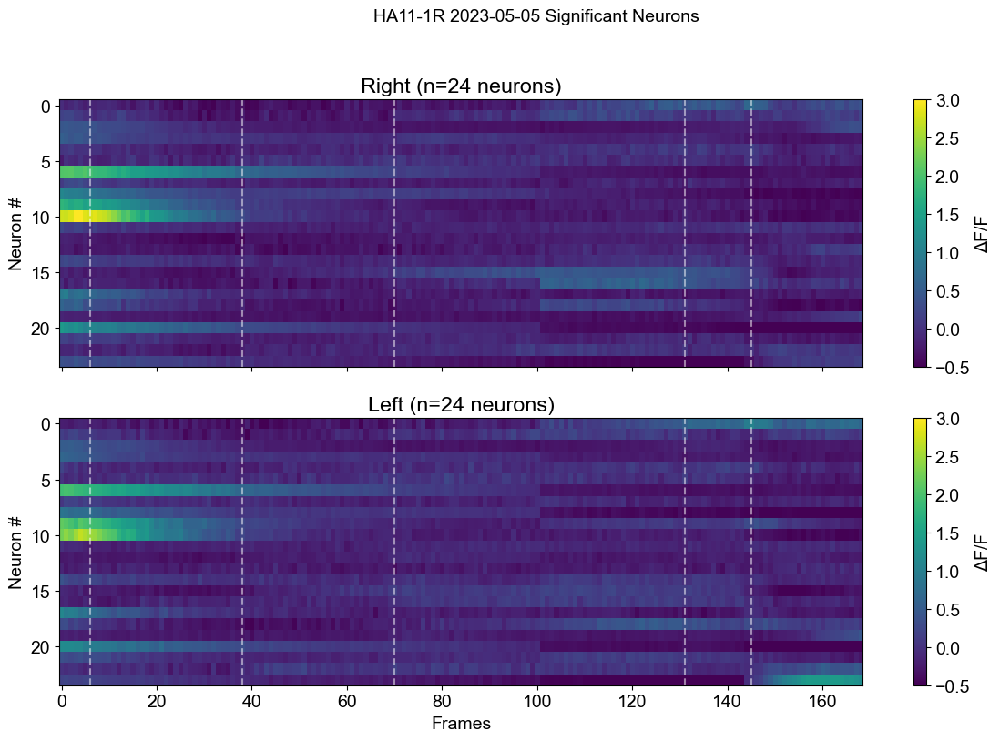

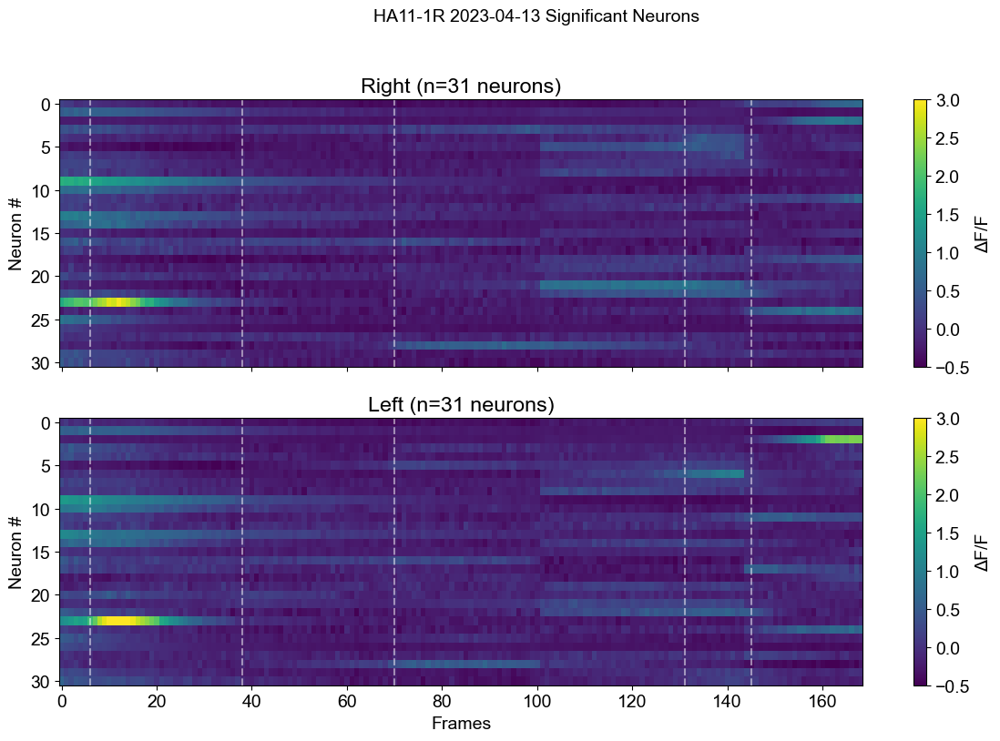

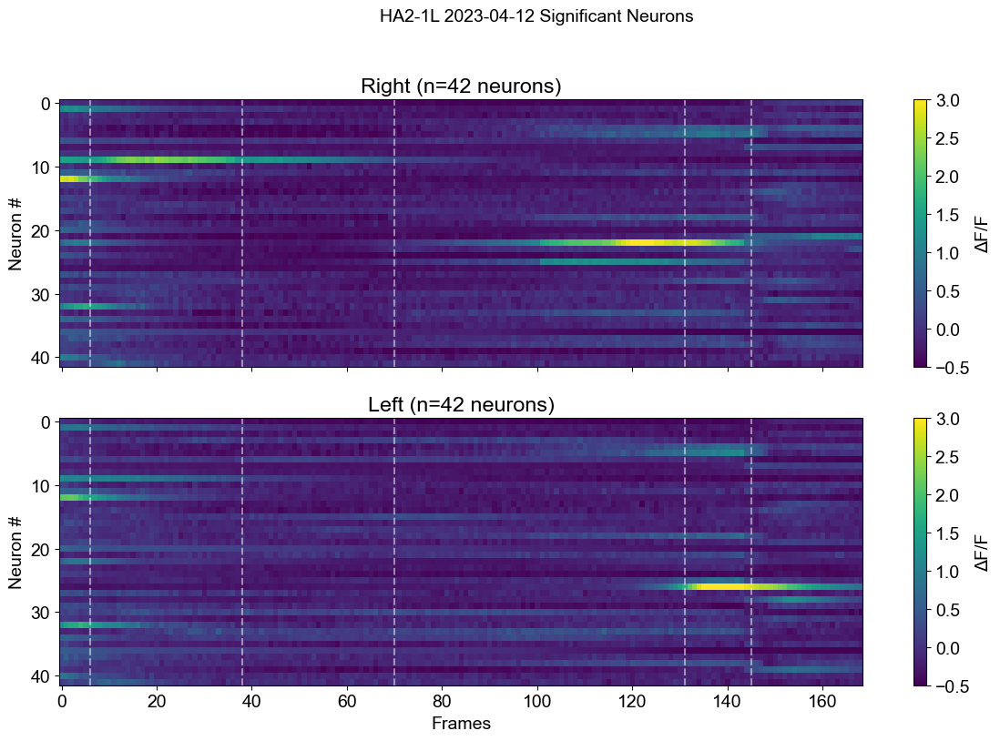

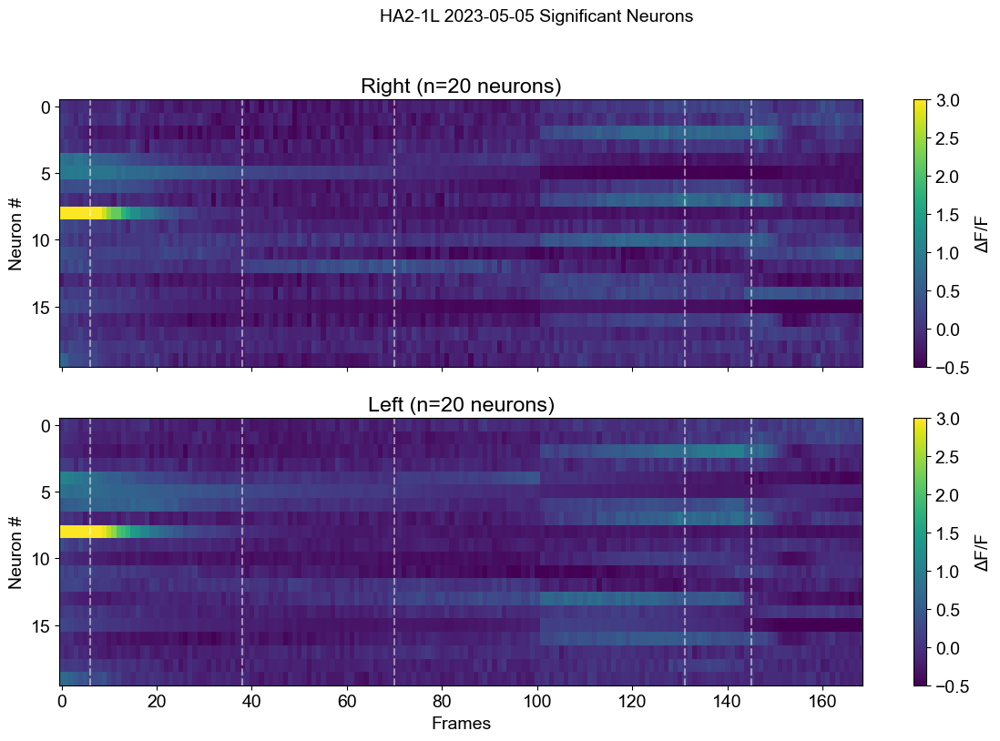

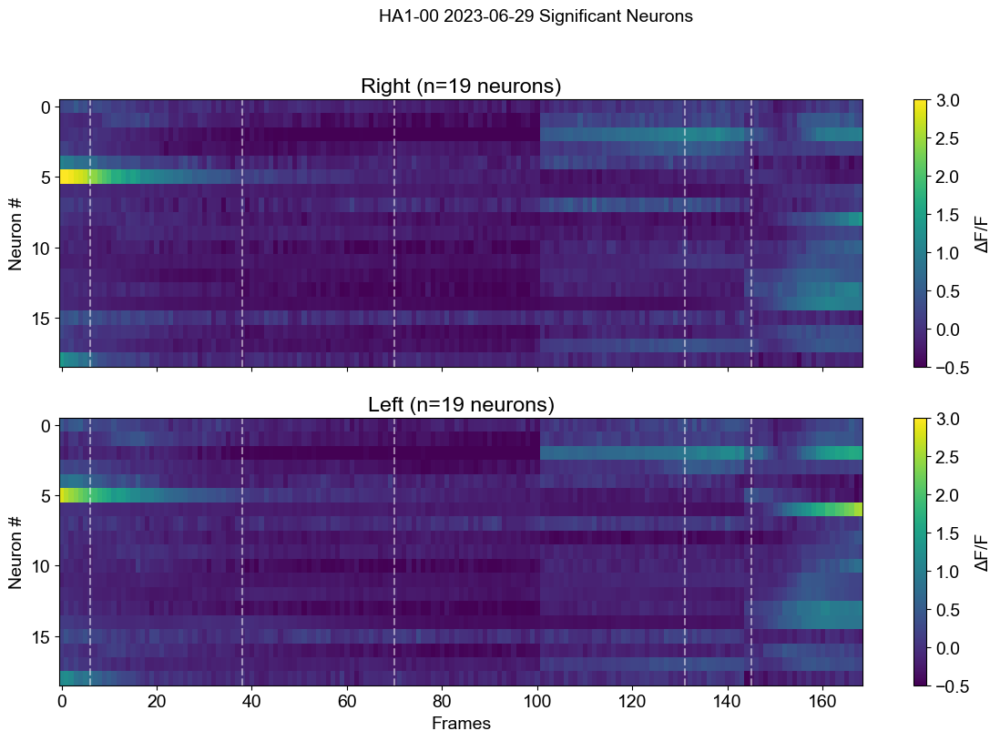

...

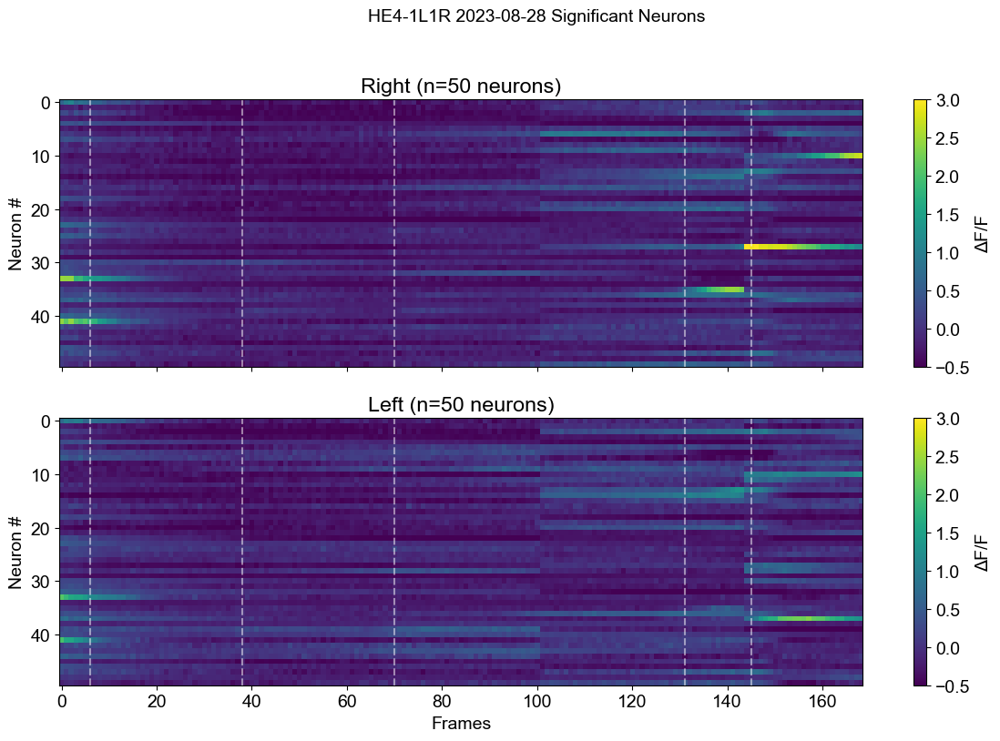

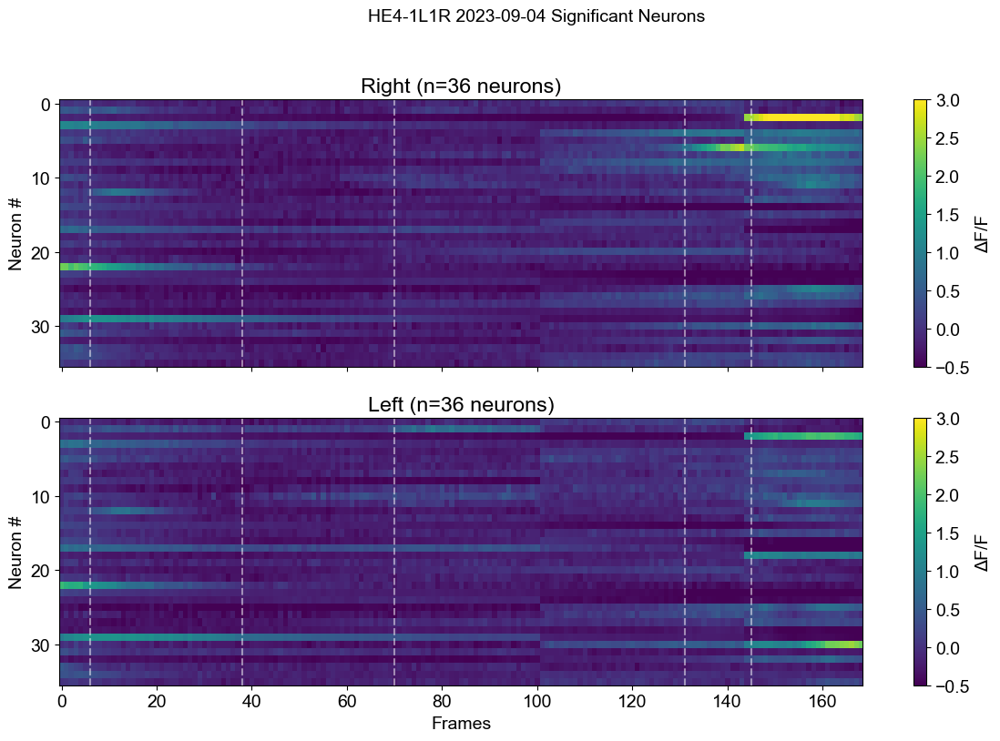

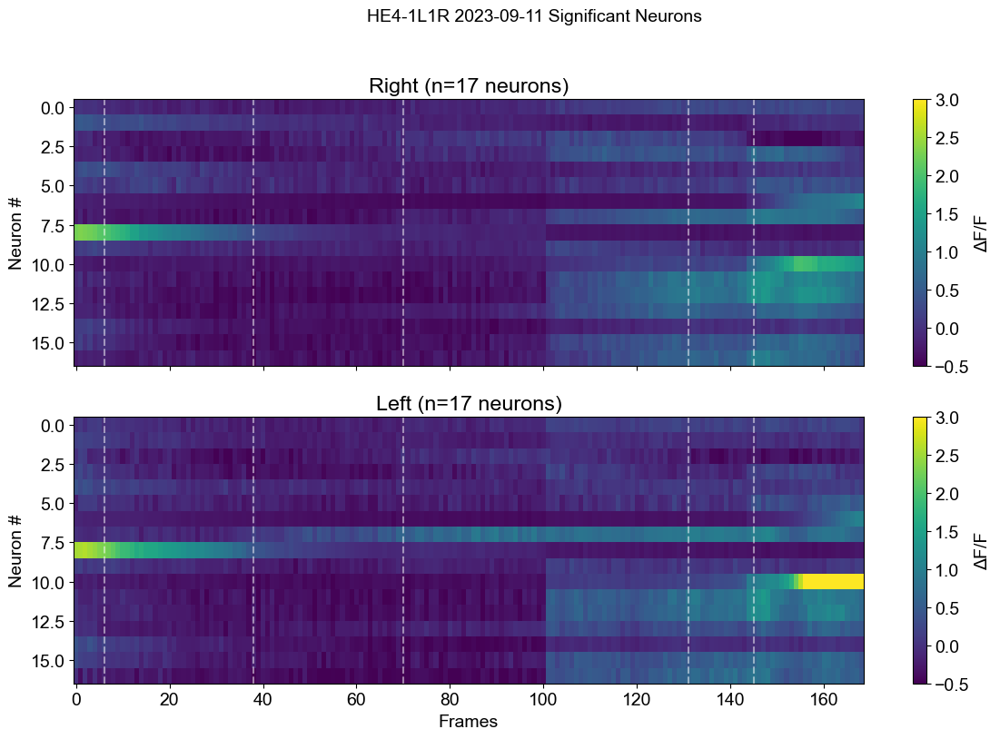

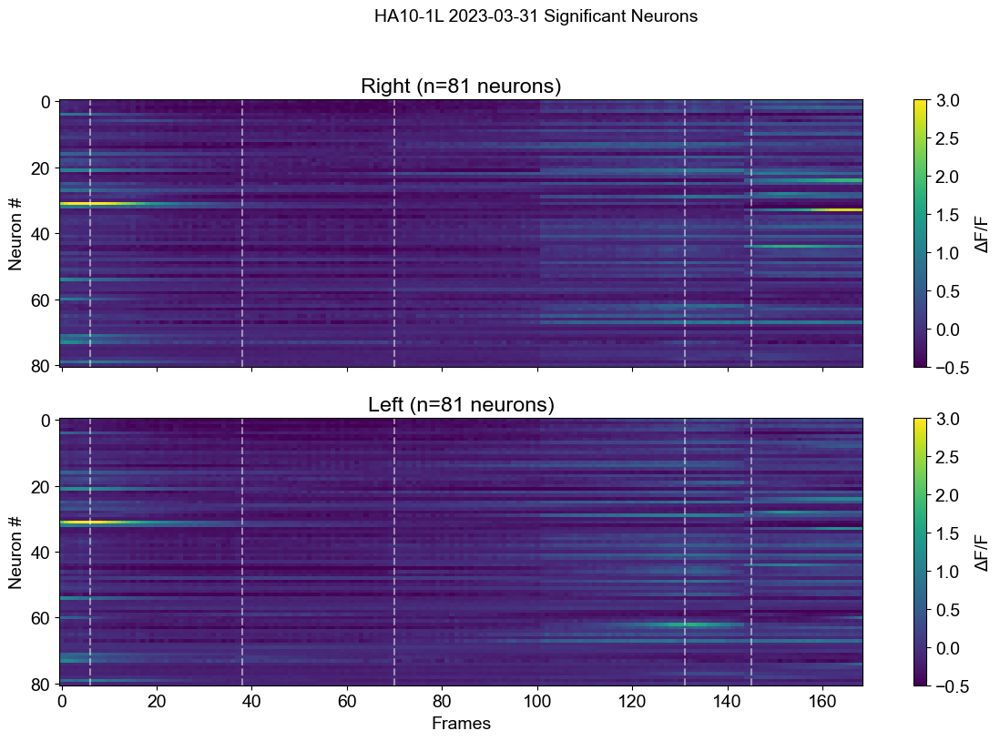

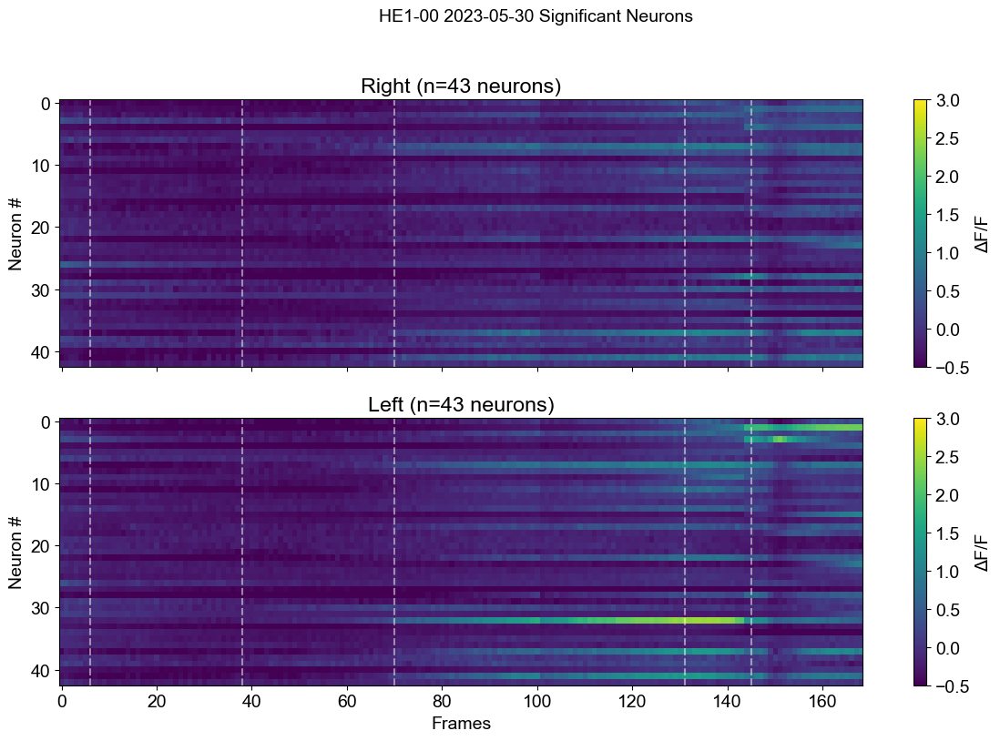

In [157]:
# Plot for each dataset
for dataset in mouse_dates:
    # Extract animal ID and date from dataset name
    animalID, date = dataset.split('_')
    
    # Get the aligned data for this dataset
    data = aligned_data[(animalID, date)]
    
    # Get significant neurons
    sig_neurons = significant_neurons[dataset][0]
    
    # Plot population heatmap
    plot_population_heatmap( #cell_viz.plot_population_heatmap
        aligned_imaging=data['aligned_imaging'],
        sig_neurons=sig_neurons,
        all_conditions=data['all_conditions'],
        title=f'{animalID} {date} Significant Neurons',
        save_path=f'{base_figure_dir}/{animalID}_{date}_population_heatmap.pdf',
        vmin=-0.5,  # Adjust these values based on your data
        vmax=3
    )

# plt.close('all')  # Close all figures to free memory
print("Population heatmaps complete!")

Consolidated heatmap complete!


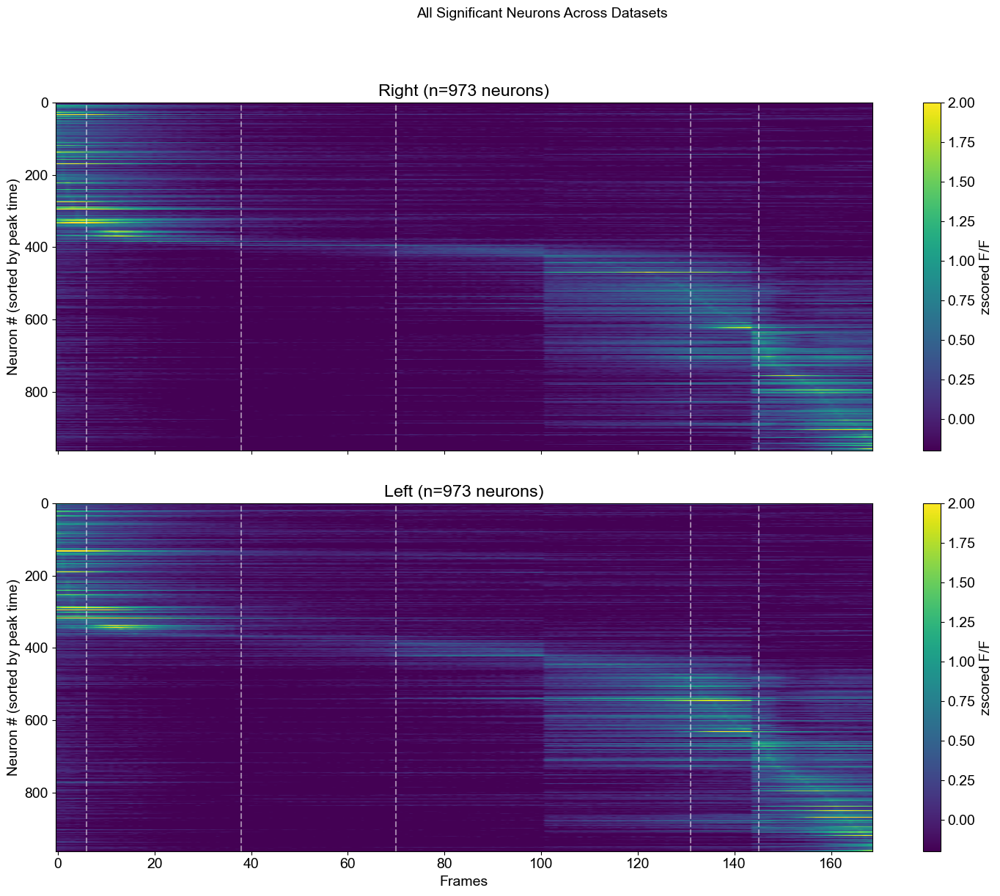

In [179]:
# Get conditions from first dataset
first_dataset = list(aligned_data.values())[0]
all_conditions = first_dataset['all_conditions']

# Create consolidated heatmap
plot_consolidated_heatmap(
    aligned_imaging=aligned_data,
    significant_neurons=significant_neurons,
    all_conditions=all_conditions,
    title='All Significant Neurons Across Datasets',
    save_path=f'{base_figure_dir}/consolidated_heatmap.pdf',
    vmin=-0.2,
    vmax=2
)

# plt.close('all')  # Free memory
print("Consolidated heatmap complete!")

-1.8201676484960113e+34
[-8.54189128e-03 -3.37634903e-03 -1.00352661e-03 -2.16850933e-03
 -6.25866252e-03 -1.61238508e-03 -3.03755043e-02 -5.50860475e-02
 -3.74833237e-01 -6.62662457e-04 -1.01801286e-02 -2.33490988e-03
 -2.15887822e-03 -1.77307043e-04 -9.14730991e-04 -3.42439973e-02
 -8.72014974e-04 -3.63435908e-03 -6.16618291e-03 -1.23056008e-02
 -8.68788306e-04 -2.80847277e-03 -1.60300595e-02 -4.65877062e-03
 -7.63261576e-03 -1.30278787e-03 -2.03162482e-02 -5.46670945e-03
 -3.19265216e-03 -8.39953530e-03 -6.60870448e-04 -2.67609965e-02
 -8.71456671e-03 -2.60148977e-02 -1.67755061e-02 -1.64944495e-02
 -1.13173200e-02 -7.33455615e-03 -8.46483497e-03 -4.48765076e-03
 -7.99755702e-04 -7.21357069e-03 -2.17936862e-03 -1.17343171e-03
 -5.57178623e-03 -3.74214582e-03 -9.16147681e-03 -1.82016765e+34
 -2.68988144e-03 -3.21575303e-02 -8.09107115e-03 -2.34965521e-03
 -6.22619016e-03 -1.21835193e-02 -2.59276062e-03 -2.67335341e-03
 -2.11689309e-04]


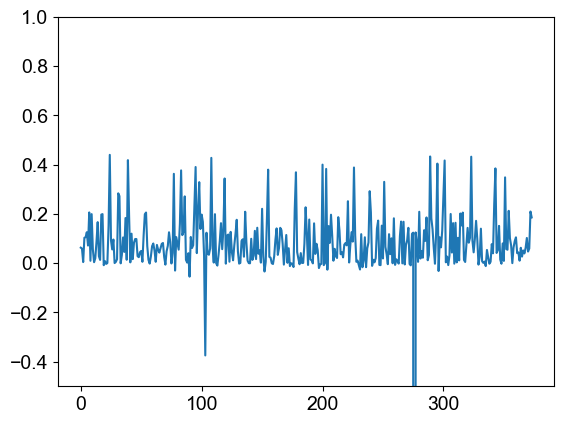

In [63]:
print(results_pre['HA11-1R_2023-05-02']['mean_dev'].min())
plt.plot(results_pre['HA11-1R_2023-05-02']['mean_dev'])
# fix y limits
plt.ylim(-0.5, 1)

print(results_pre['HA11-1R_2023-05-02']['mean_dev'][results_pre['HA11-1R_2023-05-02']['mean_dev'] < 0])

Found 1 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 2 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 2 outliers with values outside [-0.1, 1]
 model deviance explained: 0.105 ± 0.098
Found 2 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 2 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 1 outliers with values outside [-0.1, 1]
Found 3 outliers with values outside [-0.1, 1]
_behav model deviance explained: 0.075 ± 0.094


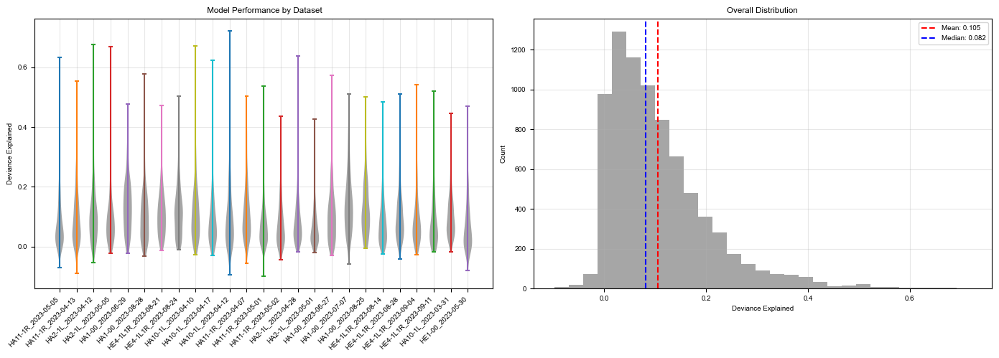

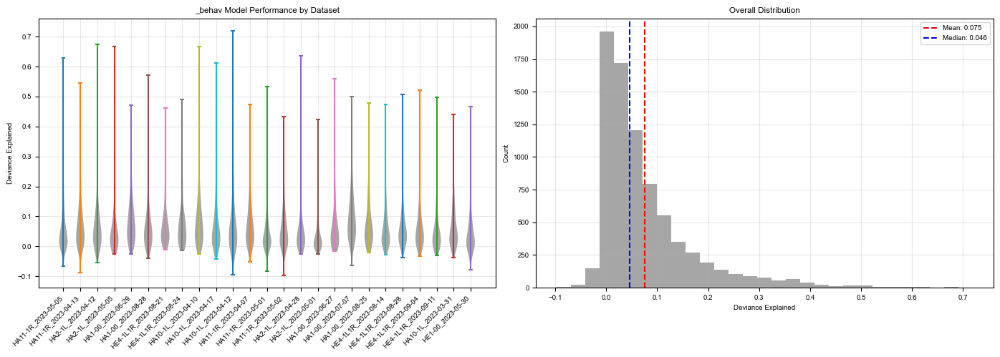

In [235]:
# Create output directory for supplemental figures
supp_figure_dir = f'{save_results}/glm_coupling/supplemental'
os.makedirs(supp_figure_dir, exist_ok=True)
import matplotlib.pyplot as plt


def clean_deviance_values(dev_values, lower_bound=-1, upper_bound=1):
    """Clean deviance explained values by removing extreme outliers."""
    cleaned_dev = np.array(dev_values, dtype=float)
    
    # Find extreme outliers
    outliers = np.where((cleaned_dev < lower_bound) | (cleaned_dev > upper_bound))[0]
    if len(outliers) > 0:
        print(f"Found {len(outliers)} outliers with values outside [{lower_bound}, {upper_bound}]")
        cleaned_dev[outliers] = np.nan
    
    return cleaned_dev

def plot_deviance_summary(results_pre, model_type='behav', save_path=None, 
                         lower_bound=-.2, upper_bound=1):
    """Plot deviance explained summary across datasets."""
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # Collect deviance explained for all datasets
    dataset_dev = []
    dataset_labels = []
    all_dev = []
    
    for dataset in results_pre.keys():
        dev_key = f'mean_dev{model_type}'
        # Clean deviance values
        dev_explained = clean_deviance_values(
            results_pre[dataset][dev_key],
            lower_bound=lower_bound,
            upper_bound=upper_bound
        )
        all_dev.extend(dev_explained[~np.isnan(dev_explained)])
        
        dataset_dev.append(np.nanmean(dev_explained))
        dataset_labels.append(dataset)
        
        # Plot distribution for each dataset
        valid_dev = dev_explained[~np.isnan(dev_explained)]
        violin = ax1.violinplot(valid_dev, positions=[len(dataset_dev)-1])
        for pc in violin['bodies']:
            pc.set_facecolor('gray')
            pc.set_alpha(0.7)
    
    # Customize dataset distribution plot
    ax1.set_xticks(range(len(dataset_labels)))
    ax1.set_xticklabels(dataset_labels, rotation=45, ha='right')
    ax1.set_ylabel('Deviance Explained')
    ax1.set_title(f'{model_type.capitalize()} Model Performance by Dataset')
    ax1.grid(True, alpha=0.3)
    
    # Plot overall distribution
    bins = np.linspace(np.nanmin(all_dev), np.nanmax(all_dev), 30)
    ax2.hist(all_dev, bins=bins, color='gray', alpha=0.7)
    ax2.axvline(np.nanmean(all_dev), color='r', linestyle='--', 
                label=f'Mean: {np.nanmean(all_dev):.3f}')
    ax2.axvline(np.nanmedian(all_dev), color='b', linestyle='--', 
                label=f'Median: {np.nanmedian(all_dev):.3f}')
    ax2.set_xlabel('Deviance Explained')
    ax2.set_ylabel('Count')
    ax2.set_title('Overall Distribution')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    
    return np.nanmean(all_dev), np.nanstd(all_dev)

# Usage remains the same
model_types = ['','_behav']
dev_stats = {}

for model in model_types:
    mean_dev, std_dev = plot_deviance_summary(
        results_pre,
        model_type=model,
        save_path=f'{supp_figure_dir}/deviance_explained_{model}.pdf',
        lower_bound=-.1,  # Adjust these bounds as needed
        upper_bound=1
    )
    dev_stats[model] = {'mean': mean_dev, 'std': std_dev}
    print(f"{model.capitalize()} model deviance explained: {mean_dev:.3f} ± {std_dev:.3f}")


def plot_deviance_summary_single_plot(results_pre, model_type='behav', save_path=None, 
                         lower_bound=-.2, upper_bound=1, figsize=(14, 5), bins = 30, ylims=(0,50), label_names=True, color_hist = 'gray',ax2=None):
    """Plot deviance explained summary across datasets."""
    if ax2 is None:
        fig, (ax2) = plt.subplots(1, figsize=figsize)
    # Set global font size and family 
    plt.rcParams.update({'font.size': 7, 'font.family': 'arial'})
    
    # Collect deviance explained for all datasets
    dataset_dev = []
    dataset_labels = []
    all_dev = []
    
    for dataset in results_pre.keys():
        dev_key = f'mean_dev{model_type}'
        # Clean deviance values
        dev_explained = clean_deviance_values(
            results_pre[dataset][dev_key],
            lower_bound=lower_bound,
            upper_bound=upper_bound
        )
        all_dev.extend(dev_explained[~np.isnan(dev_explained)])
        
        dataset_dev.append(np.nanmean(dev_explained))
        dataset_labels.append(dataset)
        
    
    # Plot overall distribution
    bins = np.linspace(np.nanmin(all_dev), np.nanmax(all_dev), bins)
    # ax2.hist(all_dev, bins=bins, color='gray', alpha=0.7)
    # Plot overall distribution as percentage histogram
    counts, bins = np.histogram(all_dev, bins= bins)  # raw counts
    percentages = counts / len(all_dev) * 100      # convert to %

    ax2.bar(bins[:-1], percentages, width=np.diff(bins),
            color= color_hist, alpha=0.7, align='edge')
    
    default_color_mean = 'black' #'orangered'
    default_color_median = 'orangered' ##'mediumblue'
    ax2.axvline(np.nanmean(all_dev), color=default_color_mean, linestyle='--', 
                label=f'Mean: {np.nanmean(all_dev):.3f}')
    ax2.axvline(np.nanmedian(all_dev), color=default_color_median, linestyle='--', 
                label=f'Median: {np.nanmedian(all_dev):.3f}')
    if label_names:
        ax2.set_xlabel('Deviance Explained')
        ax2.set_ylabel("Probability (%)")
    # ax2.set_ylabel('Count')
    # Update y-axis to percentage
    # ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y*100:.0f}%'))


    # ax2.set_title('Overall Distribution')
    # ax2.legend(loc = 'upper right', fontsize=6) #loc='center left', bbox_to_anchor=(1, 0.5)
    ax2.legend(
        loc="upper right",
        bbox_to_anchor=(1.5, 1),  # push legend to the right
        fontsize=6,
        frameon=False
    )

    # ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=6) #loc='center left', bbox_to_anchor=(1, 0.5)
    # ax2.grid(True, alpha=0.3)

    if ylims:
        ax2.set_ylim(ylims)
    xlims = (-.1,.5)
    ax2.set_xlim(xlims)

    for spine in ["top", "right"]:
        ax2.spines[spine].set_visible(False)

    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    
    return np.nanmean(all_dev), np.nanstd(all_dev)

# # Usage remains the same
# model_types = ['','_behav']
# dev_stats = {}

# for model in model_types:
#     mean_dev, std_dev = plot_deviance_summary(
#         results_pre,
#         model_type=model,
#         save_path=f'{supp_figure_dir}/deviance_explained_{model}.pdf',
#         lower_bound=-.1,  # Adjust these bounds as needed
#         upper_bound=1
#     )
#     dev_stats[model] = {'mean': mean_dev, 'std': std_dev}
#     print(f"{model.capitalize()} model deviance explained: {mean_dev:.3f} ± {std_dev:.3f}")

In [34]:
plotter.default_colors_model_type = {
    'full': 'deepskyblue',
    'behav':  'mediumvioletred'} #cornflowerblue #palevioletred

Found 27 outliers with values outside [0, 1]
Found 23 outliers with values outside [0, 1]
Found 17 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 5 outliers with values outside [0, 1]
Found 6 outliers with values outside [0, 1]
Found 5 outliers with values outside [0, 1]
Found 8 outliers with values outside [0, 1]
Found 18 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 28 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 33 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 12 outliers with values outside [0, 1]
Found 10 outliers with values outside [0, 1]
Found 3 outliers with values outside [0, 1]
Found 4 outliers with values outside [0, 1]
Found 23 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 16 outlier

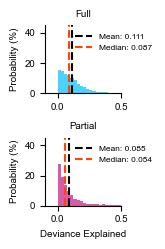

In [302]:
fig, axes = plt.subplots(2, 1, figsize=(1.85, 1.25*2))  # 1 row, 2 cols original figsize=(1.85,1.25)
model_type_labels = ['Full', 'Partial']
for i, model in enumerate(model_types):
    model_key = model.lstrip('_') if model else 'full'
    ax = axes[i]
    
    mean_dev, std_dev = plot_deviance_summary_single_plot(
        results_pre,
        model_type=model,
        ax2=ax,  # pass the subplot axis
        lower_bound=0,
        upper_bound=1,
        figsize=None,  # figsize handled by the figure
        bins=30,
        ylims=(0, 45),
        label_names=False,
        color_hist=plotter.default_colors_model_type[model_key],
    )
    ax.set_title(model_type_labels[i].capitalize(),fontsize = 7)  # optional title per subplot

axes[1].set_xlabel('Deviance Explained')  # Set x-label only for the bottom plot
axes[0].set_ylabel('Probability (%)')  # Set y-label only for the top
axes[1].set_ylabel('Probability (%)')  # Set y-label only for the top
plt.tight_layout()

save_path = f'{supp_figure_dir}/deviance_explained_hist_pre_combined.pdf'
plt.savefig(save_path, bbox_inches='tight', dpi=300)

Found 27 outliers with values outside [0, 1]
Found 23 outliers with values outside [0, 1]
Found 17 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 5 outliers with values outside [0, 1]
Found 6 outliers with values outside [0, 1]
Found 5 outliers with values outside [0, 1]
Found 8 outliers with values outside [0, 1]
Found 18 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 28 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 33 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 12 outliers with values outside [0, 1]
Found 10 outliers with values outside [0, 1]
Found 3 outliers with values outside [0, 1]
Found 4 outliers with values outside [0, 1]
Found 23 outliers with values outside [0, 1]
Found 13 outliers with values outside [0, 1]
Found 14 outliers with values outside [0, 1]
Found 16 outlier

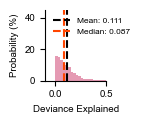

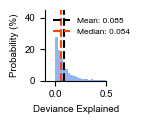

In [230]:
# Usage remains the same
model_types = ['','_behav']
dev_stats = {}

for model in model_types:
    model_key = model.lstrip('_') if model else 'full'
    mean_dev, std_dev = plot_deviance_summary_single_plot(
        results_pre,
        model_type=model,
        save_path=f'{supp_figure_dir}/deviance_explained_hist_updated_{model}_pre.pdf',
        lower_bound=0,  # Adjust these bounds as needed
        upper_bound=1,
        figsize=(1.85,1.25), #(2,1.5)
        bins = 30,
        ylims = (0,45),
        label_names = True,
        color_hist = plotter.default_colors_model_type[model_key]
    )
    dev_stats[model] = {'mean': mean_dev, 'std': std_dev}
    print(f"{model.capitalize()} model deviance explained: {mean_dev:.3f} ± {std_dev:.3f}")

NameError: name 'patches' is not defined

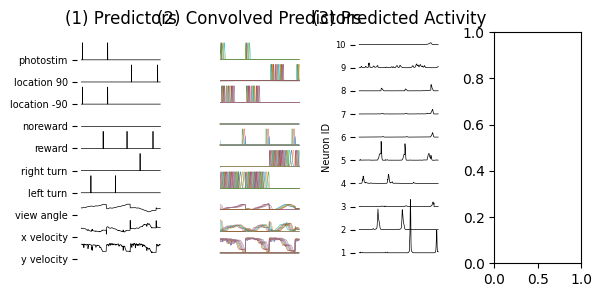

In [70]:
#create functions to generate supplemental figure 2 panels
import os
import numpy as np
import scipy.io
import h5py
import matplotlib.pyplot as plt
def load_decoder_and_glm_variables(mouse_dates_keys, session_idx, model_type, fold_number, frames, decoder_type = 'choice', shuffle_num = 0):
    example_dataset = [mouse_dates_keys[session_idx]]
    animalID, date = example_dataset[0].split('_')
    save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_{model_type}/'
    path = os.path.join(save_directory, f"prepost trial cv 73 #{fold_number+1}/test") #get testing folder

    # Load behavioral matrices
    behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
    behav_matrix = behav['behav_the_matrix']
    behav_ids = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix_ids.mat'))
    behav_matrix_ids_raw = behav_ids['behav_the_matrix_ids'][0]

    behav = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix.mat'))
    behav_big_matrix = behav['behav_big_matrix']
    behav_big_ids = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix_ids.mat'))
    behav_big_matrix_ids = behav_big_ids['behav_big_matrix_ids'][0]

    # Load condition array trials and frames
    condition_array = scipy.io.loadmat(os.path.join(path, 'condition_array_trials.mat'))
    condition_array_trials = condition_array['condition_array_trials']
    combined_frames = scipy.io.loadmat(os.path.join(path, 'combined_frames_included.mat'))
    combined_frames_included = combined_frames['combined_frames_included'].squeeze()

    # Load decoder
    decoder_path = os.path.join(save_directory, f"decoding/{fold_number+1}_1/decoder_results_regular_{decoder_type}.mat")
    with h5py.File(decoder_path, 'r') as f:
        decoder = f['decoder_results']
        decoder_group = decoder['inputs'][decoder_type]
        decoder_info = decoder['aligned'][decoder_type]

        i = shuffle_num  # shuffle_num - 1
        #get shuffle i
        pop_ref = decoder_group['pop_instantaneous_decoded_variables'][i, 0]
        sc_ref = decoder_group['sc_instantaneous_decoded_variables'][i, 0]
        pop_ref_cumulative = decoder_group['pop_cumulative_decoded_variables'][i, 0]
        sc_ref_cumulative = decoder_group['sc_cumulative_decoded_variables'][i, 0]
        decoder_info_ref = decoder_info['results'][i, 0]

        decoder_info_group = f[decoder_info_ref]
        info_data = decoder_info_group['sc_instantaneous_information'][()]
        info_data_cumulative = decoder_info_group['sc_cumulative_information'][()]
        testing_trials_used = decoder_info_group['alignment']['trials_used']['test'][()] #decoder uses data only form testing folder
        testing_trials_used = np.where(testing_trials_used)[0]
            # Access the actual data
        decoder_population = f[pop_ref][()]
        decoder_singlecell = f[sc_ref][()]
        decoder_population_cumulative = f[pop_ref_cumulative][()]
        decoder_singlecell_cumulative = f[sc_ref_cumulative][()]

    return {
        'frames': frames,
        'behav_matrix': behav_matrix,
        'behav_matrix_ids_raw': behav_matrix_ids_raw,
        'behav_big_matrix': behav_big_matrix,
        'behav_big_matrix_ids': behav_big_matrix_ids,
        'condition_array_trials': condition_array_trials,
        'combined_frames_included': combined_frames_included,
        'info_data': info_data,
        'info_data_cumulative': info_data_cumulative,
        'testing_trials_used': testing_trials_used,
        'decoder_population': decoder_population,
        'decoder_singlecell': decoder_singlecell,
        'decoder_population_cumulative': decoder_population_cumulative,
        'decoder_singlecell_cumulative': decoder_singlecell_cumulative,
        'example_dataset': example_dataset,
        'save_directory': save_directory,
        'fold_number': fold_number
    }

def get_sorted_neuron_indices(info_data):
    #sort neurons by max information value
    max_per_neuron = np.max(info_data, axis=0)
    sorted_idx = np.argsort(max_per_neuron)[::-1]
    return sorted_idx

def get_highlight_trial_indices(trials_included, testing_trials_used):
    """
    Returns the indices and values of trials_included that are also in testing_trials_used.
    """
    mask = np.isin(trials_included, testing_trials_used)
    highlight_indices = np.where(mask)[0]
    highlight_values = trials_included[highlight_indices]
    return highlight_indices, highlight_values

# def plot_scale_bar(scalebar_length, scalebar_start, ax, scalebar_color='black', scalebar_linewidth=1, frame_rate = 30):
#     """
#     Plots a scale bar on the given axis.

#     Parameters:
#     scalebar_length: length of the scale bar in frames
#     scalebar_start: starting x position of the scale bar
#     ax: matplotlib axis to plot on
#     scalebar_color: color of the scale bar
#     """
#     scalebar_end = scalebar_start + scalebar_length
    
#     ylims = ax.get_ylim()
#     y_range = ylims[1] - ylims[0]
    
#     # place scalebar just below traces (5% of axis range)
#     y_pos = ylims[0] - 0.05 * y_range  
    
#     ax.plot([scalebar_start, scalebar_end],
#             [y_pos, y_pos],
#             color=scalebar_color,
#             linewidth=scalebar_linewidth)

#     # optional label under scalebar
#     ax.text((scalebar_start + scalebar_end) / 2,
#             y_pos - 0.02 * y_range,
#             f"{scalebar_length/frame_rate:.0f} sec",
#             ha='center', va='top', fontsize=6)
def plot_scale_bar(scalebar_length, scalebar_start, ax, 
                   scalebar_color='black', scalebar_linewidth=1, frame_rate=30, xticks=None):
    """
    Plots a scale bar on the given axis without changing y-limits.
    Draws in axis coordinates so it sits below the data.
    """
    # transform scalebar x from data, y from axes
    trans = ax.get_xaxis_transform()  # x in data coords, y in axes coords
    
    # x positions in data coords
    scalebar_end = scalebar_start + scalebar_length

    # y position in axes coords (e.g., -0.08 below the x-axis)
    if xticks is not None:
        y_pos = -0.1  
        ypos_mins = 0.03
    else:
        y_pos = +0.01  
        ypos_mins = 0.02

    # plot scalebar
    ax.plot([scalebar_start, scalebar_end],
            [y_pos, y_pos],
            transform=trans,
            color=scalebar_color,
            linewidth=scalebar_linewidth,
            clip_on=False)  # so it's visible outside axes

    # label
    ax.text((scalebar_start + scalebar_end) / 2,
            y_pos - ypos_mins,   # further down a bit
            f"{scalebar_length/frame_rate:.0f} sec",
            ha='center', va='top', fontsize=6,
            transform=trans,
            clip_on=False)

def plot_glm_predictors_and_decoder(variables, sorted_idx, results_pre, do_highlight_trial=None, save_path=None, figsize = (6, 10 * 0.3), number_subplots = 4, norm_y_pred = False, subplot_4_type = 'traces'):
    frames = variables['frames']
    behav_matrix = variables['behav_matrix']
    behav_matrix_ids_raw = variables['behav_matrix_ids_raw']
    behav_big_matrix = variables['behav_big_matrix']
    behav_big_matrix_ids = variables['behav_big_matrix_ids']
    info_data = variables['info_data']
    decoder_singlecell = variables['decoder_singlecell']
    testing_trials_used = variables['testing_trials_used']
    condition_array_trials = variables['condition_array_trials']
    combined_frames_included = variables['combined_frames_included']
    example_dataset = variables['example_dataset']
    fold_number = variables['fold_number']
    model_output_behav = results_pre[example_dataset[0]]['model_output_behav']
    y_pred_model = model_output_behav[fold_number]['y_pred'][frames, :] #frames x Neurons

    # Clean and deduplicate variable names
    flat_ids = [str(var[0]) if isinstance(var, np.ndarray) else str(var) for var in behav_matrix_ids_raw]
    clean_ids = [v.replace('upcoming ', '') for v in flat_ids]
    unique_names = {}
    for idx, name in enumerate(clean_ids):
        if name not in unique_names:
            unique_names[name] = idx
    deduped_names = list(unique_names.keys())
    deduped_indices = list(unique_names.values())

    # Normalize original behavioral matrix
    normalized_matrix = np.zeros_like(behav_matrix, dtype=float)
    for i in range(behav_matrix.shape[0]):
        row = behav_matrix[i]
        min_val = np.min(row)
        max_val = np.max(row)
        normalized_matrix[i] = (row - min_val) / (max_val - min_val) if max_val - min_val != 0 else 0

    # Determine trials included from condition array and frames
    
    _, trials_included, relative_trial_starts = get_testing_trial_frames(combined_frames_included, frames, condition_array_trials)

    # Determine trials to highlight
    highlight_indices, _ = get_highlight_trial_indices(trials_included, testing_trials_used)

    # Plotting
    fig, axs = plt.subplots(1, number_subplots, figsize=figsize, sharex=False,gridspec_kw={'width_ratios': [1,1,1,1],'height_ratios': [1],'wspace': .6}) #(6, len(deduped_names) * 0.3)
    offset = 1.3

    # (1) Predictors
    for i, idx in enumerate(deduped_indices):
        axs[0].plot(np.array(frames), normalized_matrix[idx, frames] + i * offset, color='black', linewidth=0.5)
    axs[0].set_yticks(np.arange(len(deduped_names)) * offset)
    axs[0].set_yticklabels(deduped_names, fontsize=7)
    axs[0].set_title("(1) Predictors")
    axs[0].spines['top'].set_visible(False)
    axs[0].spines['right'].set_visible(False)
    axs[0].spines['bottom'].set_visible(False)
    axs[0].spines['left'].set_visible(False)
    axs[0].set_xticks([])
    axs[0].set_xticklabels([])

    # (2) Convolved Predictors
    for i, name in enumerate(deduped_names):
        matches = [j for j, bigname in enumerate(behav_big_matrix_ids) if name in str(bigname[0])]
        for k, idx in enumerate(matches[:]): #matches[:5] to plot 5 convolutions
            axs[1].plot(np.array(frames), behav_big_matrix[idx, frames] + i * offset, alpha=1, linewidth=0.3)
    axs[1].set_yticks(np.arange(len(deduped_names)) * offset)
    axs[1].set_yticklabels([])
    axs[1].set_title("(2) Convolved Predictors")
    axs[1].spines['top'].set_visible(False)
    axs[1].spines['right'].set_visible(False)
    axs[1].spines['bottom'].set_visible(False)
    axs[1].spines['left'].set_visible(False)
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    axs[1].set_xticklabels([])

    # (3) Example predicted weights for multiple neurons (dummy example)
    offset_trace = 0.25 # vertical spacing between neurons
    if norm_y_pred:
        offset_trace = 1.5 # vertical spacing between neurons
    n_neurons = 10
    for i in range(n_neurons):
        trace = y_pred_model[:, sorted_idx[i]]
        if norm_y_pred:
            trace = (trace - np.min(trace)) / (np.max(trace) - np.min(trace))  # Normalize to [0, 1]
        axs[2].plot(np.array(frames), trace + i * offset_trace, linewidth=0.5, color='black')

    axs[2].set_title("(3) Predicted Activity")
    axs[2].set_xticks([])
    axs[2].set_yticks(np.arange(n_neurons) * offset_trace)
    axs[2].set_yticklabels([str(i + 1) for i in range(n_neurons)], fontsize=6)
    axs[2].set_ylabel("Neuron ID", fontsize=7, rotation=90, labelpad=2)
    axs[2].set_xticklabels([])
    axs[2].spines['top'].set_visible(False)
    axs[2].spines['right'].set_visible(False)
    axs[2].spines['bottom'].set_visible(False)
    axs[2].spines['left'].set_visible(False)

    #add optional rectangle to highlight trial
    highlight_trial = highlight_indices # set to None if no highlight desired

    for ax in axs[:do_highlight_trial]:
        if highlight_trial.size > 0:
            # trial indices are 1-based in your description
            trial_idx = highlight_trial[0] - 1  
            x_start = relative_trial_starts[trial_idx] + frames[0]  # adjust for actual frame indices
            if trial_idx < len(relative_trial_starts) - 1:
                x_end = relative_trial_starts[trial_idx + 1] - 1 + frames[0]  # adjust for actual frame indices
            else:
                x_end = frames[-1]  # until end of data

            ylims = ax.get_ylim()#axs[2].get_ylim()
            # rectangle spans full y-limits
            rect = patches.Rectangle((x_start, ylims[0]),
                                        x_end - x_start,
                                        ylims[1] - ylims[0],
                                        linewidth=0,
                                        facecolor="gray",
                                        alpha=0.1,
                                        zorder=-1)  # send behind traces
            ax.add_patch(rect)

    ref_pos = axs[0].get_position()
    #add scale bars
    scalebar_length = 30 *5  # in frames(5 seconds at 30 fps)
    scalebar_linewidth = 1.5
    scalebar_start = frames[0] + 10  # small offset from left edge
    for ax in axs[:3]:  # add to first three subplots
        plot_scale_bar(scalebar_length, scalebar_start, ax, scalebar_color='black', scalebar_linewidth=scalebar_linewidth , frame_rate = 30)
    
    # (4) Decoder
    offset_decoder = 1.5
    trial_id = np.where(np.isin(testing_trials_used,trials_included))[0]  # Example, adjust as needed
    if trial_id.size > 0 and number_subplots == 4:
        if subplot_4_type == 'traces':
            for i in range(n_neurons):
                axs[3].plot(np.arange(decoder_singlecell.shape[0]),decoder_singlecell[:, trial_id, sorted_idx[i]] + i * offset_decoder, linewidth=0.5, color='black')

            event_frames = [6, 38, 70, 131, 145]
            event_labels = ['S1', 'S2', 'S3', 'T', 'R']
            for frame, event_label in zip(event_frames, event_labels):
                axs[3].axvline(x=frame, color='gray', linestyle=(0, (10, 5)), alpha=0.7, linewidth=0.3)

            axs[3].set_title('(4) Bayesian Decoder\n(Example Trial)')
            neuron_start_id = 1  # since you’re plotting i+200
            axs[3].set_yticks(np.arange(n_neurons) * offset_decoder ) #*1.15
            axs[3].set_yticklabels([str(i + neuron_start_id) for i in range(n_neurons)], fontsize=6)
            axs[3].set_ylabel("Neuron ID", fontsize=7, rotation=90, labelpad=2)  # <-- adds the extra label
            axs[3].set_xticklabels([])
            axs[3].spines['top'].set_visible(False)
            axs[3].spines['right'].set_visible(False)
            axs[3].spines['bottom'].set_visible(False)
            axs[3].spines['left'].set_visible(False)
            axs[3].set_xticks(event_frames)
            axs[3].set_xticklabels(event_labels, fontsize=6)
            # # Get reference box from subplot 0 (or any other)
            axs[3].set_xlim([0,decoder_singlecell.shape[0]])
            
            pos3 = axs[3].get_position()
            # axs[3].set_position([pos3.x0, ref_pos.y0+0.05, ref_pos.width, ref_pos.height-.05])
            axs[3].set_position([pos3.x0, ref_pos.y0+0.05, ref_pos.width, ref_pos.height-0.05])
            # axs[3].set_position(axs[2].get_position())  # match position of subplot 2
            scalebar_length = 30  # in frames(5 seconds at 30 fps)
            scalebar_linewidth = 1.5
            scalebar_start = 1  # small offset from left edge
            plot_scale_bar(scalebar_length, scalebar_start, axs[3], scalebar_color='black', scalebar_linewidth=scalebar_linewidth , frame_rate = 30, xticks=event_frames)
    
        elif subplot_4_type == 'heatmap':
            # Plot heatmap of decoder activity for all trials
            decoded_per_trial = []
            neuron_start_id = 1
            for i in range(n_neurons):
                trial_data = decoder_singlecell[:, trial_id, sorted_idx[i]]  # shape: (frames, trials, neurons)
                trial_value = (trial_data.mean(axis=0) > 0.5).astype(int)
                decoded_per_trial.append(trial_value)
            im = axs[3].imshow(decoded_per_trial, aspect='auto', cmap='binary', interpolation='nearest')
            axs[3].set_title('(4) Bayesian Decoder\n(Example Trial)')
            axs[3].set_yticks(np.arange(n_neurons)) 
            axs[3].set_yticklabels([str(i + neuron_start_id) for i in range(n_neurons)], fontsize=6)
            axs[3].set_xticklabels([])
            axs[3].set_xticks([])
            axs[3].set_ylabel("Neuron ID", fontsize=7, rotation=90, labelpad=2)  # <-- adds the extra label

    # Save or show
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    # plt.show()

def get_testing_trial_frames(combined_frames_included, frames, condition_array_trials):
    """
    Extracting trial/frame relationships from imaging test trials.
    Parameters
    ----------
    combined_frames_included : np.ndarray
        Array containing all possible frame indices.
    frames : array-like
        Indices to select from combined_frames_included.
    condition_array_trials : np.ndarray
        2D array where the 5th column (index 4 in Python) holds frame IDs.
    Returns
    -------
    frame_relative_to_all : np.ndarray
        Subset of combined_frames_included corresponding to the selected frames.
    trials_included : np.ndarray
        Indices (0-based) of trials in condition_array_trials that match frame_relative_to_all.
    relative_trial_starts : np.ndarray
        Indices (0-based) of frames in frame_relative_to_all that match condition_array_trials[:, 4].
    """
    # Subset frames from combined_frames_included
    frame_relative_to_all = combined_frames_included[frames]

    # Find which trials (rows) in condition_array_trials[:, 4] are in frame_relative_to_all
    trials_included = np.where(np.isin(condition_array_trials[:, 4], frame_relative_to_all))[0]

    # Find which indices in frame_relative_to_all are present in condition_array_trials[:, 4]
    relative_trial_starts = np.where(np.isin(frame_relative_to_all, condition_array_trials[:, 4]))[0]

    return frame_relative_to_all, trials_included, relative_trial_starts



# Example usage:
variables = load_decoder_and_glm_variables(mouse_dates_keys, session_idx=2, model_type='pre', fold_number=0, frames=range(6000-9,6600-9)) 
sorted_idx = get_sorted_neuron_indices(variables['info_data'])
plot_glm_predictors_and_decoder(variables, sorted_idx, results_pre, save_path=None, number_subplots = 4, figsize = (6.5,10*.3), subplot_4_type = 'traces') #f"{plotter.save_results}/ex_predictors_wneurons_{variables['example_dataset']}_fold{variables['fold_number']}.pdf"


In [84]:
#find stimulus repeats onsets
stimulus_repeats_onsets = np.where(variables['behav_matrix'][7:8,:]>0)[1]
print(stimulus_repeats_onsets)

[  11  231  412  601  811 1012 1214 1459 1724 1919 2103 2296 2489 2697
 2895 3086 3294 3497 3740 3949 4179 4380 4578 4773 5007 5206 5404 5605
 5805 6000 6191]


In [ ]:
def align_behavior_matrix(behav_matrix, condition_array_trials, combined_frames_included, alternative_alignment=False):
    # Align behav_matrix to combined_frames_included
    # Subset frames from combined_frames_included
    frame_relative_to_all = combined_frames_included

    # Find which trials (rows) in condition_array_trials[:, 4] are in frame_relative_to_all
    trials_included = np.where(np.isin(condition_array_trials[:, 4], frame_relative_to_all))[0]

    # Find which indices in frame_relative_to_all are present in condition_array_trials[:, 4]
    relative_trial_starts = np.where(np.isin(frame_relative_to_all, condition_array_trials[:, 4]))[0]-1 # -1 python indexing

    #find stimulus repeats onsets
    stimulus_repeats_onsets = np.where(variables['behav_matrix'][7:8,:]>0)[1]
    
    print(stimulus_repeats_onsets)

    # Event alignment
    alignment_frames = np.zeros((6, len(relative_trial_starts)))  # 6 events, len(good_trials) trials
    left_padding = {}
    right_padding = {}
    align_info = {}

    for event in range(4):
        if event == 0:
            alignment_frames[event, :] = stimulus_repeats_onsets  # Use the entire array for event 0
            left_padding[event] = 6
            right_padding[event] = 30

        elif event in [1, 2]:
            if len(stimulus_repeats_onsets) > event:
                alignment_frames[event, :] = stimulus_repeats_onsets[event:]  # Use a slice starting from the event index
            else:
                alignment_frames[event, :] = np.nan  # Fill with NaN if the index is out of bounds
            left_padding[event] = 1
            right_padding[event] = 30

        elif event == 3:
            alignment_frames[event, :] = np.where(variables['behav_matrix'][3:4, :] > 0)[0]  # Use the first dimension
            left_padding[event] = 30 if not alternative_alignment else 90
            right_padding[event] = 12 if not alternative_alignment else 60


        # elif event == 4:
        #     if all(len(onset) == 0 for onset in reward_onset):
        #         alignment_frames[event,:] = pure_onsets
        #         left_padding[event] = 1 if not alternative_alignment else 60
        #         right_padding[event] = max_length_reward - 1
        #     else:
        #         alignment_frames[event,:] = [None] * len(good_trials)
        #         for i in reward_trial:
        #             alignment_frames[event,i] = reward_onset[i][0]
        #         incorrect_trials = set(range(len(good_trials))) - set(reward_trial)
        #         for i in incorrect_trials:
        #             alignment_frames[event,i] = pure_onsets[i]
        #         left_padding[event] = 1
        #         right_padding[event] = 23

        # elif event == 5:
        #     alignment_frames[event,:] = [trial['iti_frames'][0][0] for trial in imaging_array]
        #     left_padding[event] = 1
        #     right_padding[event] = 80

    align_info['alignment_frames'] = alignment_frames
    align_info['left_padding'] = left_padding
    align_info['right_padding'] = right_padding

    return align_info, alignment_frames, left_padding, right_padding
    
    return aligned_behav_matrix, aligned_behav_big_matrix
[align_info, alignment_frames, left_padding, right_padding] = align_behavior_matrix(variables['behav_matrix'], variables['condition_array_trials'], variables['combined_frames_included'], alternative_alignment=False)

[  11  231  412  601  811 1012 1214 1459 1724 1919 2103 2296 2489 2697
 2895 3086 3294 3497 3740 3949 4179 4380 4578 4773 5007 5206 5404 5605
 5805 6000 6191]


ValueError: could not broadcast input array from shape (31,) into shape (60,)

V:/Connie/ProcessedData/HA2-1L/2023-04-12/GLM_3nmf_pre/prepost trial cv 73 #1/test
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93] y velocity
[94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109] x velocity
[110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121] view angle
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38] left turn
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77] right turn
[122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139] reward
[130, 131, 132, 133, 134, 135, 136, 137, 138, 139] noreward
[140, 141, 142, 143, 144, 145, 152, 153, 154, 155, 156, 157, 164, 165, 166, 167, 168, 169] location -90
[146, 147, 148, 149, 150, 151, 158, 159, 160, 161, 162, 163, 170, 171, 172, 173, 174, 175] locat

c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)
c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)
c:\Users\runyan1\AppData\Local\anaconda3\envs\Python_GLM\Lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an nd

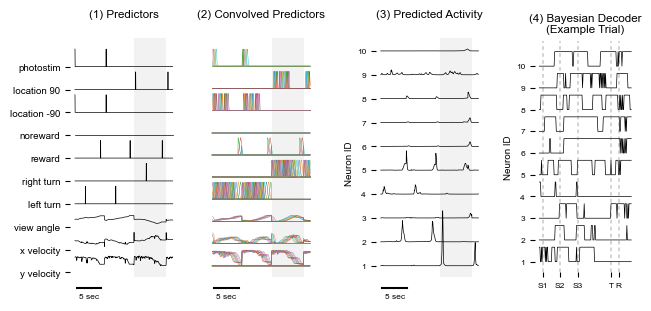

In [588]:
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches

example_dataset = [mouse_dates_keys[2]]  # e.g., ['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')
model_type = 'pre'
save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_{model_type}/'
fold_number = 0
traces_or_heatmap = 'traces'  # 'traces' or 'heatmap'

frames = range(6000,6600) #(5990,6150)
path = os.path.join(save_directory, f"prepost trial cv 73 #{fold_number+1}/test")
print(path)

# Load raw behavioral matrix
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix']
behav_ids = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix_ids.mat'))
behav_matrix_ids_raw = behav_ids['behav_the_matrix_ids'][0]

# Load convolved behavioral matrix
behav = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix.mat'))
behav_big_matrix = behav['behav_big_matrix']

behav_big_ids = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix_ids.mat'))
behav_big_matrix_ids = behav_big_ids['behav_big_matrix_ids'][0]

# Load condition array trials (to get trial/frame relationships)
condition_array = scipy.io.loadmat(os.path.join(path, 'condition_array_trials.mat'))
condition_array_trials = condition_array['condition_array_trials']
# Load combined frames included
combined_frames = scipy.io.loadmat(os.path.join(path, 'combined_frames_included.mat'))  
combined_frames_included = combined_frames['combined_frames_included'].squeeze()

#load example decoder?
decoder_path = os.path.join(save_directory, f"decoding/{fold_number+1}_1/decoder_results_regular_choice.mat")
shuffle_num = 1  # MATLAB-style index
i = shuffle_num - 1  # Python index

with h5py.File(decoder_path, 'r') as f:
    decoder = f['decoder_results']
    choice_group = decoder['inputs']['choice']
    choice_info = decoder['aligned']['choice']

    # Dereference object references
    pop_ref = choice_group['pop_instantaneous_decoded_variables'][i, 0]
    sc_ref = choice_group['sc_instantaneous_decoded_variables'][i, 0]

    # The `aligned.choice` is also a cell array → get the i-th object reference
    choice_info_ref = choice_info['results'][i, 0]
    choice_info_group = f[choice_info_ref]  # dereference to group
    
    # Navigate to results → sc_instantaneous_information
    info_data = choice_info_group['sc_instantaneous_information'][()]
    testing_trials_used = choice_info_group['alignment']['trials_used']['test'][()]
    testing_trials_used = np.where(testing_trials_used)[0]  # Convert logical to indices

    # Access the actual data
    decoder_population = f[pop_ref][()]
    decoder_singlecell = f[sc_ref][()]
    decoder_singlecell_info = info_data 

_, trials_included, relative_trial_starts = get_testing_trial_frames(combined_frames_included, frames, condition_array_trials)
mask = np.isin(trials_included, testing_trials_used)
# Indices in trials_included that are also in testing_trials_used
relative_indices = np.where(mask)[0]
# Values of trials_included that are in testing_trials_used
matching_values = trials_included[relative_indices]

max_per_neuron = np.max(info_data, axis=0)  # get max for each neuron
sorted_idx = np.argsort(max_per_neuron)[::-1]  # sort descending
# reorder your plotting data and neuron IDs
sorted_info_data = info_data[:, sorted_idx]

# --- Clean and deduplicate variable names ---
flat_ids = [str(var[0]) if isinstance(var, np.ndarray) else str(var) for var in behav_matrix_ids_raw]
clean_ids = [v.replace('upcoming ', '') for v in flat_ids]

# Deduplicate while preserving order
unique_names = {}
for idx, name in enumerate(clean_ids):
    if name not in unique_names:
        unique_names[name] = idx

deduped_names = list(unique_names.keys())
deduped_indices = list(unique_names.values())

# --- Normalize original behavioral matrix ---
normalized_matrix = np.zeros_like(behav_matrix, dtype=float)
for i in range(behav_matrix.shape[0]):
    row = behav_matrix[i]
    min_val = np.min(row)
    max_val = np.max(row)
    normalized_matrix[i] = (row - min_val) / (max_val - min_val) if max_val - min_val != 0 else 0

# --- Plotting both side-by-side ---
fig, axs = plt.subplots(1, 4, figsize=(6, len(deduped_names) * 0.3), sharex=False, constrained_layout=True,gridspec_kw={'wspace': .2}) #to increase space ,gridspec_kw={'wspace': .5}
# make the subplots farther apart horizontally
# plt.subplots_adjust(wspace=.9)  # increase this number for more space

offset = 1.3

# LEFT: Original normalized variables
for i, idx in enumerate(deduped_indices):
    axs[0].plot(np.array(frames), normalized_matrix[idx, frames] + i * offset, color='black', linewidth=0.5)
axs[0].set_yticks(np.arange(len(deduped_names)) * offset)
axs[0].set_yticklabels(deduped_names, fontsize=7)
axs[0].set_title("(1) Predictors")
# axs[0].set_xlabel("Frame")
# axs[0].set_ylabel("Variables")
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].spines['bottom'].set_visible(False)
axs[0].spines['left'].set_visible(False)
axs[0].set_xticks([])
axs[0].set_xticklabels([])


# RIGHT: Convolved versions (up to 5 per original variable)
for i, name in enumerate(deduped_names):
    matches = [j for j, bigname in enumerate(behav_big_matrix_ids)
               if name in str(bigname[0])]
    print(matches, name)
    for k, idx in enumerate(matches[:]): #matches[:5]
        axs[1].plot(np.array(frames), behav_big_matrix[idx, frames] + i * offset, alpha=1, linewidth=0.3)
axs[1].set_yticks(np.arange(len(deduped_names)) * offset)
axs[1].set_yticklabels([])  # Remove right subplot yticks
axs[1].set_title("(2) Convolved Predictors")
# axs[1].set_xlabel("Frame")
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].spines['bottom'].set_visible(False)
axs[1].spines['left'].set_visible(False)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xticklabels([])

#third plot: example predicted weights for multiple neurons
model_output_behav = results_pre[example_dataset[0]]['model_output_behav']
y_pred_model = model_output_behav[fold_number]['y_pred'][frames, :] #frames x Neurons
if traces_or_heatmap == 'heatmap':
    # Plot heatmap
    im = axs[2].imshow(
        y_pred_model.T,       # neurons on y-axis, time on x-axis
        aspect='auto',           # stretch to fill axes
        origin='lower',          # neuron 0 at bottom
        cmap='binary',          # or another colormap
        vmin=0, vmax=0.025 # set color limits
    )
    # Colorbar
    cbar = plt.colorbar(im, ax=axs[2], fraction=0.046, pad=0.04, )
    cbar.set_label('Activity', fontsize=6)
else:
    # Plot traces with vertical offsets instead of heatmap
    offset = 0.25 #0.025  # vertical spacing between neurons
    n_neurons = 10 #y_pred_model.shape[1]

    for i in range(n_neurons):
        axs[2].plot(
            np.array(frames),
            y_pred_model[:, sorted_idx[i]] + i * offset, #i+200
            linewidth=0.5,
            color='black'
        )

# Labels
# axs[2].set_xlabel('Frames')
# axs[2].set_ylabel('Neurons')
axs[2].set_title("(3) Predicted Activity")
axs[2].set_xticks([])
neuron_start_id = 1  # since you’re plotting i+200
axs[2].set_yticks(np.arange(n_neurons) * offset)
axs[2].set_yticklabels([str(i + neuron_start_id) for i in range(n_neurons)], fontsize=6)
axs[2].set_ylabel("Neuron ID", fontsize=7, rotation=90, labelpad=2)  # <-- adds the extra label
axs[2].set_xticklabels([])
axs[2].spines['top'].set_visible(False)
axs[2].spines['right'].set_visible(False)
axs[2].spines['bottom'].set_visible(False)
axs[2].spines['left'].set_visible(False)

#add optional rectangle to highlight trial
highlight_trial = relative_indices # set to None if no highlight desired
# ==============================
# Optional rectangle highlight
# ==============================
for ax in axs[:3]:
    if highlight_trial is not None:
        # trial indices are 1-based in your description
        trial_idx = highlight_trial - 1  
        x_start = relative_trial_starts[trial_idx] + frames[0]  # adjust for actual frame indices
        if trial_idx < len(relative_trial_starts) - 1:
            x_end = relative_trial_starts[trial_idx + 1] - 1 + frames[0]  # adjust for actual frame indices
        else:
            x_end = frames[-1]  # until end of data

        ylims = ax.get_ylim()#axs[2].get_ylim()
        # rectangle spans full y-limits
        rect = patches.Rectangle((x_start, ylims[0]),
                                    x_end - x_start,
                                    ylims[1] - ylims[0],
                                    linewidth=0,
                                    facecolor="gray",
                                    alpha=0.1,
                                    zorder=-1)  # send behind traces
        ax.add_patch(rect)#axs[2].add_patch(rect)

# Define scale bar parameters
# after plotting everything in axs[0], axs[1], axs[2]
# add a horizontal scalebar to axs[0:3]
scalebar_length = 30 *5  # in frames
scalebar_height = 0.5  # y-position just below traces
scalebar_color = "black"
scalebar_linewidth = 1.5

for ax in axs[:3]:
    xmin = frames[0]
    scalebar_start = xmin + 10  # small offset from left edge
    scalebar_end = scalebar_start + scalebar_length
    
    ylims = ax.get_ylim()
    y_range = ylims[1] - ylims[0]
    
    # place scalebar just below traces (5% of axis range)
    y_pos = ylims[0] - 0.05 * y_range  
    
    ax.plot([scalebar_start, scalebar_end],
            [y_pos, y_pos],
            color=scalebar_color,
            linewidth=scalebar_linewidth)

    # optional label under scalebar
    ax.text((scalebar_start + scalebar_end) / 2,
            y_pos - 0.02 * y_range,
            f"{scalebar_length/30:.0f} sec",
            ha='center', va='top', fontsize=6)
    

#fourth plot: decoder
# Plot traces with vertical offsets instead of heatmap
offset = 1.5  # vertical spacing between neurons
n_neurons = 10 #y_pred_model.shape[1]
trial_id = np.where(np.isin(testing_trials_used,trials_included))[0] #which trial to plot
for i in range(n_neurons):
    axs[3].plot(
        decoder_singlecell[:, trial_id,sorted_idx[i]] + i * offset, # frames, trials, neurons (169, 16, 377)
        linewidth=0.5,
        color='black'
    )
    # axs[3].plot(
    #     decoder_singlecell_info[:,sorted_idx[i]] + i * offset, # frames, trials, neurons (169, 16, 377)
    #     linewidth=0.5,
    #     color='magenta'
    # )
    event_frames = [6., 38., 70., 131., 145.]
    event_labels = ['S1', 'S2', 'S3', 'T', 'R']
    for frame, event_label in zip(event_frames, event_labels):
        axs[3].axvline(x=frame, color='gray', linestyle=(0, (25, 25)), alpha=0.5, linewidth=0.1)
axs[3].set_title('(4) Bayesian Decoder\n(Example Trial)')
axs[3].set_xticks([])
neuron_start_id = 1  # since you’re plotting i+200
axs[3].set_yticks(np.arange(n_neurons) * offset)
axs[3].set_yticklabels([str(i + neuron_start_id) for i in range(n_neurons)], fontsize=6)
axs[3].set_ylabel("Neuron ID", fontsize=7, rotation=90, labelpad=2)  # <-- adds the extra label
axs[3].set_xticklabels([])
axs[3].spines['top'].set_visible(False)
axs[3].spines['right'].set_visible(False)
axs[3].spines['bottom'].set_visible(False)
axs[3].spines['left'].set_visible(False)
axs[3].set_xticks(event_frames)
axs[3].set_xticklabels(event_labels, fontsize=6)
# Get reference box from subplot 0 (or any other)
ref_pos = axs[0].get_position()

# Force subplot 3 to match vertical alignment
pos3 = axs[3].get_position()
axs[3].set_position([pos3.x0+0.15, ref_pos.y0, pos3.width, ref_pos.height])





# plt.tight_layout()
plt.savefig(f'{plotter.save_results}/ex_predictors_wneurons_{example_dataset}_fold{fold_number}.pdf', bbox_inches='tight')
plt.show()




V:/Connie/ProcessedData/HA2-1L/2023-04-12/GLM_3nmf_pre/prepost trial cv 73 #1/test
[78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93] y velocity
[94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109] x velocity
[110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121] view angle
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38] left turn
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77] right turn
[122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139] reward
[130, 131, 132, 133, 134, 135, 136, 137, 138, 139] noreward
[140, 141, 142, 143, 144, 145, 152, 153, 154, 155, 156, 157, 164, 165, 166, 167, 168, 169] location -90
[146, 147, 148, 149, 150, 151, 158, 159, 160, 161, 162, 163, 170, 171, 172, 173, 174, 175] locat

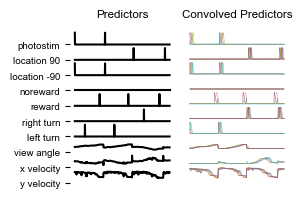

In [ ]:
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np

example_dataset = [mouse_dates_keys[2]]  # e.g., ['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')
model_type = 'pre'
save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_{model_type}/'
fold_number = 0

frames = range(6000,6600) #(5990,6150)
path = os.path.join(save_directory, f"prepost trial cv 73 #{fold_number+1}/test")
print(path)

# Load raw behavioral matrix
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix']

behav_ids = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix_ids.mat'))
behav_matrix_ids_raw = behav_ids['behav_the_matrix_ids'][0]

# Load convolved behavioral matrix
behav = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix.mat'))
behav_big_matrix = behav['behav_big_matrix']

behav_big_ids = scipy.io.loadmat(os.path.join(path, 'behav_big_matrix_ids.mat'))
behav_big_matrix_ids = behav_big_ids['behav_big_matrix_ids'][0]

# --- Clean and deduplicate variable names ---
flat_ids = [str(var[0]) if isinstance(var, np.ndarray) else str(var) for var in behav_matrix_ids_raw]
clean_ids = [v.replace('upcoming ', '') for v in flat_ids]

# Deduplicate while preserving order
unique_names = {}
for idx, name in enumerate(clean_ids):
    if name not in unique_names:
        unique_names[name] = idx

deduped_names = list(unique_names.keys())
deduped_indices = list(unique_names.values())

# --- Normalize original behavioral matrix ---
normalized_matrix = np.zeros_like(behav_matrix, dtype=float)
for i in range(behav_matrix.shape[0]):
    row = behav_matrix[i]
    min_val = np.min(row)
    max_val = np.max(row)
    normalized_matrix[i] = (row - min_val) / (max_val - min_val) if max_val - min_val != 0 else 0

# --- Plotting both side-by-side ---
fig, axs = plt.subplots(1, 2, figsize=(3, len(deduped_names) * 0.2), sharex=True)

offset = 1.3

# LEFT: Original normalized variables
for i, idx in enumerate(deduped_indices):
    axs[0].plot(np.array(frames), normalized_matrix[idx, frames] + i * offset, color='black')
axs[0].set_yticks(np.arange(len(deduped_names)) * offset)
axs[0].set_yticklabels(deduped_names, fontsize=7)
axs[0].set_title("Predictors")
# axs[0].set_xlabel("Frame")
# axs[0].set_ylabel("Variables")
axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].spines['bottom'].set_visible(False)
axs[0].spines['left'].set_visible(False)
axs[0].set_xticks([])
axs[0].set_xticklabels([])


# RIGHT: Convolved versions (up to 5 per original variable)
for i, name in enumerate(deduped_names):
    matches = [j for j, bigname in enumerate(behav_big_matrix_ids)
               if name in str(bigname[0])]
    print(matches, name)
    for k, idx in enumerate(matches[:5]): #
        axs[1].plot(np.array(frames), behav_big_matrix[idx, frames] + i * offset, alpha=1, linewidth=0.3)
axs[1].set_yticks(np.arange(len(deduped_names)) * offset)
axs[1].set_yticklabels([])  # Remove right subplot yticks
axs[1].set_title("Convolved Predictors")
# axs[1].set_xlabel("Frame")
axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].spines['bottom'].set_visible(False)
axs[1].spines['left'].set_visible(False)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xticklabels([])

plt.tight_layout()
plt.savefig(f'{plotter.save_results}/ex_predictors.pdf', bbox_inches='tight')
plt.show()




In [42]:
import scipy
example_dataset =[mouse_dates_keys[0]] #['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')
fold = 0
#find robust neurons based on pre or passive
model_output_all = results_pre[example_dataset[0]]['model_output_all']
model_output_behav = results_pre[example_dataset[0]]['model_output_behav']
# full = model_output_all[fold]
# behav = model_output_behav[fold]
folds = model_output_all.keys()
all_diffs = np.array([
    model_output_all[fold]['frac_dev_expl'] - model_output_behav[fold]['frac_dev_expl']
    for fold in folds
])
mean_diff = np.mean(all_diffs, axis=0)
std_diff = np.std(all_diffs, axis=0)
robust_mask = (mean_diff > 0.1) & (std_diff < 0.05)
save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_pre/'
fold_number = 0
path = os.path.join(save_directory, "prepost trial cv 73 #{}/test".format(fold_number+1))
response = scipy.io.loadmat(os.path.join(path, 'combined_response.mat'))
response_matrix = response['combined_response']
#response_matrix[response_matrix > 0.05] = 1 #binarized result
response_matrix = response_matrix[:,:]

corrs = [np.corrcoef(model_output_all[fold]['y_pred'][:, i], response_matrix[i])[0, 1]
         for i in range(response_matrix.shape[0])]

# Handle any NaNs (e.g., if no variance in spike train)
correlations = np.nan_to_num(corrs, nan=0.0)

# Sort neuron indices by correlation (descending)
sorted_corr_indices = np.argsort(correlations)[::-1]
sorted_corr_values = correlations[sorted_corr_indices]

# Print top 10 for inspection
for i in range(10):
    print(f"Neuron {sorted_corr_indices[i]} | Corr: {sorted_corr_values[i]:.3f}")

print(np.where(robust_mask))

Neuron 256 | Corr: 0.600
Neuron 268 | Corr: 0.436
Neuron 48 | Corr: 0.401
Neuron 278 | Corr: 0.398
Neuron 199 | Corr: 0.391
Neuron 330 | Corr: 0.391
Neuron 103 | Corr: 0.354
Neuron 340 | Corr: 0.334
Neuron 338 | Corr: 0.332
Neuron 89 | Corr: 0.328
(array([  7,  43,  59,  68,  72, 103, 172, 288, 366, 371], dtype=int64),)


V:/Connie/ProcessedData/HA2-1L/2023-04-12/GLM_3nmf_pre/prepost trial cv 73 #5/test
(377, 12563)
Plotting neurons: [ 3 38]


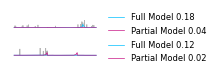

Plotting neurons: [ 3 38]


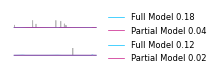

Plotting neurons: [ 3 38]


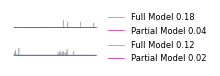

In [121]:
# PLOT EXAMPLE NEURON PREDICTIONS VS TRUE DATA FOR BOTH MODELS FOR FOLD 1
import scipy
import os
import matplotlib.pyplot as plt
import numpy as np
example_dataset =[mouse_dates_keys[2]] #['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')

supp_figure_dir = f'{save_results}/glm_coupling/supplemental'
os.makedirs(supp_figure_dir, exist_ok=True)

#find robust neurons based on pre or passive

fold_number = 4
model_type = 'pre'

save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_{model_type}/'
if model_type == 'pre':
    model_output_all = results_pre[example_dataset[0]]['model_output_all']
    model_output_behav = results_pre[example_dataset[0]]['model_output_behav']
else:
    model_output_all = results_pass[example_dataset[0]]['model_output_all']
    model_output_behav = results_pass[example_dataset[0]]['model_output_behav']
#find neurons based on pre
frac_dev_expl = model_output_all[fold_number]['frac_dev_expl']
frac_dev_expl_diff = model_output_all[fold_number]['frac_dev_expl'] - model_output_behav[fold_number]['frac_dev_expl']
frac_dev_expl_behav = model_output_behav[fold_number]['frac_dev_expl']

# 1️⃣ Set thresholds
min_diff = 0.1         # minimum difference between full and behav model
min_frac_expl = 0.1     # minimum overall fraction explained
min_behav_frac = 0.0    # minimum fraction explained for behavior-only model

# 2️⃣ Mask neurons that satisfy all criteria
mask = (frac_dev_expl_diff >= min_diff) & \
    (frac_dev_expl >= min_frac_expl) & \
    (frac_dev_expl_behav > min_behav_frac)

path = os.path.join(save_directory, "prepost trial cv 73 #{}/test".format(fold_number+1))
print(path)
# Load actual response data
response = scipy.io.loadmat(os.path.join(path, 'combined_response.mat'))
response_matrix = response['combined_response']
#response_matrix[response_matrix > 0.05] = 1 #binarized result
response_matrix = response_matrix[:,:]
print(response_matrix.shape)

corrs = [np.corrcoef(model_output_all[fold_number]['y_pred'][:, i], response_matrix[i])[0, 1]
        for i in range(response_matrix.shape[0])]

# Handle any NaNs (e.g., if no variance in spike train)
correlations = np.nan_to_num(corrs, nan=0.0)

# Sort neuron indices by correlation (descending)
sorted_corr_indices = np.argsort(correlations)[::-1]
sorted_corr_values = correlations[sorted_corr_indices]
robust_mask = (frac_dev_expl_diff > 0.05) & (correlations > 0.3)

# 3️⃣ Get indices of top neurons (sorted by frac_dev_expl within mask)
top_indices = np.argsort(frac_dev_expl[robust_mask])[::-1]

# 4️⃣ Map back to original indices
selected_neurons = np.where(mask)[0][top_indices]
sorted_indices = selected_neurons

#load behav matrix to have some sort of trial structure
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix'] #7/8 are sounds

# Example neuron IDs to plot (replace with your specific neuron IDs)
# neuronIDs = np.random.choice(response_matrix.shape[0],4, replace = False)#[0, 1, 2, 3]  # Example list of neuron IDs
# Sort neuron IDs based on frac_dev_expl (descending)
# frac_dev_expl = model_output_all[fold_number]['frac_dev_expl']
# frac_dev_expl_diff = model_output_all[fold_number]['frac_dev_expl'] - model_output_behav[fold_number]['frac_dev_expl']
# sorted_indices = np.argsort(frac_dev_expl_diff)[::-1]  # descending order
neuronIDs = sorted_indices[:2]  # Take top 4 [:4]
ranges = [range(i, i+500) for i in range(0, 3000, 1000)]
for frames in ranges: #[range(0,2000), range(2000,4000), range(4000,6000), range(6000,8000)]: #ranges: #
    print("Plotting neurons:", neuronIDs)
    # Create subplots for each neuron
    fig, axs = plt.subplots(len(neuronIDs), 1, figsize=(2.3,.7), sharex=True) #(4,3)
    # Plot each neuron's y_pred for both models
    for i, neuronID in enumerate(neuronIDs):
        # Extract y_pred data for neuronID from model_output_all and model_output_behav
        real_y = response_matrix[neuronID,frames] #
        y_pred_model1 = model_output_all[fold_number]['y_pred'][frames, neuronID]
        y_pred_model_behav = model_output_behav[fold_number]['y_pred'][frames, neuronID]
        # Plot y_pred for neuronID from both models in the i-th subplot
        # axs[i].plot(behav_matrix[7,frames],color = [0.9, 0.9, 0.9 ] , label='Sound Onset 1')
        # axs[i].plot(behav_matrix[8,frames],color = [0.8, 0.8, 0.8 ] , label='Sound Onset 2')
        axs[i].plot(real_y,color = [0.7, 0.7, 0.7 ] , linewidth=.5) #, label='Deconvolved'
        axs[i].plot(y_pred_model1, label=f"Full Model {model_output_all[fold_number]['frac_dev_expl'][neuronID]:.2f}",color = plotter.default_colors_model_type['full'] , linewidth=.5) #[0.4, 0.4, 1 ]
        axs[i].plot(y_pred_model_behav,label=f"Partial Model {model_output_behav[fold_number]['frac_dev_expl'][neuronID]:.2f}",color = plotter.default_colors_model_type['behav'], linewidth=.5) #[0.8, 0.5, 1]
        # Set title and labels for the subplot
        # axs[i].set_title(f'Neuron {neuronID} ') # Comparison between Coupling and no Coupling Model
        # axs[i].set_xlabel('Frames')
        axs[i].set_ylabel('Prediction Value')

        # remove box for each subplot
        axs[i].spines['top'].set_visible(False)
        axs[i].spines['right'].set_visible(False)
        # axs[i].spines['bottom'].set_visible(False)
        # axs[i].spines['left'].set_visible(False)
        axs[i].axis('off')
        # Add legend to the subplot
        axs[i].legend(frameon=False, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=6)
    # Adjust layout and display
    plt.tight_layout()
    os.chdir(supp_figure_dir)
    plt.savefig(f'ex_neurons_{neuronIDs}_{animalID}_{date}_{model_type}_fold{fold_number}_{frames[0]}to{frames[-1]}.pdf')
    plt.show()

V:/Connie/ProcessedData/HA2-1L/2023-04-12/GLM_3nmf_passive/prepost trial cv 73 #5/test
(377, 5249)


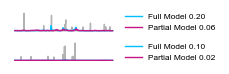

In [267]:
# PLOT EXAMPLE NEURON PREDICTIONS VS TRUE DATA FOR BOTH MODELS FOR FOLD 1
import scipy
example_dataset =[mouse_dates_keys[2]] #['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')

fold_number = 4
model_type = 'pass'
if model_type == 'pre':
    save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_pre/'
    model_output_all = results_pre[example_dataset[0]]['model_output_all']
    model_output_behav = results_pre[example_dataset[0]]['model_output_behav']
    #find neurons based on pre
    frac_dev_expl = model_output_all[fold_number]['frac_dev_expl']
    frac_dev_expl_diff = model_output_all[fold_number]['frac_dev_expl'] - model_output_behav[fold_number]['frac_dev_expl']
    sorted_indices = [350,201] #np.argsort(frac_dev_expl_diff)[::-1]  # descending order
else:
    save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_passive/'
    model_output_all = results_pass[example_dataset[0]]['model_output_all']
    model_output_behav = results_pass[example_dataset[0]]['model_output_behav']


frames = range(1500,2000) #range(0,3000) #range(0,600) #range(0,3000)#range(0,600)
path = os.path.join(save_directory, "prepost trial cv 73 #{}/test".format(fold_number+1))
print(path)
# Load actual response data
response = scipy.io.loadmat(os.path.join(path, 'combined_response.mat'))
response_matrix = response['combined_response']
#response_matrix[response_matrix > 0.05] = 1 #binarized result
response_matrix = response_matrix[:,:]
print(response_matrix.shape)
#load behav matrix to have some sort of trial structure
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix'] #7/8 are sounds

# Example neuron IDs to plot (replace with your specific neuron IDs)
# neuronIDs = np.random.choice(response_matrix.shape[0],4, replace = False)#[0, 1, 2, 3]  # Example list of neuron IDs
# Sort neuron IDs based on frac_dev_expl (descending)
# frac_dev_expl = model_output_all[fold_number]['frac_dev_expl']
# frac_dev_expl_diff = model_output_all[fold_number]['frac_dev_expl'] - model_output_behav[fold_number]['frac_dev_expl']
# sorted_indices = np.argsort(frac_dev_expl_diff)[::-1]  # descending order
neuronIDs = sorted_indices[:2]  # Take top 4 [:4]

# Create subplots for each neuron
fig, axs = plt.subplots(len(neuronIDs), 1, figsize=(2.3,.7), sharex=True) #(4,3)
# Plot each neuron's y_pred for both models
for i, neuronID in enumerate(neuronIDs):
    # Extract y_pred data for neuronID from model_output_all and model_output_behav
    real_y = response_matrix[neuronID,frames] #
    y_pred_model1 = model_output_all[fold_number]['y_pred'][frames, neuronID]
    y_pred_model_behav = model_output_behav[fold_number]['y_pred'][frames, neuronID]
    # Plot y_pred for neuronID from both models in the i-th subplot
    # axs[i].plot(behav_matrix[7,frames],color = [0.9, 0.9, 0.9 ] , label='Sound Onset 1')
    # axs[i].plot(behav_matrix[8,frames],color = [0.8, 0.8, 0.8 ] , label='Sound Onset 2')
    axs[i].plot(real_y,color = [0.7, 0.7, 0.7 ] , linewidth=1) #, label='Deconvolved'
    axs[i].plot(y_pred_model1, label=f"Full Model {model_output_all[fold_number]['frac_dev_expl'][neuronID]:.2f}",color = plotter.default_colors_model_type['full'] , linewidth=1) #[0.4, 0.4, 1 ]
    axs[i].plot(y_pred_model_behav,label=f"Partial Model {model_output_behav[fold_number]['frac_dev_expl'][neuronID]:.2f}",color = plotter.default_colors_model_type['behav'], linewidth=1) #[0.8, 0.5, 1]
    # Set title and labels for the subplot
    # axs[i].set_title(f'Neuron {neuronID} ') # Comparison between Coupling and no Coupling Model
    # axs[i].set_xlabel('Frames')
    axs[i].set_ylabel('Prediction Value')

    # remove box for each subplot
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    # axs[i].spines['bottom'].set_visible(False)
    # axs[i].spines['left'].set_visible(False)
    axs[i].axis('off')
    # Add legend to the subplot
    axs[i].legend(frameon=False, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=6)
# Adjust layout and display
plt.tight_layout()
os.chdir(supp_figure_dir)
plt.savefig(f'ex_neurons_{neuronIDs}_'+animalID+'_'+date+'_'+model_type+'.pdf')
plt.show()

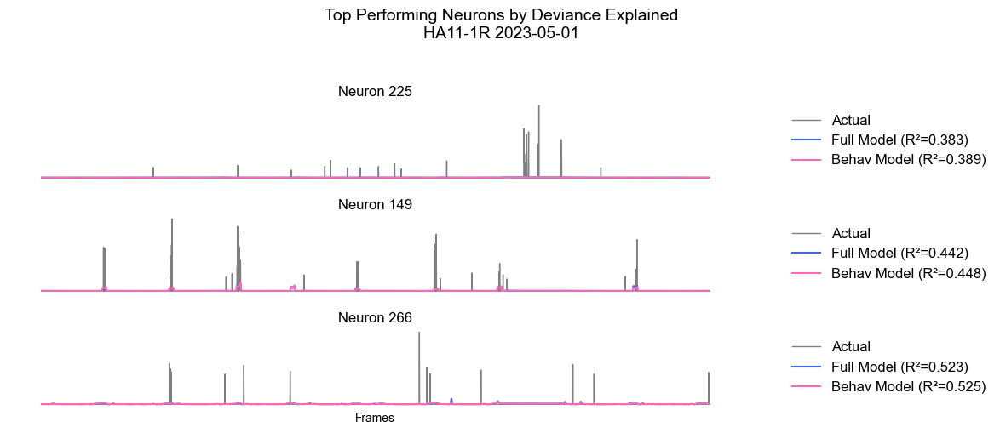


Plotted neurons summary:
Neuron 225: Full Model R² = 0.383, Behav Model R² = 0.389
Neuron 149: Full Model R² = 0.442, Behav Model R² = 0.448
Neuron 266: Full Model R² = 0.523, Behav Model R² = 0.525


In [116]:
# PLOT TOP PERFORMING NEURONS BY DEVIANCE EXPLAINED
import scipy
example_dataset = ['HA11-1R_2023-05-01']
animalID, date = example_dataset[0].split('_')
model_type = 'pre'
save_directory = f'V:/Connie/ProcessedData/{animalID}/{date}/GLM_3nmf_{model_type}/'
fold_number = 0
model_output_all = results_pre[example_dataset[0]]['model_output_all']
model_output_behav = results_pre[example_dataset[0]]['model_output_behav']

# Get deviance explained values and find top neurons
dev_expl_all = model_output_all[fold_number]['frac_dev_expl']
dev_expl_behav = model_output_behav[fold_number]['frac_dev_expl']

# Clean deviance values to remove outliers
def clean_dev_values(dev_values, lower_bound=-1, upper_bound=1):
    cleaned_dev = np.array(dev_values, dtype=float)
    cleaned_dev[(cleaned_dev < lower_bound) | (cleaned_dev > upper_bound)] = np.nan
    return cleaned_dev

dev_expl_all_clean = clean_dev_values(dev_expl_all)
# Get indices of top 4 neurons by deviance explained
# neuronIDs = np.argsort(dev_expl_all_clean)[-3:]
# Get indices of top 3 neurons by deviance explained, excluding NaN values
valid_neurons = ~np.isnan(dev_expl_all_clean)
neuronIDs = np.argsort(dev_expl_all_clean[valid_neurons])[-3:]
neuronIDs = np.arange(len(dev_expl_all_clean))[valid_neurons][neuronIDs]


# Load and prepare data
frames = range(0,3000)
path = os.path.join(save_directory, "prepost trial cv 73 #{}/test".format(fold_number+1))
response = scipy.io.loadmat(os.path.join(path, 'combined_response.mat'))
response_matrix = response['combined_response']
behav = scipy.io.loadmat(os.path.join(path, 'behav_the_matrix.mat'))
behav_matrix = behav['behav_the_matrix']

# Create subplots for each neuron
fig, axs = plt.subplots(len(neuronIDs), 1, figsize=(12, 5), sharex=True)

# Plot each top neuron
for i, neuronID in enumerate(neuronIDs):
    real_y = response_matrix[neuronID,frames]
    y_pred_model1 = model_output_all[fold_number]['y_pred'][frames, neuronID]
    y_pred_model_behav = model_output_behav[fold_number]['y_pred'][frames, neuronID]
    
    # Plot with enhanced styling
    # axs[i].plot(behav_matrix[7,frames], color='lightgray', alpha=0.3, label='Sound 1')
    # axs[i].plot(behav_matrix[8,frames], color='darkgray', alpha=0.3, label='Sound 2')
    axs[i].plot(real_y, color='black', alpha=0.5, label='Actual', linewidth=1)
    axs[i].plot(y_pred_model1, 
                label=f"Full Model (R²={dev_expl_all_clean[neuronID]:.3f})", 
                color='royalblue', 
                linewidth=1.5)
    axs[i].plot(y_pred_model_behav,
                label=f"Behav Model (R²={dev_expl_behav[neuronID]:.3f})", 
                color= 'hotpink', #'mediumpurple'
                linewidth=1.5)
    
    # Enhance subplot appearance
    axs[i].set_title(f'Neuron {neuronID}', fontsize=12, pad=5)
    axs[i].set_ylabel('Activity (a.u.)', fontsize=10)
    axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, frameon='false',edgecolor = 'white')
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['bottom'].set_visible(False)
    axs[i].spines['left'].set_visible(False)

    # Remove x and y axis labels
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')

    # Remove x and y ticks
    axs[i].set_xticks([])
    axs[i].set_yticks([])

    # Optional: also remove the tick labels (just to be sure)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    # axs[i].grid(True, alpha=0.2)

# Add common xlabel
axs[-1].set_xlabel('Frames', fontsize=10)

# Add overall title
fig.suptitle(f'Top Performing Neurons by Deviance Explained\n{animalID} {date}', 
             fontsize=14, y=1.02)

# Adjust layout and save
plt.tight_layout()
save_path = os.path.join(save_results, f'top_neurons_dev_expl_{animalID}_{date}_{model_type}.pdf')
plt.savefig(save_path, bbox_inches='tight', dpi=300)
plt.show()

# Print summary of plotted neurons
print("\nPlotted neurons summary:")
for neuronID in neuronIDs:
    print(f"Neuron {neuronID}: Full Model R² = {dev_expl_all_clean[neuronID]:.3f}, "
          f"Behav Model R² = {dev_expl_behav[neuronID]:.3f}")

In [101]:
save_path

'V:/Connie/results/glm/2025/updated\\top_neurons_dev_expl_HA11-1R_2023-05-05_passive.pdf'

In [50]:
# Import local utilities
from utils.dataset_processor import DatasetProcessor
from utils.cell_visualizer import CellVisualizer
# Load data from States_pupil_analysis
from helper_functions.data_pipeline import DataPipeline
pipeline = DataPipeline()
data_loaders, celltype_info = pipeline.load_data(datasets=datasets, load_celltypes=True)

# Initialize processor with alignment parameters
processor = DatasetProcessor(alignment={
    'type': 'pre',
    'data_type': 'z_dff'
})

fields_to_separate = ['condition'] #is_stim_trial, correct, condition left_turn,
# 
# Create trial divider for condition splitting
trial_divider = TrialDivider()

# Process and align all datasets
aligned_data = processor.process_datasets(
    data_loaders=data_loaders,
    celltype_info=celltype_info,
    save_string = 'passive',
    save_path='aligned_data_passive.pkl'
)

# For each dataset, create condition splits
for (animalID, date), data in aligned_data.items():
    print(f"\nProcessing {animalID} {date}")
    
    # Create condition splits
    
    all_conditions, condition_array = trial_divider.divide_trials_from_df(
        trial_info_df=data['trial_info'],
        good_trials=data['good_trials'],
        fields_to_separate=fields_to_separate
    )
    
    # Store conditions in aligned_data for later use
    aligned_data[(animalID, date)]['all_conditions'] = all_conditions
    print(f"Found {len(all_conditions)} conditions")

# Verify alignment worked
for (animalID, date), data in aligned_data.items():
    print(f"\nDataset: {animalID} {date}")
    print(f"Aligned imaging shape: {data['aligned_imaging'].shape}")
    print(f"Number of good trials: {len(data['good_trials'])}")
    print(f"Number of conditions: {len(data['all_conditions'])}")

Loading data for: Animal: HA11-1R, Date: 2023-05-05, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-04-13, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-04-12, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-05-05, Server: V:
Loading data for: Animal: HA1-00, Date: 2023-06-29, Server: V:
Loading data for: Animal: HA1-00, Date: 2023-08-28, Server: W:
Loading data for: Animal: HE4-1L1R, Date: 2023-08-21, Server: W:
Loading data for: Animal: HE4-1L1R, Date: 2023-08-24, Server: W:
Loading data for: Animal: HA10-1L, Date: 2023-04-10, Server: V:
Loading data for: Animal: HA10-1L, Date: 2023-04-17, Server: V:
Loading data for: Animal: HA10-1L, Date: 2023-04-12, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-04-07, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-05-01, Server: V:
Loading data for: Animal: HA11-1R, Date: 2023-05-02, Server: V:
Loading data for: Animal: HA2-1L, Date: 2023-04-28, Server: V:
Loading data for: Animal: HA2-1L, Date: 202

TypeError: DatasetProcessor.process_datasets() got an unexpected keyword argument 'save_string'